## Inicio del TP (librerías, lectura de datos y funciones)

Propuesta de hipótesis:

_"La red de mails será más resiliente a fallas nodales que la red de Los Miserables, debido a su tamaño, grado medio y posible distribución de conectividad más homogénea o distribuida."_


Posible pregunta:

_¿Cuál de las redes muestra mayor resiliencia estructural ante la remoción de nodos críticos, y cómo se compara esa resiliencia con la de una red aleatoria del mismo tamaño?_


Librerias

In [2]:
%%capture
!pip install powerlaw

In [6]:
import matplotlib.pyplot as plt
import os
import pandas as pd
# Números y Datos
import numpy as np

import networkx as nx

from networkx.algorithms.approximation import average_clustering

import community.community_louvain as cl

import pickle

import powerlaw
import seaborn as sns
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import normalized_mutual_info_score
print(nx.__version__)

3.4.2


Bajar Datos

In [ ]:
!wget -O email.txt https://www.dropbox.com/scl/fi/w5o34b0olg7xek4s42lml/email-Eu-core.txt?rlkey=g2561imdd4ssyrwfgywrotzwm&st=czqgmef0&dl=1
!wget -O email_labels.txt  https://www.dropbox.com/scl/fi/ij3b6jul7ispiovt18sfm/email-Eu-core-department-labels.txt?rlkey=dqp60qw20pw7biil9cvti4u68&st=zij9wsi8&dl=1
!wget -O lesmiserables.txt https://www.dropbox.com/scl/fi/ex7183k4zjgxbiw0diwi3/lesmiserables.txt?rlkey=zx5u5371s7gw3jlv50363jycf&dl=1
!wget -O email_pos.pkl https://www.dropbox.com/scl/fi/loeuul6gxq7uscd1m7ks8/email_positions.pkl?rlkey=caf194s8198pffo2zaq6767jz&st=kw0c3tu4&dl=1

--2025-05-02 12:18:36--  https://www.dropbox.com/scl/fi/w5o34b0olg7xek4s42lml/email-Eu-core.txt?rlkey=g2561imdd4ssyrwfgywrotzwm
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://uc288dc223cea62a65ad07766f5e.dl.dropboxusercontent.com/cd/0/inline/Co47D2PEtwcLjDd1GrYUlNlUwtGGjiOqOgQZlh82lolD1PTDockUHBi41l2SF-_FTyrw_myyI0B7XPt51XMXPJqtNDcFUdUBhI4coLtgQynFHcksRzhLHwF8AS_53sNhwJ7jo-wtw6y0YN807RuHDrWZ/file# [following]
--2025-05-02 12:18:36--  https://uc288dc223cea62a65ad07766f5e.dl.dropboxusercontent.com/cd/0/inline/Co47D2PEtwcLjDd1GrYUlNlUwtGGjiOqOgQZlh82lolD1PTDockUHBi41l2SF-_FTyrw_myyI0B7XPt51XMXPJqtNDcFUdUBhI4coLtgQynFHcksRzhLHwF8AS_53sNhwJ7jo-wtw6y0YN807RuHDrWZ/file
Resolving uc288dc223cea62a65ad07766f5e.dl.dropboxusercontent.com (uc288dc223cea62a65ad07766f5e.dl.dropboxusercontent.com)... 162.125.1.15, 2

Funciones para el análisis

In [ ]:
def read_graph(filename):
    G = nx.Graph()
    array = np.loadtxt(filename, dtype=int)
    G.add_edges_from(array)
    return G


def read_graph_weighted(filename):
    G = nx.Graph()
    array = np.loadtxt(filename, dtype=int)
    G.add_weighted_edges_from(array)
    return G

def read_dir_graph(filename):
    G = nx.DiGraph()
    array = np.loadtxt(filename, dtype=int)
    G.add_edges_from(array)
    return G

def read_dir_graph_weighted(filename):
    G = nx.DiGraph()
    array = np.loadtxt(filename, dtype=int)
    G.add_weighted_edges_from(array)
    return G

def get_graph_pos(filename):
  with open(filename, 'rb') as f:
    posData = pickle.load(f)
  return posData

In [ ]:
def drop_weights(G):
    '''Drop the weights from a networkx weighted graph.'''
    for node, edges in nx.to_dict_of_dicts(G).items():
        for edge, attrs in edges.items():
            attrs.pop('weight', None)

In [ ]:
def sample_path_lengths(G, nodes=None, trials=1000):
    if nodes is None:
        nodes = list(G)
    else:
        nodes = list(nodes)

    pairs = np.random.choice(nodes, (trials, 2))
    lengths = [nx.shortest_path_length(G, *pair)
               for pair in pairs]
    return lengths

def estimate_path_length(G, nodes=None, trials=1000):
    return np.mean(sample_path_lengths(G, nodes, trials))

## Preludio (se leen los dataframes y se crea la red de departamentos)

In [ ]:
#pip install networkx==2.8.8 #nota de Lucas: esta la tuve que correr yo porque no me hacía el grafo de la componente gigante

Lectura de las 2 redes, creación de red no pesada de los miserables,

#### Red de departamentos (emails con labels)

In [ ]:
# visualizar los departamentos de cada email
array = np.loadtxt('email_labels.txt', dtype=int)
labelsEmail=list(array[:,1])
df=pd.DataFrame(labelsEmail)
display(df)

,0
0,1
1,1
2,21
3,21
4,21
...,...
1000,4
1001,21
1002,1
1003,6


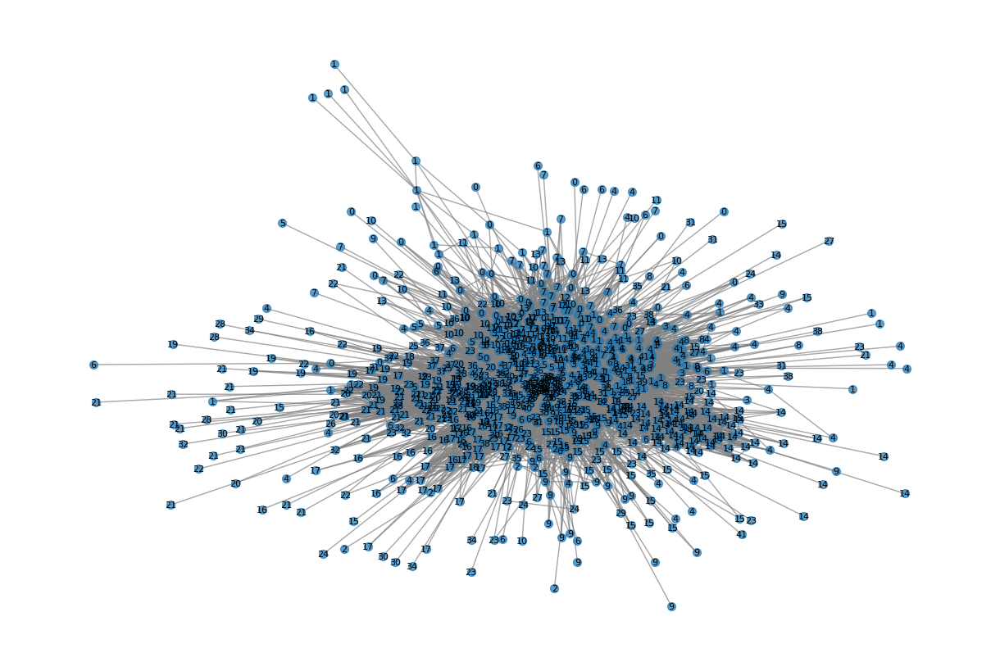

In [ ]:
# Leemos toda la info de los nodos de email
G_email = read_graph('email.txt')

# Renombro el la columna 0 como label
df = df.rename(columns={0: 'label'})
labels_dict = dict(zip(df.index, df['label']))

# Luego setear esos labels como atributo 'label' en el grafo
nx.set_node_attributes(G_email, labels_dict, name="label")

# Eliminamos los autoenlaces
G_email.remove_edges_from(nx.selfloop_edges(G_email)) # Borro autoenlaces

# Agrupamos y ordenamos los componentes conectados de mayor a menor
Gcc_email = sorted(nx.connected_components(G_email), key=len, reverse=True)


# Creamos variable de componente gigante
emailGiant = G_email.subgraph(Gcc_email[0])

# Esta parte comentada es para graficar el grafo de todos los nodos sin agrupar por departamentos
# Creamos la posición de los nodos
pos = nx.spring_layout(emailGiant, seed=42)  # El seed es para que el grafo siempre salga igual

# Dibujamos nodos y bordes
plt.figure(figsize=(12, 8))
nx.draw(emailGiant, pos, node_size=50, edge_color='gray', alpha=0.7, with_labels=False)

# Dibujamos los labels
labels = nx.get_node_attributes(emailGiant, 'label')
nx.draw_networkx_labels(emailGiant, pos, labels, font_size=8)

plt.axis('off')
plt.show()


Analizamos a los subgrafos como se relacionan entre sí

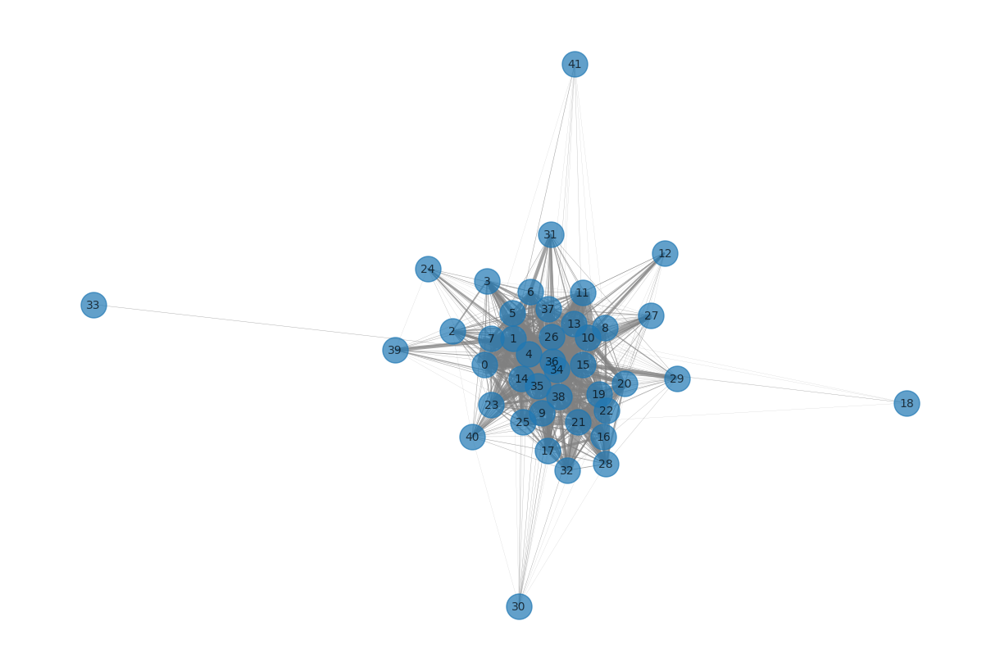

In [ ]:
# Crear un grafo nuevo donde los nodos son labels
G_labels = nx.Graph()

# Obtener los labels de cada nodo
node_labels = nx.get_node_attributes(emailGiant, 'label')

# Recorrer las aristas del grafo original
for u, v in emailGiant.edges():
    label_u = node_labels.get(u)
    label_v = node_labels.get(v)

    if label_u is not None and label_v is not None:
        if label_u != label_v:
            # Crear o reforzar la conexión entre los labels
            if G_labels.has_edge(label_u, label_v):
                G_labels[label_u][label_v]['weight'] += 1
            else:
                G_labels.add_edge(label_u, label_v, weight=1)

# Grafico de grafo de subgrafos
pos = nx.spring_layout(G_labels, seed=42)

plt.figure(figsize=(12, 8))
nx.draw(
    G_labels, pos,
    with_labels=True,
    node_size=500,
    font_size=10,
    width=[d['weight']*0.1 for (u, v, d) in G_labels.edges(data=True)],
    edge_color='gray',
    alpha=0.7
)
plt.show()



In [ ]:
# Revisión características generales del grafo
print(G_labels)
print('Es dirigido?:',nx.is_directed(G_labels))
print('Es pesado?:',nx.is_weighted(G_labels))
print('Es conectado?:',nx.is_connected(G_labels))

Graph with 42 nodes and 641 edges
Es dirigido?: False
Es pesado?: True
Es conectado?: True


In [ ]:
email = read_graph('email.txt')


In [ ]:
# Crear un diccionario que mapea cada nodo a su departamento
node_to_department = {i: labelsEmail[i] for i in range(len(labelsEmail))}

# Crear un diccionario para almacenar los subgrafos por departamento
subgraphs_by_department = {}

# Iterar sobre cada nodo para asignarlo a su subgrafo correspondiente
for node in email.nodes():
    department = node_to_department[node]
    if department not in subgraphs_by_department:
        subgraphs_by_department[department] = nx.Graph()
    subgraphs_by_department[department].add_node(node)

# Ahora agregar las aristas a cada subgrafo
for u, v in email.edges():
    dept_u = node_to_department[u]
    dept_v = node_to_department[v]
    if dept_u == dept_v:
        subgraphs_by_department[dept_u].add_edge(u, v)

#Crear el grafo entre departamentos
department_graph = nx.Graph()

# Crear la matriz ponderada (número de correos entre departamentos)
num_departments = len(set(labelsEmail))  # Número de departamentos únicos
adj_matrix = np.zeros((num_departments, num_departments))

# Recorrer las aristas del grafo de correos
for u, v in email.edges():
    dept_u = node_to_department[u]
    dept_v = node_to_department[v]

    if dept_u != dept_v:  # Asegurarse de que son departamentos diferentes
        # Contar los correos entre departamentos
        adj_matrix[dept_u, dept_v] += 1
        adj_matrix[dept_v, dept_u] += 1  # Ya que la relación es simétrica

        # Agregar la arista en el grafo entre departamentos
        if not department_graph.has_edge(dept_u, dept_v):
            department_graph.add_edge(dept_u, dept_v, weight=adj_matrix[dept_u, dept_v])
print(department_graph)
print('Es dirigido?:',nx.is_directed(department_graph))
print('Es pesado?:',nx.is_weighted(department_graph))
print('Es conectado?:',nx.is_connected(department_graph))

Graph with 42 nodes and 641 edges
Es dirigido?: False
Es pesado?: True
Es conectado?: True


# 4. Consignas

## a) Descripción de los datasets elegidos
#### Describir las características generales de cada dataset, así como sus variables topológicas que les parezcan relevantes y que hayan motivado la pregunta que se plantean.

In [ ]:
email = read_graph('email.txt')
print('Email')
print(email)
print('Es dirigido?:',nx.is_directed(email))
print('Es pesado?:',nx.is_weighted(email))
print('Es conectado?:',nx.is_connected(email))
print('La densidad es de: ', nx.density(email))
print('El coeficiente de clustering promedio es:', nx.average_clustering(email))
#print('La distancia media es:', nx.average_shortest_path_length(email))
print('La eficiencia global es: ', nx.global_efficiency(email))
print('El número de componentes es: ', nx.number_connected_components(email))
print('')

lesmis= read_graph_weighted('lesmiserables.txt')
print('Les Miserables')
print(lesmis)
print('Es dirigido?:',nx.is_directed(lesmis))
print('Es pesado?:',nx.is_weighted(lesmis))
print('Es conectado?:',nx.is_connected(lesmis))
print('La densidad es de: ', nx.density(lesmis))
print('El coeficiente de clustering es:', nx.average_clustering(lesmis))
print('La distancia media es:', nx.average_shortest_path_length(lesmis))
print('La eficiencia global es: ', nx.global_efficiency(lesmis))
print('El número de componentes es: ', nx.number_connected_components(lesmis))
print('')
lesmisU = lesmis.copy()
drop_weights(lesmisU)
print('Les Miserables (unweighted)')
print(lesmisU)
print('Es dirigido?:',nx.is_directed(lesmisU))
print('Es pesado?:',nx.is_weighted(lesmisU))
print('Es conectado?:',nx.is_connected(lesmisU))
print('')

Email
Graph with 1005 nodes and 16706 edges
Es dirigido?: False
Es pesado?: False
Es conectado?: False
La densidad es de:  0.03311331787278746
El coeficiente de clustering promedio es: 0.3993549664221539
La eficiencia global es:  0.40433941089132175
El número de componentes es:  20

Les Miserables
Graph with 77 nodes and 254 edges
Es dirigido?: False
Es pesado?: True
Es conectado?: True
La densidad es de:  0.08680792891319207
El coeficiente de clustering es: 0.5731367499320135
La distancia media es: 2.6411483253588517
La eficiencia global es:  0.43528708133971505
El número de componentes es:  1

Les Miserables (unweighted)
Graph with 77 nodes and 254 edges
Es dirigido?: False
Es pesado?: False
Es conectado?: True



In [ ]:

print('Componente Gigante Email')
print(emailGiant)
print('Es dirigido?:',nx.is_directed(emailGiant))
print('Es pesado?:',nx.is_weighted(emailGiant))
print('Es conectado?:',nx.is_connected(emailGiant))
print('La densidad es de: ', nx.density(emailGiant))
print('El coeficiente de clustering promedio es:', nx.average_clustering(emailGiant))
#print('La distancia media es:', nx.average_shortest_path_length(email))
print('La eficiencia global es: ', nx.global_efficiency(emailGiant))
print('El número de componentes es: ', nx.number_connected_components(emailGiant))
print('')



lesmisU = lesmis.copy()
drop_weights(lesmisU)
print('Les Miserables (unweighted)')
print(lesmisU)
print('Es dirigido?:',nx.is_directed(lesmisU))
print('Es pesado?:',nx.is_weighted(lesmisU))
print('Es conectado?:',nx.is_connected(lesmisU))
print('')


Componente Gigante Email
Graph with 986 nodes and 16064 edges
Es dirigido?: False
Es pesado?: False
Es conectado?: True
La densidad es de:  0.033080384262929745
El coeficiente de clustering promedio es: 0.40705044751953817
La eficiencia global es:  0.42008067501113194
El número de componentes es:  1

Les Miserables (unweighted)
Graph with 77 nodes and 254 edges
Es dirigido?: False
Es pesado?: False
Es conectado?: True



## b) Comparación con prototipos. (nota lucas: agregar la comparativa con los prototipos)
En este punto trabajar solo con grafos no dirigidos ni pesados. Asi que si eligieron un grafo que no cumpla con estas características, transformalo a un grafo no dirigido ni pesado para este punto en particular. Comparar los datasets con prototipos equivalentes de Erdos-Renyi,Watts-Strogatz y Barabasi-Albert. Explicar el interés de utilizar estos prototipos para la pregunta en cuestión. Sugerimos que comparen la distribución de grado de los datasets con la de una instancia de los prototipos, así como comparar el coeficiente de clustering medio y la distancia mínima media de los datasets con la de varias instancias de los prototipos. Discutir similitudes, diferencias en las comparaciones, validez/utilidad de los prototipos para modelar sus datasets. ¡Sean críticos de los resultados!
Opcional: si el modelo de Barabasi-Albert no es apropiado (porque resulta en redes con bajo clustering), intentar con el modelo de Holme-Kim.

In [ ]:
# Datasets seleccionados
# ---------------- Les Misèrables ----------------
G_lesmis = read_graph_weighted('lesmiserables.txt') # red no dirigida pesada conectada
G_lesmis_U = G_lesmis.copy()
drop_weights(G_lesmis_U) # red no dirigida ni pesada conectada
print(G_lesmis_U)
print('Es dirigido?:',nx.is_directed(G_lesmis_U))
print('Es pesado?:',nx.is_weighted(G_lesmis_U))
print('Es conectado?:',nx.is_connected(G_lesmis_U))
print('')

# ---------------- Email ----------------
G_email = read_graph('email.txt') # red no dirigida ni pesada ni conectada
G_email.remove_edges_from(nx.selfloop_edges(G_email))
Gcc = sorted(nx.connected_components(G_email), key=len, reverse=True)
emailGiant = G_email.subgraph(Gcc[0]) # trabajo con componente gigante
print(emailGiant)
print('Es dirigido?:',nx.is_directed(emailGiant))
print('Es pesado?:',nx.is_weighted(emailGiant))
print('Es conectado?:',nx.is_connected(emailGiant))
print('')

Graph with 77 nodes and 254 edges
Es dirigido?: False
Es pesado?: False
Es conectado?: True

Graph with 986 nodes and 16064 edges
Es dirigido?: False
Es pesado?: False
Es conectado?: True



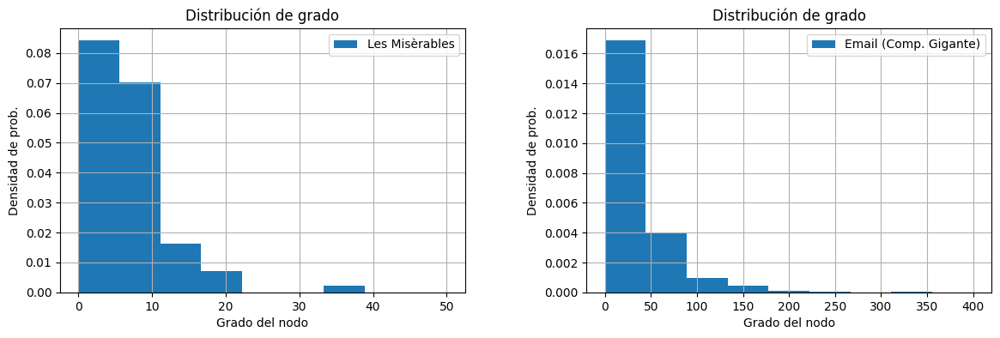

In [ ]:
# Distribución de grado
df_lesmisU_degree = pd.DataFrame(G_lesmis_U.degree, columns=['Node', 'Degree']).set_index('Node')
df_emailGiant_degree = pd.DataFrame(emailGiant.degree, columns=['Node', 'Degree']).set_index('Node')

plt.figure(figsize=(14, 4))
df_lesmisU_degree.hist(bins=np.linspace(0, 50, 10), density=True, ax=plt.subplot(121), label='Les Misèrables')
plt.legend()
plt.ylabel('Densidad de prob.')
plt.xlabel('Grado del nodo')
plt.title("Distribución de grado")

df_emailGiant_degree.hist(bins=np.linspace(0, 400, 10), density=True, ax=plt.subplot(122), label='Email (Comp. Gigante)')
plt.legend()
plt.ylabel('Densidad de prob.')
plt.xlabel('Grado del nodo')
plt.title("Distribución de grado")
plt.show()

In [ ]:
def comparacion_prototipos(grafo,instancias,nombreGrafo):
    data = []
    grado_medio = 2 * grafo.number_of_edges() / grafo.number_of_nodes()
    mcero = int(round(grado_medio / (2 - 1 / grafo.number_of_nodes())))
    for i in range(instancias):
        d = {}
        # Barabasi-Albert - Libre de escala
        G = nx.barabasi_albert_graph(grafo.number_of_nodes(), mcero, seed=i)
        d['ba_avg_clus'] = nx.average_clustering(G)
        d['ba_avg_dist'] = nx.average_shortest_path_length(G)
        d['ba_avg_degree'] = 2 * G.number_of_edges() / G.number_of_nodes()
        d['ba_alpha'] = powerlaw.Fit([d for n, d in G.degree], discrete=True, xmin=8).alpha

        # Holme-Kim
        G = nx.powerlaw_cluster_graph(grafo.number_of_nodes(), mcero, p=0.3, seed=i)#p=0.3 o 0.5, prob. formar triángulos en vez de enlaces normales; ~0->BA
        d['hk_avg_clus'] = nx.average_clustering(G)
        d['hk_avg_dist'] = nx.average_shortest_path_length(G)
        d['hk_avg_degree'] = 2 * G.number_of_edges() / G.number_of_nodes()

        # Erdos-Renyi - Aleatorio
        attempt = 0
        while True:
            G = nx.gnm_random_graph(grafo.number_of_nodes(), grafo.number_of_edges(), seed=i + attempt)
            if nx.is_connected(G):
                break
            attempt += 1
        d['er_avg_clus'] = nx.average_clustering(G)
        d['er_avg_dist'] = nx.average_shortest_path_length(G)
        d['er_avg_degree'] = 2 * G.number_of_edges() / G.number_of_nodes()

        # Watts-Strogatz - Mundo pequeño
        G = nx.watts_strogatz_graph(grafo.number_of_nodes(), int(grado_medio), 0.03)
        d['ws_avg_clus'] = nx.average_clustering(G)
        d['ws_avg_dist'] = nx.average_shortest_path_length(G)
        d['ws_avg_degree'] = 2 * G.number_of_edges() / G.number_of_nodes()

        data.append(d)

    df = pd.DataFrame(data)

    indicadores = ['avg_clus', 'avg_dist', 'avg_degree']
    modelos = ['er', 'ws', 'ba', 'hk']
    valores_reales = {
        'avg_clus': nx.average_clustering(grafo),
        'avg_dist': nx.average_shortest_path_length(grafo),
        'avg_degree': grado_medio
    }

    for ind in indicadores:
      fig, axs = plt.subplots(2, 2, figsize=(10, 8))
      axs = axs.flatten()
      for j, model in enumerate(modelos):
          col = f'{model}_{ind}'
          df[col].hist(ax=axs[j], density=True, alpha=0.7)
          axs[j].axvline(valores_reales[ind], color='r', linewidth=2)
          axs[j].set_title(f'{model.upper()} - {ind}')

      fig.suptitle(f'Comparativa de {nombreGrafo} según {ind}', fontsize=12)
      plt.tight_layout(rect=[0, 0, 1, 0.96])
      plt.show()

    return data

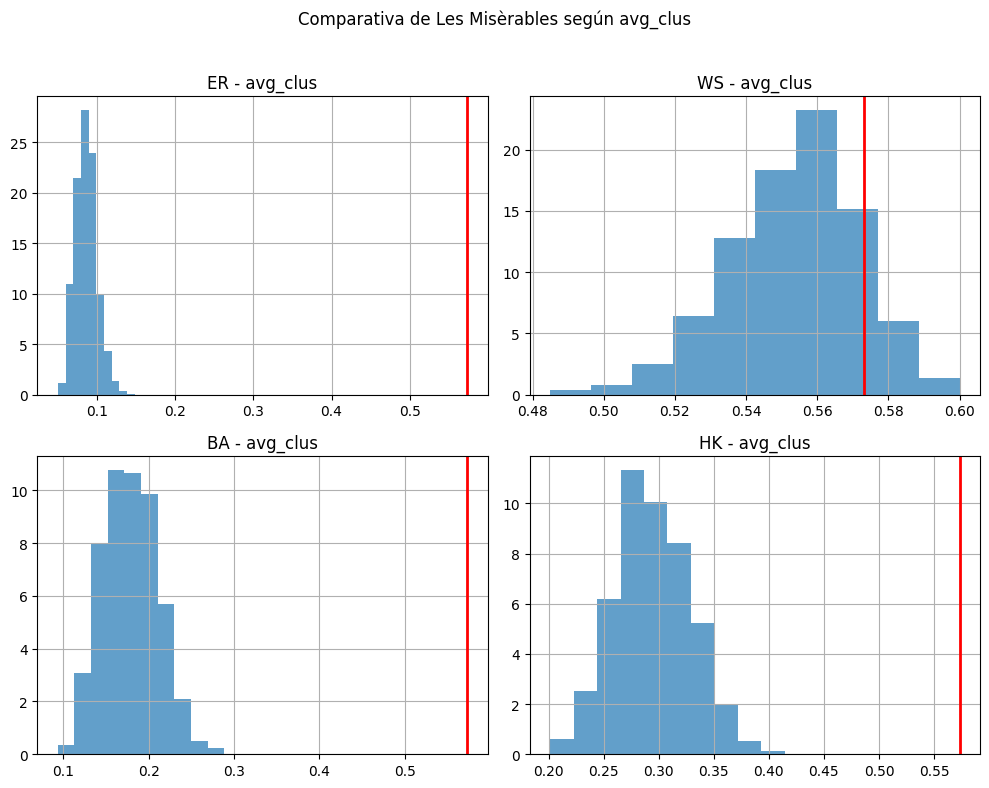

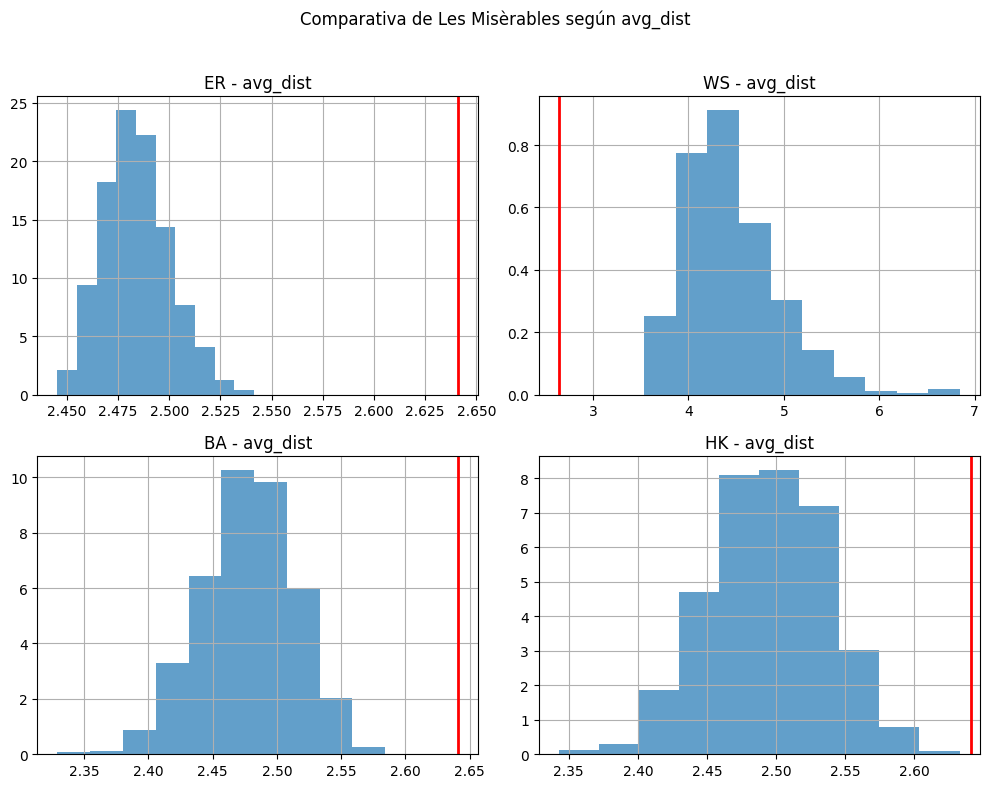

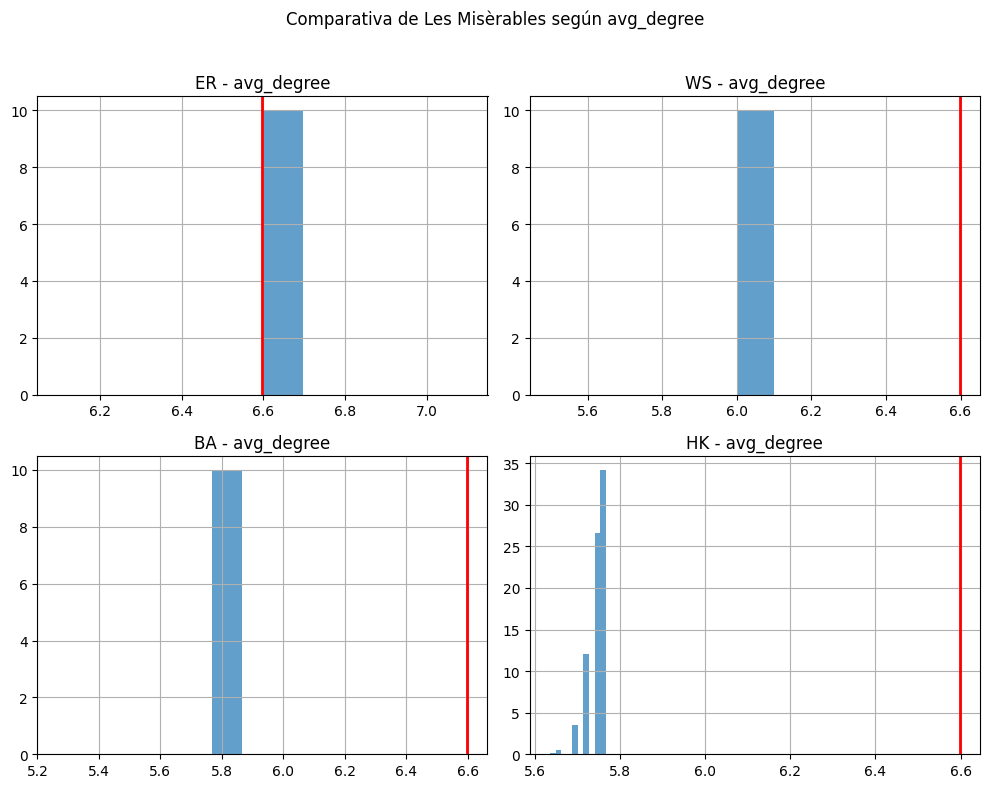

In [ ]:
data_lesmis = comparacion_prototipos(G_lesmis_U,1000,"Les Misèrables")

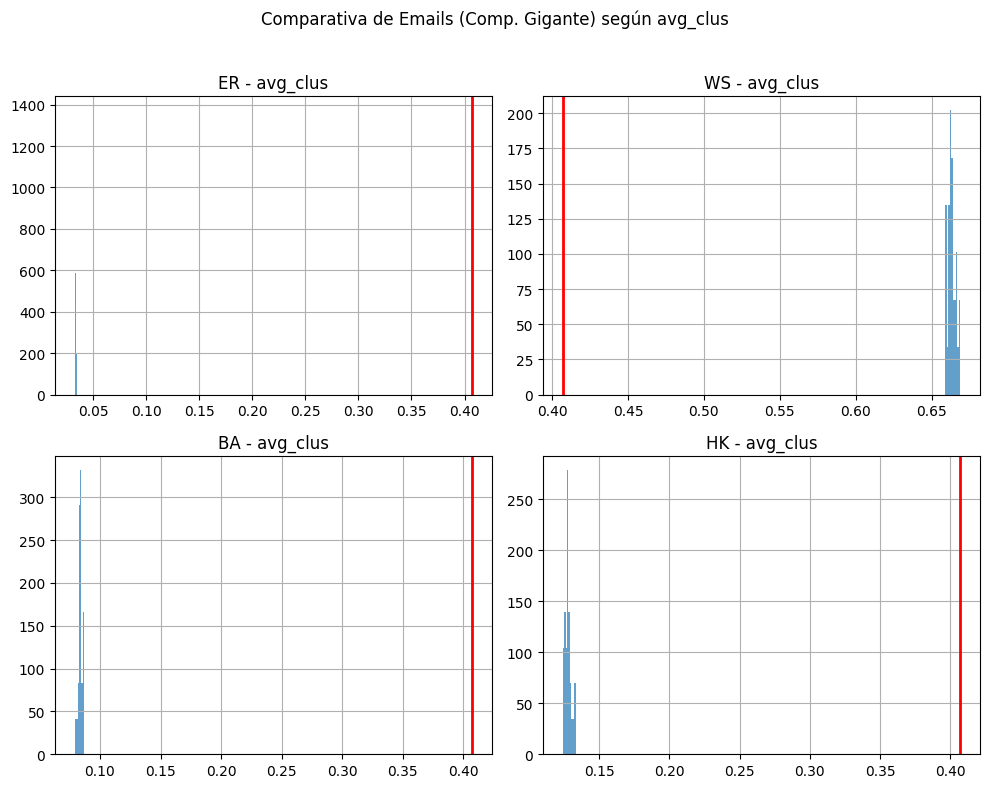

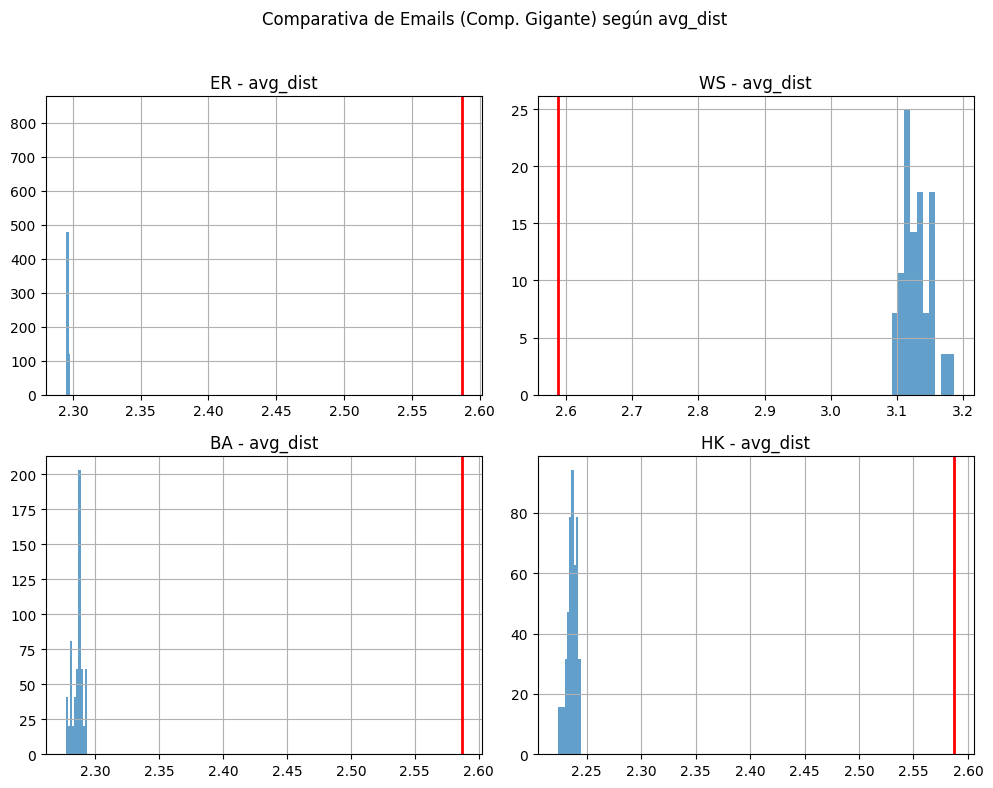

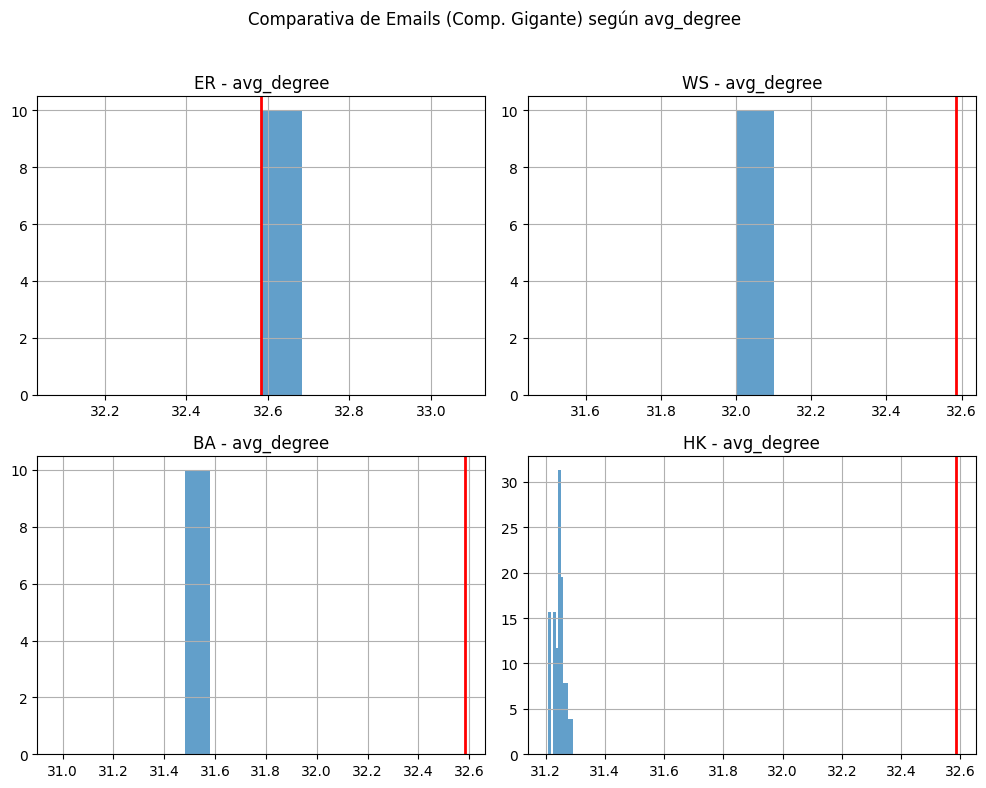

In [ ]:
data_email = comparacion_prototipos(emailGiant,30,"Emails (Comp. Gigante)")

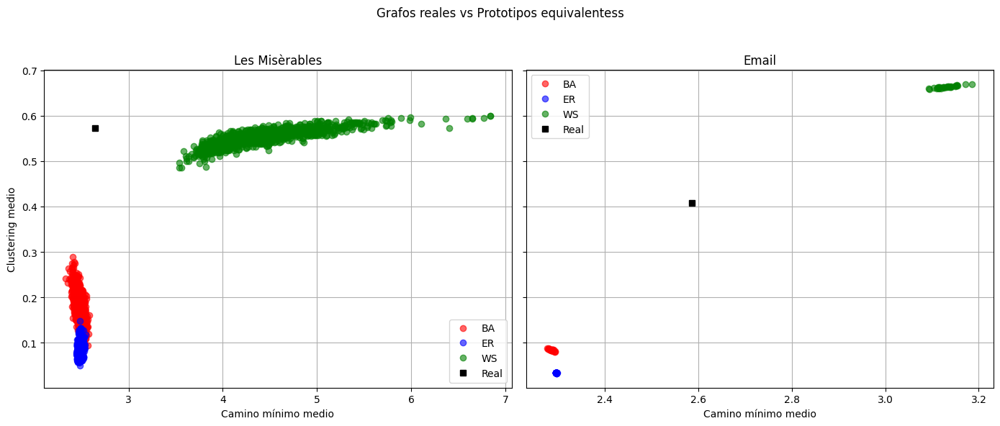

In [ ]:
modelos = ['ba', 'er', 'ws']
colores = {'ba': 'r', 'er': 'b', 'ws': 'g'}

fig, axs = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

datasets = [('Les Misèrables', data_lesmis, G_lesmis_U),
            ('Email', data_email, emailGiant)]

for ax, (name, data, G_real) in zip(axs, datasets):
    for model in modelos:
        dist = [d[f"{model}_avg_dist"] for d in data if f"{model}_avg_dist" in d]
        clus = [d[f"{model}_avg_clus"] for d in data if f"{model}_avg_clus" in d]
        ax.plot(dist, clus, f'{colores[model]}o', alpha=0.6, label=model.upper())

    ax.plot(nx.average_shortest_path_length(G_real),
            nx.average_clustering(G_real), 'ks', label='Real')

    ax.set_title(name)
    ax.set_xlabel('Camino mínimo medio')
    ax.grid(True)
    if ax == axs[0]:
        ax.set_ylabel('Clustering medio')
    ax.legend()

plt.suptitle('Grafos reales vs Prototipos equivalentess', fontsize=12)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

#### Distribuciones de grado

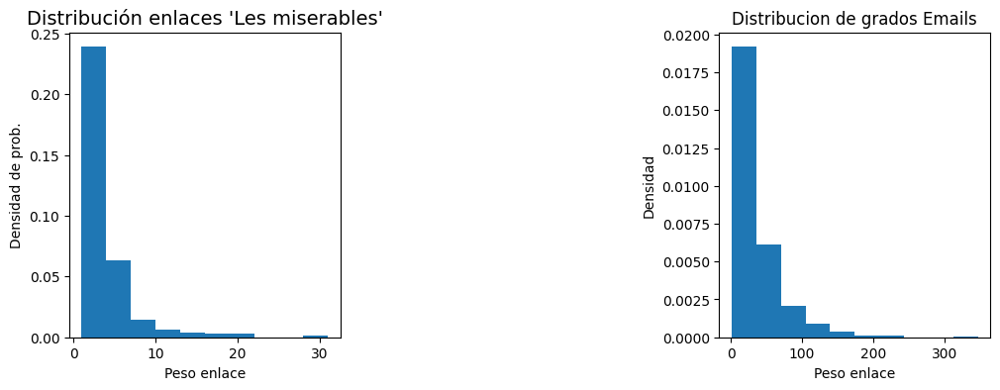

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(131)
edge_weights_mis = nx.get_edge_attributes(lesmis, "weight")
plt.hist(np.array(list(edge_weights_mis.values())), density=True);
plt.ylabel('Densidad de prob.')
plt.xlabel('Peso enlace')
plt.title('Distribución enlaces \'Les miserables\'', fontsize=14)

#plt.subplot(132)
#edge_weights_email = nx.get_edge_attributes(email, "weight")
#plt.hist(np.array(list(edge_weights_email.values())), density=True);
#plt.ylabel('Densidad de prob.')
#plt.xlabel('Peso enlace')
#plt.title('Distribución enlaces emails (es no pesada así que será vacía)', fontsize=14)
#plt.show()

plt.subplot(133)
degrees = [email.degree(n) for n in email.nodes()]
histWake, binsWake, _ = plt.hist(degrees, bins=10, density=True)
plt.xlabel('Peso enlace')
plt.ylabel('Densidad')
plt.title('Distribucion de grados Emails')
plt.show()

#### Distancia mínima media y clustering


In [ ]:
# Les Misérables (grafo conectado)
avg_shortest_path_lesmis = nx.average_shortest_path_length(lesmis)
print(f"Distancia mínima media (Les Misérables): {avg_shortest_path_lesmis:.3f}")

# Email (grafo NO conectado)
if nx.is_connected(email):
    avg_shortest_path_email = nx.average_shortest_path_length(email)
else:
    # Trabajamos con la componente gigante
    largest_cc = max(nx.connected_components(email), key=len)
    email_giant = email.subgraph(largest_cc).copy()
    email_giant.remove_edges_from(nx.selfloop_edges(G_email)) # borramos autoenlaces
    avg_shortest_path_email = nx.average_shortest_path_length(email_giant)
    print(f"Distancia mínima media (componente gigante de Email): {avg_shortest_path_email:.3f}")


Distancia mínima media (Les Misérables): 2.641
Distancia mínima media (componente gigante de Email): 2.587


In [ ]:
cc_promedio = nx.average_clustering(lesmis)
print(f"Coeficiente de clustering promedio miserables: {cc_promedio:.4f}")

print(f"Coeficiente de clustering promedio emails: {average_clustering(email, trials=2000)}")

Coeficiente de clustering promedio miserables: 0.5731
Coeficiente de clustering promedio emails: 0.4415


In [ ]:
grado_medio_obs = 2 * lesmis.number_of_edges() / lesmis.number_of_nodes()
print(f"Grado promedio ⟨k⟩ miserables: {grado_medio_obs:.4f}")

grado_medio_obs = 2 * email.number_of_edges() / email.number_of_nodes()
print(f"Grado promedio en email ⟨k⟩: {grado_medio_obs:.4f}")

Grado promedio ⟨k⟩ miserables: 6.5974
Grado promedio en email ⟨k⟩: 33.2458


## c) Análisis de centralidad de los nodos

In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

graph = lesmisU
layout = nx.spring_layout(graph, seed=42, iterations=1000)
#layout = nx.kamada_kawai_layout(graph)
# --------- Betweenness Centrality ---------
plt.figure(figsize=(20, 15))

centrality_betw = nx.betweenness_centrality(graph)
values_betw = np.array([v for _, v in centrality_betw.items()])
sizes_betw = 30 + 3000 * values_betw

nodes = nx.draw_networkx_nodes(graph, layout, node_size=sizes_betw, node_color=values_betw, cmap=plt.cm.coolwarm, alpha=0.8)
nx.draw_networkx_labels(graph, layout, font_weight='bold', font_color='black', font_size=15)
nx.draw_networkx_edges(graph, layout, width=0.5, alpha=0.8)
#plt.title("Centralidad de intermediación (betweenness) - Les Miserables", fontsize=14)
plt.colorbar(nodes)
plt.tight_layout()


NameError: name 'lesmisU' is not defined

In [ ]:
# --------- Degree Centrality ---------
plt.figure(figsize=(20, 15))

centrality_degree = nx.degree_centrality(graph)
values_degree = np.array([v for _, v in centrality_degree.items()])
sizes_degree = 30 + 3000 * values_degree

nodes2 = nx.draw_networkx_nodes(graph, layout, node_size=sizes_degree, node_color=values_degree, cmap=plt.cm.coolwarm, alpha=0.8)
nx.draw_networkx_labels(graph, layout, font_weight='bold', font_color='black', font_size=15)
nx.draw_networkx_edges(graph, layout, width=0.5, alpha=0.8)
#plt.title("Centralidad de grado - Les Miserables", fontsize=14)
plt.colorbar(nodes2)
plt.tight_layout()

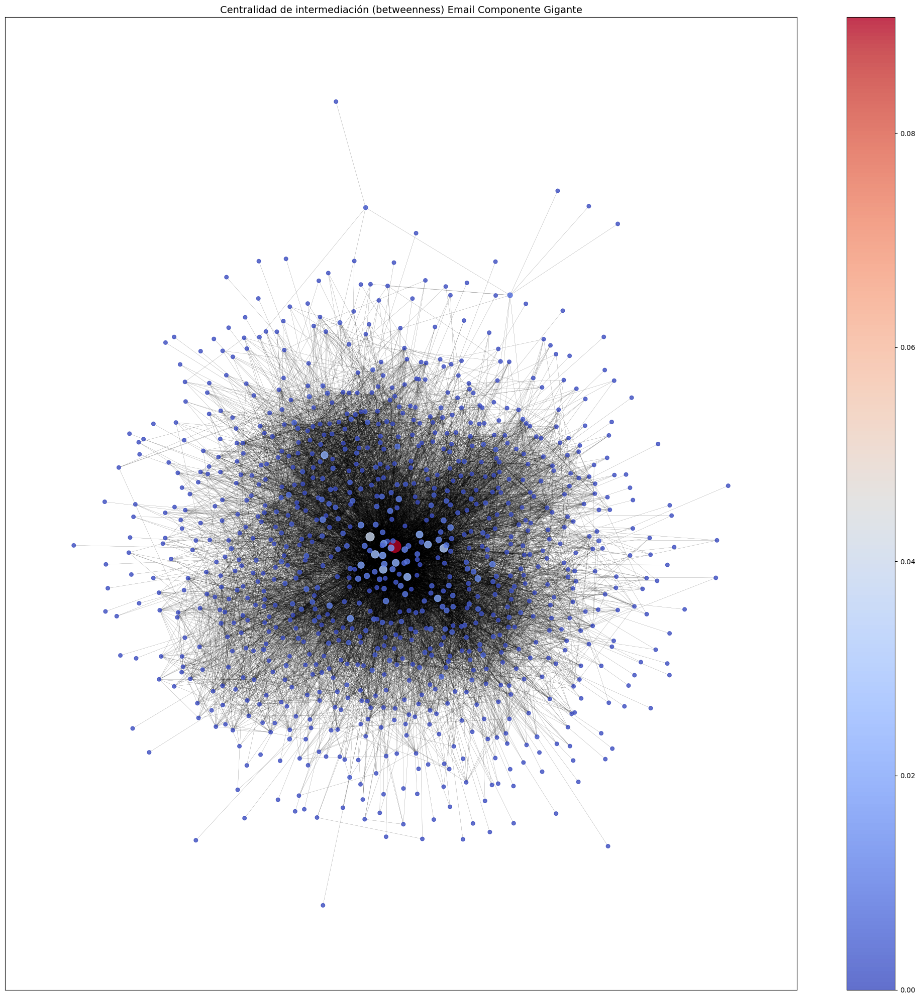

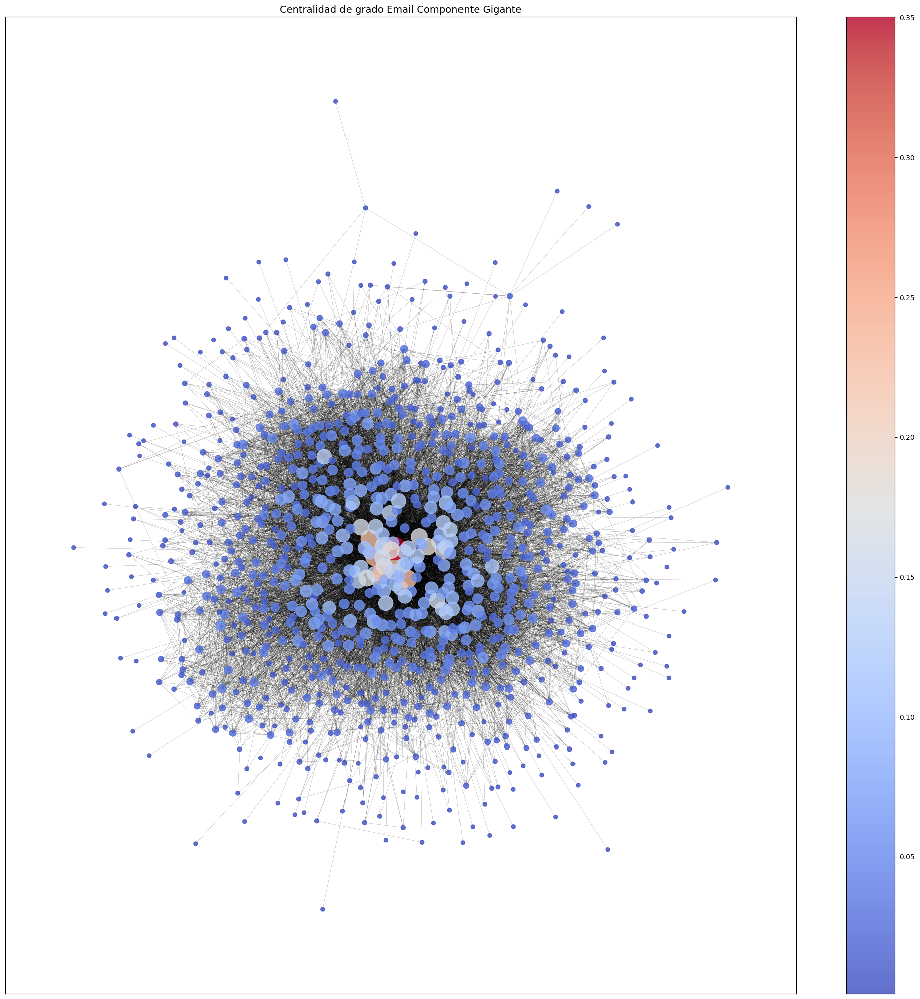

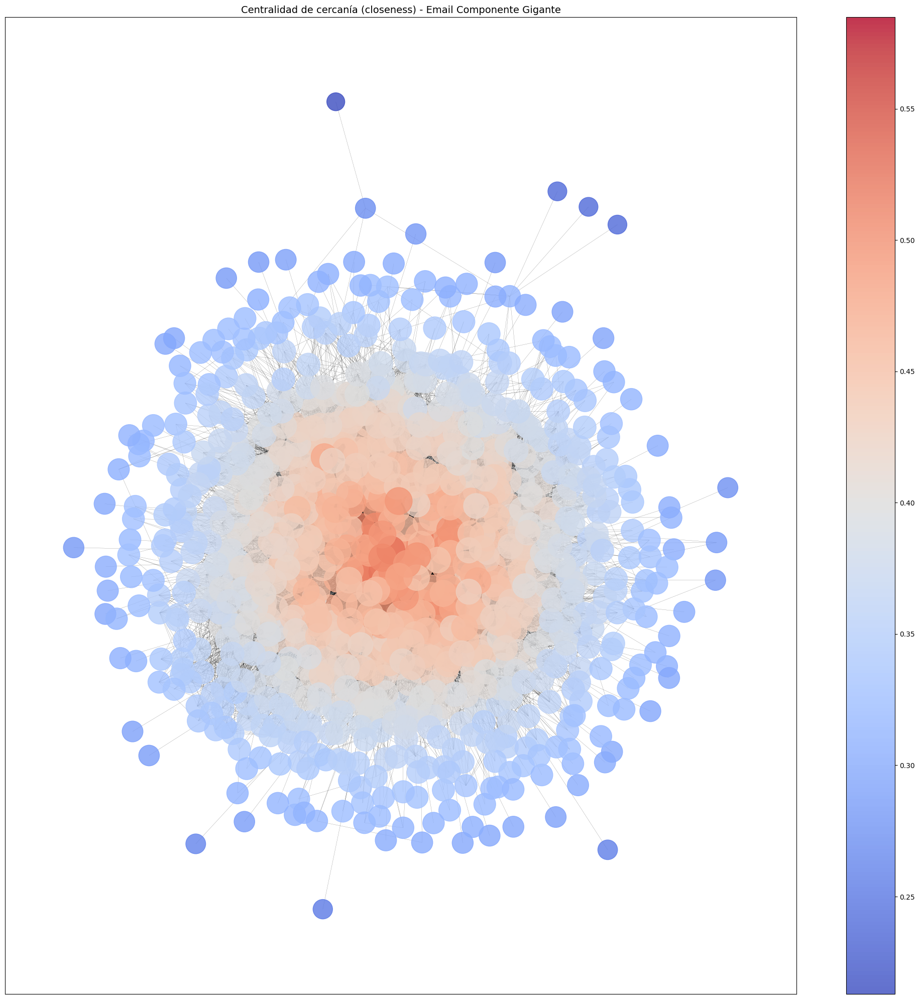

In [ ]:
graph = emailGiant
layout = nx.spring_layout(graph, seed=42,  scale=10)
#layout = nx.kamada_kawai_layout(graph)

plt.figure(figsize=(20,15))

# --------- Subplot 1: Betweenness Centrality ---------
#plt.subplot(1, 2, 1)
centrality_betw = nx.betweenness_centrality(graph)
values_betw = np.array([v for _, v in centrality_betw.items()])
sizes_betw = 30 + 3000 * values_betw  # Escalado

nodes = nx.draw_networkx_nodes(graph, layout, node_size=sizes_betw, node_color=values_betw, cmap=plt.cm.coolwarm, alpha=0.8)
#nx.draw_networkx_labels(graph, layout, font_weight='bold', font_color='black',font_size= 8)
nx.draw_networkx_edges(graph, layout, width=0.2, alpha=0.6)
#plt.title(f"Centralidad de intermediación (betweenness) Email Componente Gigante", fontsize=14)
plt.colorbar(nodes)
plt.tight_layout()

In [ ]:
# --------- Subplot 2: Degree Centrality ---------
#plt.subplot(1, 2, 2)

plt.figure(figsize=(20,15))

centrality_degree = nx.degree_centrality(graph)
values_degree = np.array([v for _, v in centrality_degree.items()])
sizes_degree = 30 + 3000 * values_degree  # Escalado


nodes2 = nx.draw_networkx_nodes(graph, layout, node_size=sizes_degree, node_color=values_degree, cmap=plt.cm.coolwarm, alpha=0.8)
#nx.draw_networkx_labels(graph, layout, font_weight='bold', font_color='black',font_size= 8)
nx.draw_networkx_edges(graph, layout, width=0.2, alpha = 0.6)
#plt.title(f"Centralidad de grado Email Componente Gigante", fontsize=14)
plt.colorbar(nodes2)

plt.tight_layout()
plt.show()


NameError: name 'plt' is not defined

### Red de correos
En la red de correos, el análisis de centralidad de grado muestra una estructura distribuida, con numerosos nodos de alta conectividad. Esto sugiere una organización donde muchas personas están involucradas activamente en el intercambio de mensajes, posiblemente reflejando roles administrativos o comunicacionales relevantes (como secretarías, jefaturas o centros de coordinación).

Sin embargo, al observar la centralidad de intermediación (betweenness), se evidencia un cambio en la distribución de importancia: muchos de los nodos con alto grado pierden centralidad, y sólo unos pocos mantienen o incrementan su rol estructural como intermediarios clave en la red. Esto indica que, si bien hay una interconexión generalizada, el flujo eficiente de información depende de un subconjunto específico de actores.

En cuanto a la centralidad de cercanía (closeness), se observa una distribución bastante uniforme. La variación entre el nodo más cercano al resto y el más alejado es relativamente baja, lo que refuerza la idea de una red estructuralmente eficiente, donde la mayoría de los nodos pueden alcanzar al resto en pocos pasos. Esta propiedad sugiere resiliencia y redundancia en las rutas de comunicación, consistentes con la hipótesis de que esta red puede tolerar mejor la pérdida de nodos sin fragmentarse.

### Red de Les Misérables
En el grafo de Les Misérables, la centralidad de grado destaca al nodo 10 como el personaje más conectado, seguido por los nodos 55, 48, 25 y 27. Estas conexiones reflejan la presencia protagónica de ciertos personajes que aparecen recurrentemente a lo largo de la narración, en contacto con múltiples otros personajes.

Al incorporar la centralidad de intermediación, se observa que el nodo 10 mantiene su relevancia estructural. Sin embargo, nodos como el 48, 25, 27 y 55 —que inicialmente eran centrales por su grado— pierden peso en términos de intermediación. En cambio, emergen nodos como el 1 y el 23, que, sin ser los más conectados, cumplen funciones clave como puentes entre distintas partes de la red. Este fenómeno revela que algunos personajes cumplen roles narrativos fundamentales para conectar escenas o subtramas, aunque no necesariamente sean los más presentes.

En cuanto a la centralidad de cercanía, la red muestra una distribución algo más heterogénea que en la red de correos, pero no de forma drástica. Algunos nodos —particularmente aquellos periféricos o secundarios— presentan valores menores, lo que indica mayor distancia promedio respecto al resto. Esto puede interpretarse como una estructura más jerárquica, donde ciertos personajes centrales facilitan el acceso a la mayoría de la red, mientras otros permanecen estructuralmente más aislados.


### Discusión
Las métricas de centralidad utilizadas son complementarias: grado indica popularidad o actividad local, intermediación refleja influencia estructural, y cercanía captura eficiencia en la conectividad. Si bien existe cierta correlación entre grado e intermediación, especialmente en redes más distribuidas como la de correos, cada métrica aporta una perspectiva distinta sobre la relevancia de los nodos.

Desde la hipótesis planteada, los resultados sugieren que la red de correos electrónicos es más resiliente estructuralmente. Su mayor densidad y distribución más homogénea de conectividad hacen que la remoción de nodos críticos afecte menos severamente la conectividad global. En cambio, la red de Les Misérables depende fuertemente de unos pocos nodos clave para mantener su cohesión, lo cual la vuelve más vulnerable a fallos dirigidos.



## d) Análisis de robustez de los grafos.

#### Robustez de las redes

In [ ]:
import random

def calcular_robustez(G, metodo='aleatorio'):
    """
    Calcula la robustez de un grafo eliminando nodos según la estrategia dada.
    """
    G = G.copy()
    N = G.number_of_nodes()
    tamanios = []
    fracciones = []

    if metodo == 'aleatorio':
        nodos = list(G.nodes())
        random.shuffle(nodos)
    elif metodo == 'grado':
        nodos = sorted(G.degree(), key=lambda x: x[1], reverse=True)
        nodos = [n for n, _ in nodos]
    elif metodo == 'betweenness':
        centralidad = nx.betweenness_centrality(G)
        nodos = sorted(centralidad.items(), key=lambda x: x[1], reverse=True)
        nodos = [n for n, _ in nodos]
    else:
        raise ValueError("Método no válido. Debe ser 'aleatorio', 'grado' o 'betweenness'.")

    for i, nodo in enumerate(nodos):
        G.remove_node(nodo)
        fracciones.append((i+1)/N*100)  # porcentaje de nodos eliminados
        if len(G) == 0:
            tamanios.append(0)
        else:
            tamanios.append(len(max(nx.connected_components(G), key=len)))

    return fracciones, tamanios

def plot_robustez(G, nombre_red, figsize=(8,5)):
    """
    Plotea la robustez de un grafo para distintas estrategias de eliminación.
    """
    estrategias = ['aleatorio', 'grado', 'betweenness']
    colores = ['blue', 'green', 'red']

    plt.figure(figsize=figsize)

    for estrategia, color in zip(estrategias, colores):
        x, y = calcular_robustez(G, metodo=estrategia)
        plt.plot(x, y, label=f'Estrategia: {estrategia}', color=color)

    plt.xlabel('Porcentaje de nodos eliminados')
    plt.ylabel('Tamaño del componente gigante')
    plt.title(f'Evaluación de la robustez de la red {nombre_red}')
    plt.legend()
    plt.grid(True)
    plt.show()


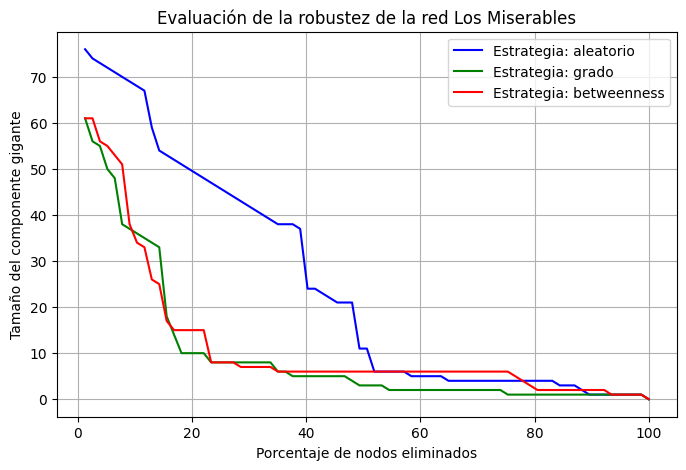

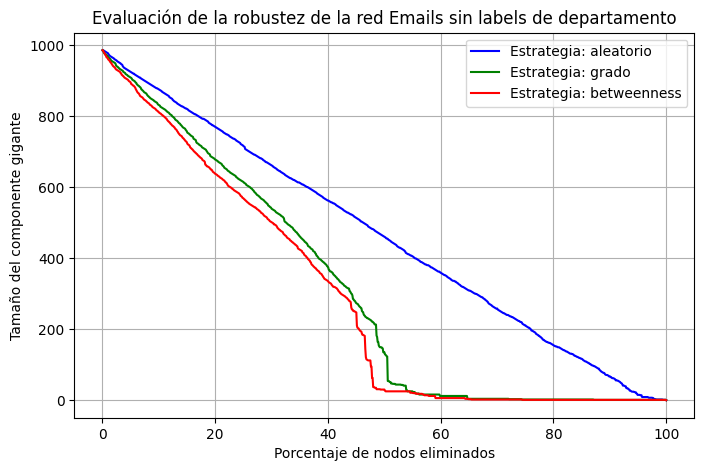

In [ ]:
plot_robustez(lesmis, "Los Miserables")
plot_robustez(email, "Emails sin labels de departamento")

### no corran este código (o recomiendo no hacerlo) porque tarda bocha

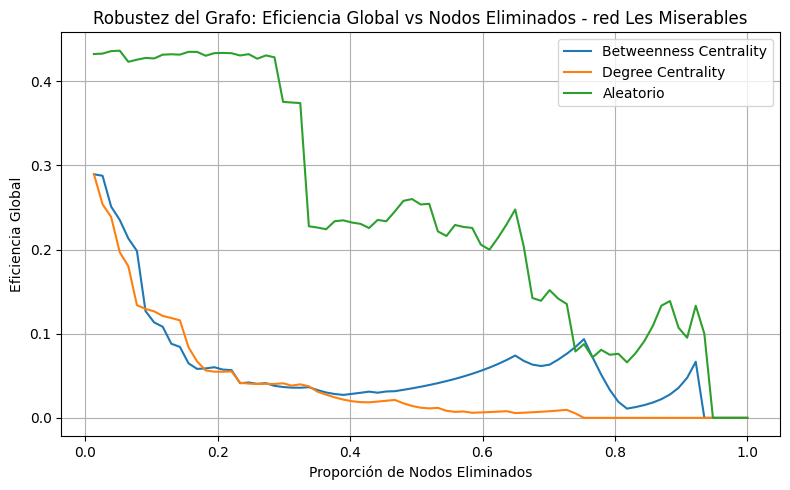

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-31-9c3bf1983ada>", line 72, in <cell line: 0>
    nodos_borrados_deg, componente_deg, eficiencia_deg = analizar_robustez(email, 'centralidad', centralidad_deg)
                                                         ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "<ipython-input-31-9c3bf1983ada>", line 28, in analizar_robustez
    eficiencia_global = nx.global_efficiency(G)
                        ^^^^^^^^^^^^^^^^^^^^^^^
  File "<class 'networkx.utils.decorators.argmap'> compilation 39", line 4, in argmap_global_efficiency_35
    import inspect
            ^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/networkx/utils/backends.py", line 1355, in __call__
    return self._call_with_backend(backend_name, args, kwargs)
           ^^^^^^^^^^^^^^^^^^^^

In [ ]:

def analizar_robustez(grafo, estrategia, centralidad=None):
    G = grafo.copy()
    N_original = G.number_of_nodes()

    eficiencia = []
    componentes_gigantes = []
    nodos_eliminados = []

    if estrategia == 'aleatorio':
        nodos = list(G.nodes())
        random.shuffle(nodos)
    elif estrategia == 'centralidad':
        nodos = sorted(centralidad.items(), key=lambda x: x[1], reverse=True)
        nodos = [nodo for nodo, _ in nodos]
    else:
        raise ValueError("Estrategia no reconocida")

    # Asegurar que los nodos a eliminar estén en el grafo
    nodos = [n for n in nodos if n in G]

    for i, nodo in enumerate(nodos):
        if nodo not in G:
            continue
        G.remove_node(nodo)

        if G.number_of_nodes() > 1:
            Ng = len(max(nx.connected_components(G), key=len))
            eficiencia_global = nx.global_efficiency(G)
        else:
            Ng = 0
            eficiencia_global = 0

        componentes_gigantes.append(Ng / N_original)
        eficiencia.append(eficiencia_global)
        nodos_eliminados.append((i + 1) / N_original)  # Proporción de nodos eliminados

    return nodos_eliminados, componentes_gigantes, eficiencia

# === USO CON UN GRAFO DE EJEMPLO (o tu propio grafo) ===
# Reemplazá esto con tu grafo real si lo tenés
# department_graph = nx.karate_club_graph()  # Ejemplo

# Calcular centralidades del grafo correcto
centralidad_btw = nx.betweenness_centrality(lesmis)
centralidad_deg = nx.degree_centrality(lesmis)

# Ejecutar análisis con cada estrategia
nodos_borrados_btw, componente_btw, eficiencia_btw = analizar_robustez(lesmis, 'centralidad', centralidad_btw)
nodos_borrados_deg, componente_deg, eficiencia_deg = analizar_robustez(lesmis, 'centralidad', centralidad_deg)
nodos_borrados_rand, componente_rand, eficiencia_rand = analizar_robustez(lesmis, 'aleatorio')

# === GRAFICAR EFICIENCIA GLOBAL ===
plt.figure(figsize=(8, 5))
plt.plot(nodos_borrados_btw, eficiencia_btw, label='Betweenness Centrality')
plt.plot(nodos_borrados_deg, eficiencia_deg, label='Degree Centrality')
plt.plot(nodos_borrados_rand, eficiencia_rand, label='Aleatorio')

plt.xlabel('Proporción de Nodos Eliminados')
plt.ylabel('Eficiencia Global')
plt.title('Robustez del Grafo: Eficiencia Global vs Nodos Eliminados - red Les Miserables')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === OPCIONAL: GRAFICAR COMPONENTE GIGANTE ===
centralidad_btw = nx.betweenness_centrality(email)
centralidad_deg = nx.degree_centrality(email)

# Ejecutar análisis con cada estrategia
nodos_borrados_btw, componente_btw, eficiencia_btw = analizar_robustez(email, 'centralidad', centralidad_btw)
nodos_borrados_deg, componente_deg, eficiencia_deg = analizar_robustez(email, 'centralidad', centralidad_deg)
nodos_borrados_rand, componente_rand, eficiencia_rand = analizar_robustez(email, 'aleatorio')
plt.figure(figsize=(8, 5))
plt.plot(nodos_borrados_btw, eficiencia_btw, label='Betweenness Centrality')
plt.plot(nodos_borrados_deg, eficiencia_deg, label='Degree Centrality')
plt.plot(nodos_borrados_rand, eficiencia_rand, label='Aleatorio')

plt.xlabel('Proporción de Nodos Eliminados')
plt.ylabel('Eficiencia Global')
plt.title('Robustez del Grafo: Eficiencia Global vs Nodos Eliminados - red Emails')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

##### Según se puede observar en los gráficos, ambas redes presentan diferencias entre sí frente a los "ataques" efectuados a las mismas. Frente a extracciones de forma aleatoria, en la red de emails se presenta una disminución lineal y estable del tamaño de la componente gigante y una caída progresiva en la eficiencia global pero de menor pendiente que el tamaño de la componente gigante, mientras que la red de les miserables si bien presenta cierta estabilidad y robustez, presenta algunas caídas puntuales fuertes en el tamaño de la componente gigante al extraer nodos de alta centralidad y un comportamiento similar en la eficiencia global. En cuanto a extracciones hechas a nodos de alta centralidad ya sea de grado como de betweenness, se perciben diferencias notables entre ambas redes. La red de les miserables da cuenta de una red con hubs debido a la rápida caída en el tamaño de la componente gigante (el tamaño de la componente se reduce a 1/6 de la misma con solo extraer el 20% de los nodos de la red), acompañada de una caída de similar característica en la eficiencia global, mientras que en la red de email se observa una red más robusta que la de red de les miserables ya que el tamaño de su componente gigante decrece en una forma gradual y con caídas abruptas, lo que da cuenta de una posible red de mundos pequeños en los que se forman comunidades entre las personas que se comunican vía mail. La red de les miserables al contar con protagonistas que se relacionan con la mayoría de los personajes a lo largo de la historia provoca que sin su presencia en la red la misma sea mucho menos conexa. En cuanto a la eficiencia global las caídas son similares a la producida en la componente gigante lo cual reafirma la idea de una red de mundo pequeño para los email (lo cual luego se analizará en la sección de comunidades) y una red más similar a una red libre de escala para les miserables.

## e) Comunidades en los grafos

# Detección de comunidades
Detectar la partición óptima (según la modularidad) utilizando el algoritmo de Louvain. Reportar el valor de modularidad obtenido. Visualizar las comunidades en el grafo y evaluar cualitativamente el resultado. Comparar entre los datasets analizados. Probar también con el algoritmo de Girvan-Newman y compa-
rar resultados. Si eligieron el dataset Email-EU, comparar las comunidades obtenidas con los labels que indican el departamento de cada nodo, discutiendo similaridades y diferencias. ¿Cómo se comparan las comunidades encontradas con los labels dados por la pertenencia de los nodos a los distintos departamentos?

# Usando el algoritmo Louvain
Este algoritmo es greedy, detecta comunidades mucho más rápido, conviene usarlo para ir explorando la red.
Al final vamos a tener que compararlo con Girvan Newman para estar seguro de no habernos comido un sesgo greedy.

In [ ]:
def louvain_per_graph(graph, layout, graph_suffix, weighted=True):
    """
    Applies Louvain community detection and visualizes the graph.

    Parameters:
    - graph (nx.Graph): Input graph.
    - layout (dict): Node positions.
    - graph_suffix (str): Suffix for variable naming
    - weighted (bool): If True, uses edge weights for visualization.
                      If False, treats all edges equally (width=1).
    """
    # --- Louvain Community Detection ---
    partition = cl.best_partition(graph)
    modularity = cl.modularity(partition, graph)
    print(f'La modularidad de la partición óptima ({graph_suffix}) es:', modularity)
    num_communities = max(partition.values()) + 1
    print(f'La partición óptima tiene {num_communities} comunidades ({graph_suffix})')

    # --- Store Results ---
    results = {
        f'values_{graph_suffix}': [v for _, v in partition.items()],
        f'edge_weights_{graph_suffix}': nx.get_edge_attributes(graph, "weight") if weighted else {},
        f'edgeWidth_{graph_suffix}': None
    }

    # --- Edge Width Handling ---
    if weighted and results[f'edge_weights_{graph_suffix}']:
        edge_widths = np.array(list(results[f'edge_weights_{graph_suffix}'].values()))
        results[f'edgeWidth_{graph_suffix}'] = edge_widths / np.max(edge_widths)
    else:
        # Default width=1 if unweighted or no weights found
        results[f'edgeWidth_{graph_suffix}'] = np.ones(len(graph.edges()))*0.1 if graph.edges() else np.array([])

    # --- Visualization ---
    plt.figure(figsize=(10, 8))
    nx.draw_networkx_nodes(
        graph, layout, node_size=20,
        node_color=results[f'values_{graph_suffix}'],
        cmap=plt.cm.tab20
    )
    #nx.draw_networkx_labels(graph, layout, font_weight='bold', font_color='white')

    # Draw edges (with or without weights)
    if graph.edges():
        nx.draw_networkx_edges(
            graph, layout,
            width=results[f'edgeWidth_{graph_suffix}']
        )

    plt.title(f'Louvain Communities - {graph_suffix} ({weighted=})')
    plt.axis('off')

    return results

layout_lesmis = nx.spring_layout(lesmis, seed=42, iterations=1000)
layout_email=nx.spring_layout(G, k=0.15, iterations=100, scale= 5, center=(0.5, 0.5), seed= 42)
results_lesmis = louvain_per_graph(lesmis, layout_lesmis, 'lesmis', weighted=True)
results_email = louvain_per_graph(emailGiant, layout_email, 'email', weighted=False)
values_lesmis = results_lesmis['values_lesmis']
values_email = results_email['values_email']

# Comparando con Girvan-Newman

Nota: la corrida de GN para emails la dejo en mi Notebook local para no ensuciar esta, la subo al repo.

In [ ]:
# función para guardar las particiones en un diccionario
def partition_set_to_dict(m):
    d = {}
    for i,c in enumerate(m):
        for n in c:
            d[n] = i
    return d

G = lesmis
G = nx.convert_node_labels_to_integers(G)
# Explorando Girvan-newman (OJO, PARA EMAIL TARDA BASTANTE)
modulos = nx.community.girvan_newman(G) # DEVUELVE UN ITERADOR modulos QUE ME DA LA COMUNIDADES QUE SURGEN AL IR ELIMINANDO ENLACES
#for communities in modulos:
  #print(list(communities))


[{0, 1, 2, 3, 4, 5, 6, 7, 8, 9}, {10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76}]
[{0, 1, 2, 3, 4, 5, 6, 7, 8, 9}, {10, 11, 13, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76}, {12, 45, 46, 44, 16, 47, 48, 49, 50, 51}]
[{0, 1, 2, 3, 4, 5, 6, 7, 8, 9}, {10, 11, 13, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76}, {12, 45, 46, 44, 16, 47, 48, 49, 50, 51}, {64, 63}]
[{0, 1, 2, 3, 4, 5, 6, 7, 8, 9}, {32, 59, 10, 11, 13, 14, 15, 21, 22, 23, 24, 25, 26,

La modularidad de la partición óptima es: 0.4776911064842355
La partición óptima tiene  11  comunidades
La partición óptima es: ([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], [10, 11, 13, 14, 15, 22, 23, 24, 25, 26, 27, 28, 29, 30], [12, 16, 44, 45, 46, 47, 48, 49, 50, 51], [17, 18, 20, 39, 40, 41, 42, 52, 53, 55, 57], [19, 31, 34, 35, 43, 54, 58, 60, 74, 75], [21, 32, 59], [33, 36, 37, 38, 61, 62, 65, 66, 67, 68, 69, 70, 73], [56], [63, 64], [71, 72], [76])


Text(0, 0.5, 'Modularidad (Q)')

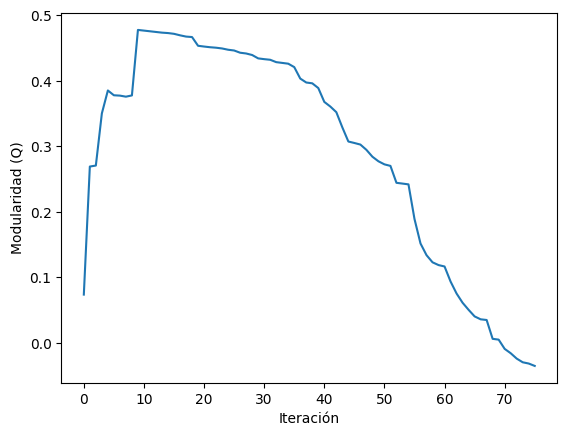

In [ ]:
modulos = nx.community.girvan_newman(G)
modularidad=[] # ESTE EL EL INDICE DE MODULARIDAD (Q) QUE QUEREMOS OPTIMIZAR
mod_max = -999
for communities in modulos:
    n_modularidad = nx.community.modularity(G,tuple(sorted(c) for c in communities)) # CALCULAMOS Q PARA CADA ITERACION
    modularidad.append(n_modularidad)
    if n_modularidad>mod_max: # ME GUARDO LA MAXIMA MODULARIDAD ENCONTRADA, Y LA PARTICIÓN DE COMUNIDADES CORRESPONDIENTE
      mod_max=n_modularidad
      com_max = tuple(sorted(c) for c in communities)

k=np.argmax(modularidad)
print('La modularidad de la partición óptima es:',mod_max)
print('La partición óptima tiene ',len(com_max), ' comunidades')
print('La partición óptima es:',com_max)


# Graficar la modularidad
plt.plot(modularidad)
plt.xlabel('Iteración')
plt.ylabel('Modularidad (Q)')

In [ ]:
# CREO QUE DEBERÍAMOS BORRARLO
def create_community_node_colors(graph, communities):
    number_of_colors = len(communities)
    colors = ["#D4FCB1", "#CDC5FC", "#FFC2C4", "#F2D140", "#BCC6C8"][:number_of_colors]
    node_colors = []
    for node in graph:
        current_community_index = 0
        for community in communities:
            if node in community:
                node_colors.append(colors[current_community_index])
                break
            current_community_index += 1
    return node_colors

def visualize_communities(graph, communities, i):
    node_colors = create_community_node_colors(graph, communities)
    modularity = round(nx.community.modularity(graph, communities), 6)
    title = f"Community Visualization of {len(communities)} communities with modularity of {modularity}"
    pos = nx.spring_layout(graph, k=0.3, iterations=50, seed=2)
    plt.subplot(3, 1, i)
    plt.title(title)
    nx.draw(
        graph,
        pos=pos,
        node_size=1000,
        node_color=node_colors,
        with_labels=True,
        font_size=20,
        font_color="black",
    )

In [ ]:
# Comparar particiciones de modularidades
# Comparar emails communities con departamentos
nodes_lcc = list(emailGiant)
df_email_deptos = df
df_email_deptos['id'] = df_email_deptos.index
df_email_deptos = df_email_deptos.rename(columns={0: 'label'})
df_email_deptos_lcc = df_email_deptos[df_email_deptos['id'].isin(nodes_lcc)].copy()
df_email_deptos_lcc['values_email'] = values_email

df_email_deptos_lcc.head()
ars  = adjusted_rand_score(df_email_deptos_lcc['values_email'],df_email_deptos_lcc['label'])
print('The adjusted rand score between departments and Louvain communities is:', ars)
nmi = normalized_mutual_info_score(df_email_deptos_lcc['values_email'],df_email_deptos_lcc['label'])
print('The normalized mutual info score between departments and Louvain communities is:', nmi)

contingency_table = pd.crosstab(
    index=df_email_deptos_lcc['values_email'],
    columns=df_email_deptos_lcc['label'],
    normalize='index'  # Normalize by row to see % department per cluster
)
sns.heatmap(contingency_table, cmap='Blues')

ValueError: Found input variables with inconsistent numbers of samples: [77, 986]

## Materiales y métodos

### Comunidades

En detección de comunidades trabajamos con 2 algoritmos diferentes, por un lado el algoritmo Girvan-Newman, un algoritmo clásico con enfoque top-down para detección de comunidades y por el otro Louvain, un algoritmo más ágil de enfoque bottom-up.
Dado que el algoritmo de Louvain puede arrojar resultados dispares por diseño, tomamos la decisión que correr 100 iteraciones y tomar el resultado con mayor modularidad.
En el caso de Les Miserables los resultados fueron los siguientes:
Para Louvain la partición óptima fue de 6 comunidades con una modularidad de 0.5663
Para Girvan-Newman la partición óptima fue de 11 comunidades con una modularidad de 0.4777
Imagen GNlesmisModularity.png
En el caso de Emails EU los resultados fueron los siguientes:
Louvain identificó 8 comunidades con una modularidad de 0.4136
Girvan-Newman por su parte identificó 712 comunidades con una modularidad de 0.0917
Imagen modularidadGNEmails.png
[cierre de materiales y métodos]
Cabe destacar en esta sección los problemas de perfomance asociados al algoritmo de Girvan-Newman en la libreria Networkx, en el que se combinan un algoritmo costoso O(n^2) y una implemantación que no mejora los tiempos de procesamiento, en el caso de la red cada corrida de este algoritmo demoró más de 10 hora, a más de 3 órdenes de magnitud de distancia de el mismo grafo usando Louvain. Esta deficiente performance impacta negativamente en la posibilidad de reprocesar la detección de comunidades en escenarios diversos.
Para comparar las comunidades de emails EU con los departamentos utilizamos 3 métodos.
1. adjusted rand score(ARS) que arrojó un valor de 0.3250
2. normalized mutual info score (MNI) que arrojó un valor de 0.5813
3. Una tabla de contigencia para evaluar la correlación entre departamentos y comunidades en la cuál pudimos identificar una alta correlación en algunos casos como entre la comunidad 2 y el departamento 14, comunidad 7 y departamento 8 y comunidad 8 y departamento 7.
Imagen contingencydeptcom.png

## Resultados
### Comunidades
La detección de comunidades arrojó resultados esperables, mientras que la red de Les Miserables dio buenos niveles de modularidad y un número de clusters razonable con el tamaño de la red independientemente del algoritmo utilizado, la red de Emails EU arrojó valores más bajos de modularidad y una gran disparidad de resultados dependiendo del algoritmo utilizado (Louvain y Girvan-Newman)
En las comunidades de Les Miserables es probable que exista una relación entre los volúmenes de la novela y las comunidades detectadas....
En los Emails solo vamos a considerar las comunidades detectadas mediante el algoritmo de Louvain ya que Girvan-Newman arrojó valores de modularidad muy bajos (< 0.1)
A la hora de comparar los datos de departamentos con las particiones de modularidad
encontramos que las métricas habituales dieron resultados bajos, por eso decidimos indagar con otras métricas y explorar los datos de distintas maneras.
En estas exploraciones identificamos algunas relaciones interesantes entre departamentos y comunidades que aunque excedían al alcance de esta investigación resultan interesantes par aindagar más adelante.


# Otros... (métricas, gráficos adicionales, etc. como si fuera un backup por si queremos sumar gráficos y métricas)

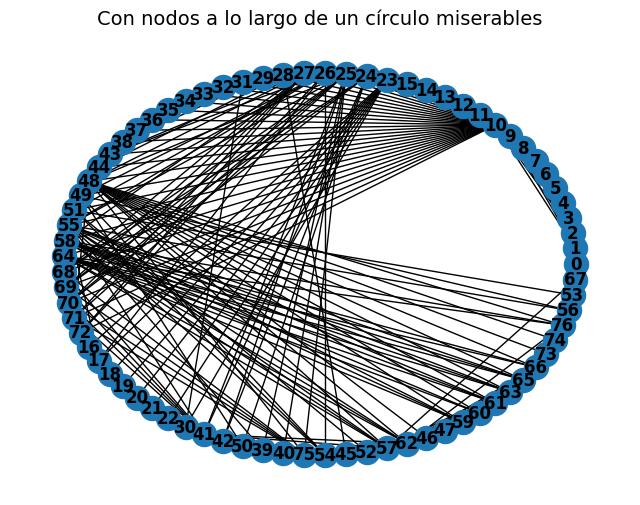

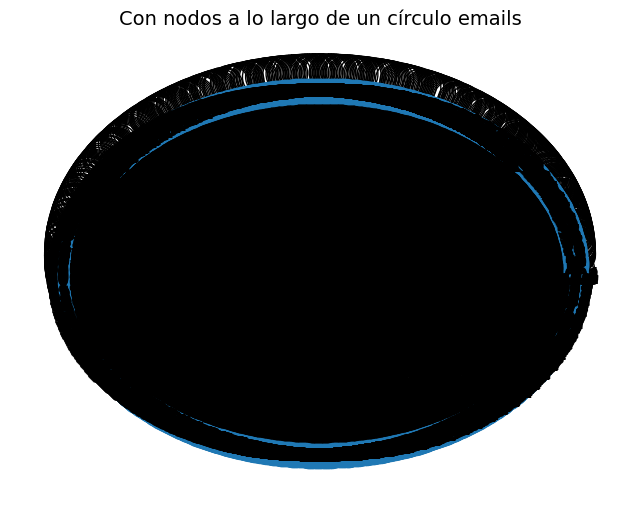

In [ ]:
plt.figure(figsize=(8, 6))
plt.title('Con nodos a lo largo de un círculo miserables', fontsize=14)
layout = nx.circular_layout(lesmis)
nx.draw(lesmis, layout, with_labels=True, font_weight='bold')

plt.figure(figsize=(8, 6))
plt.title('Con nodos a lo largo de un círculo emails', fontsize=14)
layout = nx.circular_layout(email)
nx.draw(email, layout, with_labels=True, font_weight='bold')

In [ ]:
pos = nx.spring_layout(email,iterations=10)
pos_email=get_graph_pos('email_pos.pkl')

### MAtriz de adyacencia para miserables y email

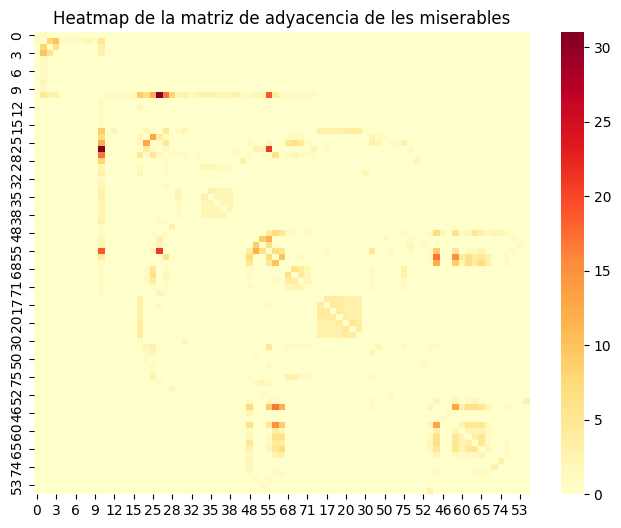

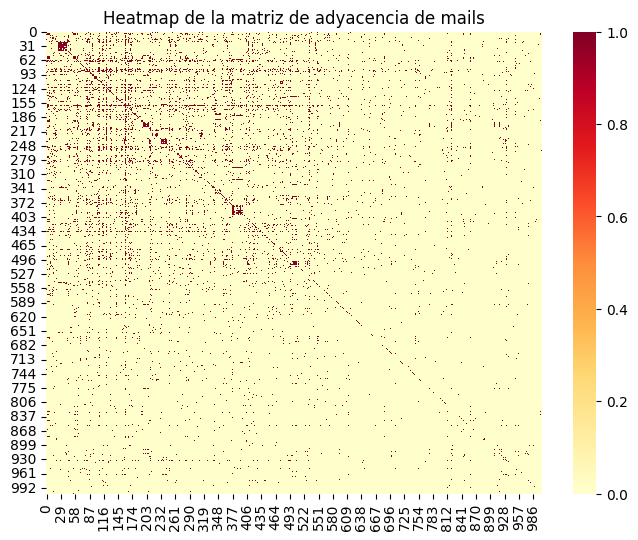

In [ ]:
import seaborn as sns
import pandas as pd

# Obtener la matriz de adyacencia con pandas
adj_df = nx.to_pandas_adjacency(lesmis, dtype=int)

# Graficar heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(adj_df, cmap="YlOrRd", annot=False)
plt.title("Heatmap de la matriz de adyacencia de les miserables")
plt.show()

# Obtener la matriz de adyacencia con pandas
adj_df = nx.to_pandas_adjacency(email, dtype=int)

# Graficar heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(adj_df, cmap="YlOrRd", annot=False)
plt.title("Heatmap de la matriz de adyacencia de mails")
plt.show()

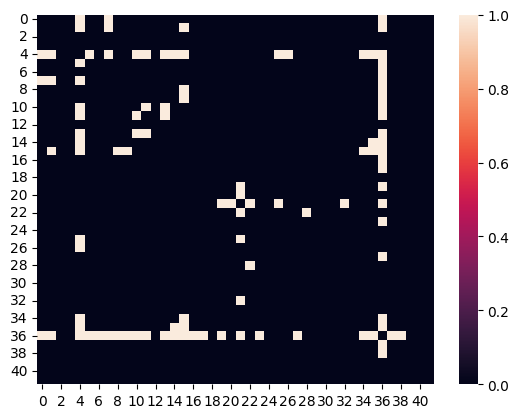

In [ ]:
import seaborn as sns
th = 50 # Podemos variar este umbral
matAdyacNoPesada = np.abs(adj_matrix) >= th
sns.heatmap(matAdyacNoPesada)

plt.show()

In [ ]:
centrality = nx.degree_centrality(lesmis)
# Ordenar los nodos por valor de centralidad, de mayor a menor
top_5 = sorted(centrality.items(), key=lambda x: x[1], reverse=True)[:5]
print('Nodos con mayor centralidad de grado en los miserables')
# Mostrar el top 5
for i, (node, value) in enumerate(top_5, start=1):
    print(f"{i}. {node}: {value:.4f}")
print('-')
print('Nodos con mayor centralidad betweenness en los miserables')
centrality = nx.betweenness_centrality(lesmis)
top_5 = sorted(centrality.items(), key=lambda x: x[1], reverse=True)[:5]
for i, (node, value) in enumerate(top_5, start=1):
    print(f"{i}. {node}: {value:.4f}")

Nodos con mayor centralidad de grado en los miserables
1. 10: 0.4737
2. 48: 0.2895
3. 55: 0.2500
4. 27: 0.2237
5. 25: 0.2105
-
Nodos con mayor centralidad betweenness en los miserables
1. 10: 0.5700
2. 1: 0.1768
3. 48: 0.1651
4. 55: 0.1320
5. 23: 0.1296


In [ ]:
import networkx as nx

asortatividad = nx.degree_pearson_correlation_coefficient(lesmis)
print(f"Asortatividad del grafo miserables: {asortatividad:.4f}")

asortatividad = nx.degree_pearson_correlation_coefficient(email)
print(f"Asortatividad del grafo emails: {asortatividad:.4f}")

Asortatividad del grafo miserables: -0.1652
Asortatividad del grafo emails: -0.0110


### Código para ver todos los subgrafos que surgen al aplicar etiquetas a de departamentos a los email. Cada grafo sería un departamento y cada nodo la persona.

In [ ]:
# Supongamos que 'labelsEmail' es la lista que contiene los departamentos
import numpy as np

# Leer los labels de departamento
array = np.loadtxt('email_labels.txt', dtype=int)
labelsEmail = list(array[:, 1])  # Esta es la lista de departamentos

# Crear un diccionario que mapea cada nodo a su departamento
node_to_department = {i: labelsEmail[i] for i in range(len(labelsEmail))}

# Crear un diccionario para almacenar los subgrafos por departamento
subgraphs_by_department = {}

# Iterar sobre cada nodo para asignarlo a su subgrafo correspondiente
for node in email.nodes():
    department = node_to_department[node]
    if department not in subgraphs_by_department:
        subgraphs_by_department[department] = nx.Graph()
    subgraphs_by_department[department].add_node(node)

# Ahora agregar las aristas a cada subgrafo
for u, v in email.edges():
    dept_u = node_to_department[u]
    dept_v = node_to_department[v]
    if dept_u == dept_v:
        subgraphs_by_department[dept_u].add_edge(u, v)


Centralidad para el departamento 1: {np.int64(0): 0.34375, np.int64(1): 0.25, np.int64(17): 0.59375, np.int64(18): 0.359375, np.int64(73): 0.25, np.int64(74): 0.640625, np.int64(85): 0.28125, np.int64(120): 0.125, np.int64(177): 0.3125, np.int64(215): 0.421875, np.int64(218): 0.59375, np.int64(219): 0.109375, np.int64(220): 0.125, np.int64(221): 0.390625, np.int64(222): 0.421875, np.int64(223): 0.375, np.int64(224): 0.140625, np.int64(225): 0.265625, np.int64(226): 0.28125, np.int64(227): 0.09375, np.int64(228): 0.125, np.int64(248): 0.21875, np.int64(297): 0.21875, np.int64(307): 0.21875, np.int64(308): 0.078125, np.int64(309): 0.5, np.int64(310): 0.203125, np.int64(311): 0.234375, np.int64(312): 0.203125, np.int64(313): 0.234375, np.int64(314): 0.34375, np.int64(315): 0.046875, np.int64(316): 0.296875, np.int64(317): 0.265625, np.int64(341): 0.15625, np.int64(414): 0.15625, np.int64(415): 0.046875, np.int64(449): 0.015625, np.int64(459): 0.234375, np.int64(468): 0.078125, np.int64(47

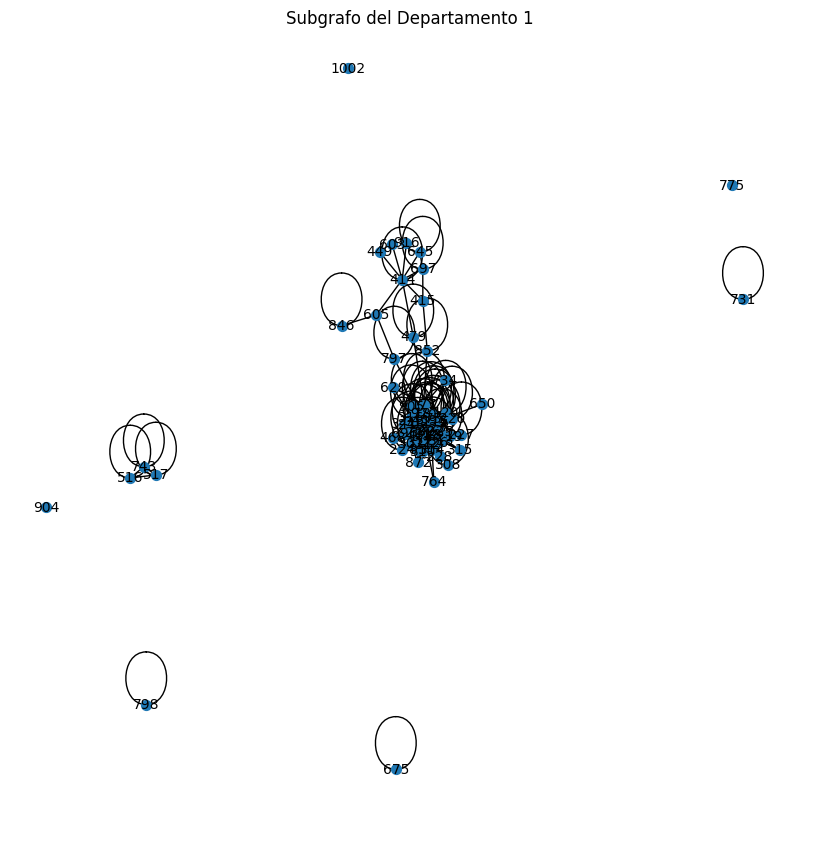

Centralidad para el departamento 21: {np.int64(2): 0.5833333333333334, np.int64(3): 0.4666666666666667, np.int64(4): 0.5833333333333334, np.int64(56): 0.43333333333333335, np.int64(57): 0.45, np.int64(58): 0.5166666666666666, np.int64(59): 0.5, np.int64(63): 0.6, np.int64(137): 0.4166666666666667, np.int64(138): 0.31666666666666665, np.int64(192): 0.23333333333333334, np.int64(193): 0.35, np.int64(194): 0.4666666666666667, np.int64(195): 0.35, np.int64(281): 0.4, np.int64(286): 0.4, np.int64(305): 0.4166666666666667, np.int64(408): 0.5166666666666666, np.int64(412): 0.5333333333333333, np.int64(456): 0.03333333333333333, np.int64(520): 0.4166666666666667, np.int64(532): 0.13333333333333333, np.int64(571): 0.15, np.int64(586): 0.18333333333333332, np.int64(587): 0.16666666666666666, np.int64(606): 0.0, np.int64(622): 0.0, np.int64(625): 0.06666666666666667, np.int64(633): 0.03333333333333333, np.int64(634): 0.05, np.int64(635): 0.11666666666666667, np.int64(636): 0.03333333333333333, np

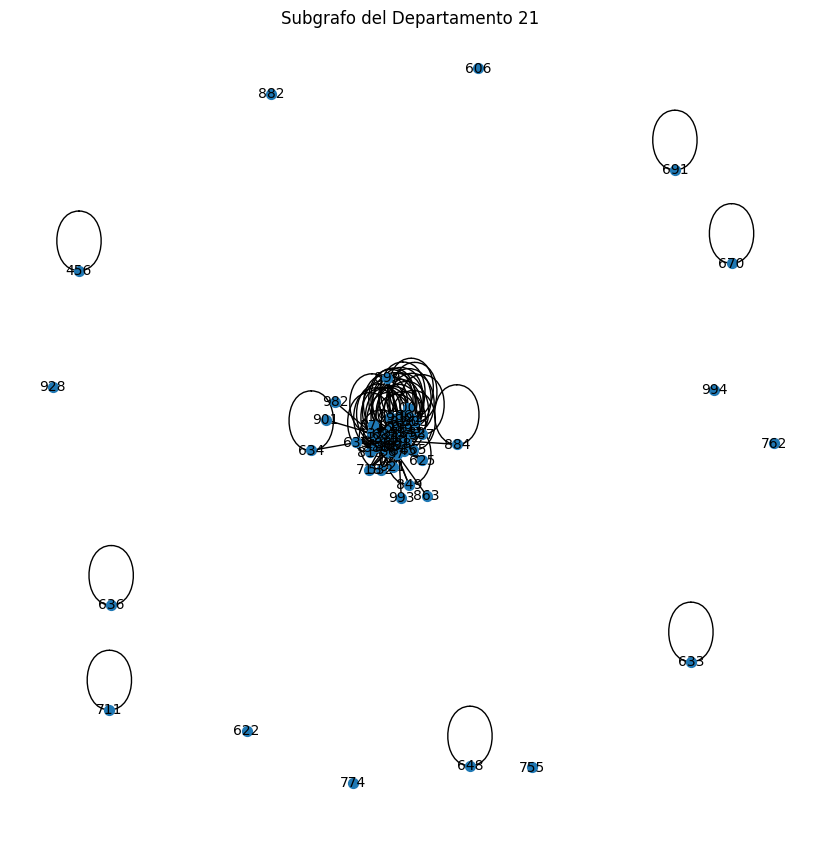

Centralidad para el departamento 25: {np.int64(5): 1.4000000000000001, np.int64(6): 1.4000000000000001, np.int64(64): 1.4000000000000001, np.int64(489): 1.4000000000000001, np.int64(528): 1.4000000000000001, np.int64(644): 1.4000000000000001}


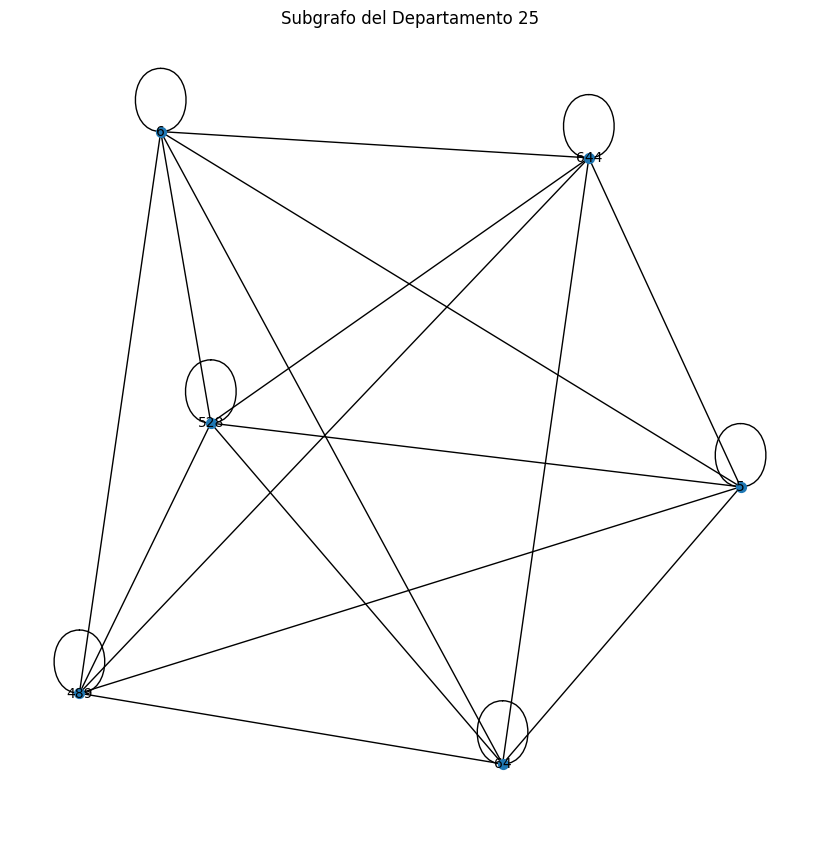

Centralidad para el departamento 14: {np.int64(7): 0.6703296703296704, np.int64(8): 0.3296703296703297, np.int64(9): 0.4285714285714286, np.int64(11): 0.5274725274725275, np.int64(12): 0.4395604395604396, np.int64(19): 0.45054945054945056, np.int64(43): 0.15384615384615385, np.int64(44): 0.6043956043956045, np.int64(141): 0.6373626373626374, np.int64(161): 0.28571428571428575, np.int64(213): 0.46153846153846156, np.int64(246): 0.19780219780219782, np.int64(247): 0.18681318681318682, np.int64(249): 0.26373626373626374, np.int64(264): 0.34065934065934067, np.int64(265): 0.38461538461538464, np.int64(266): 0.28571428571428575, np.int64(267): 0.2087912087912088, np.int64(293): 0.23076923076923078, np.int64(324): 0.15384615384615385, np.int64(332): 0.27472527472527475, np.int64(358): 0.5164835164835165, np.int64(359): 0.3626373626373627, np.int64(360): 0.2197802197802198, np.int64(362): 0.28571428571428575, np.int64(365): 0.23076923076923078, np.int64(374): 0.2197802197802198, np.int64(406)

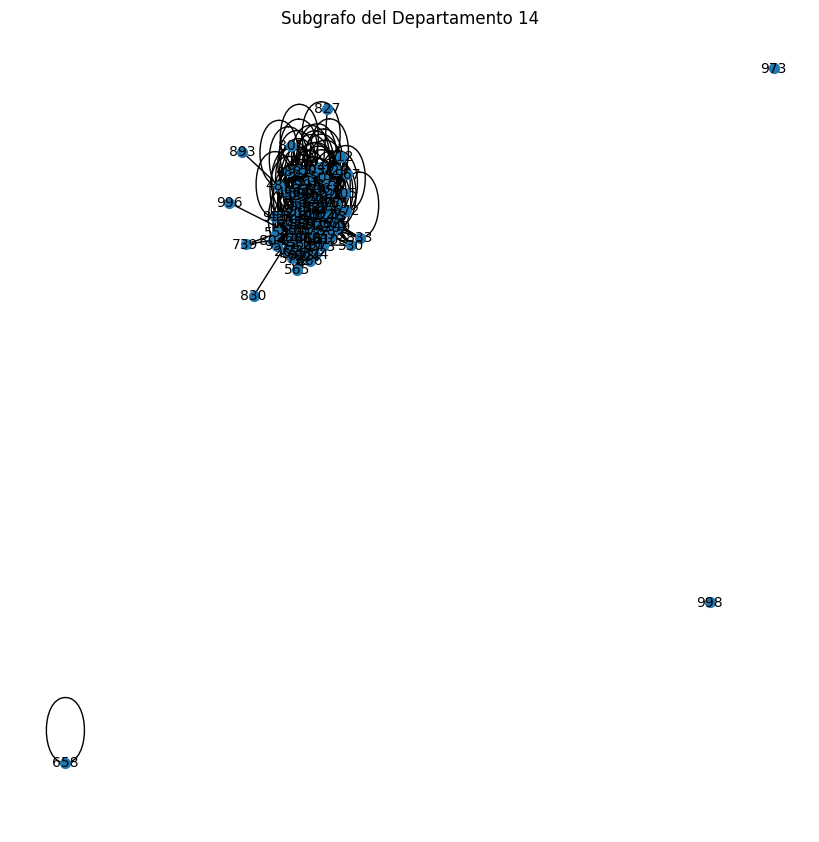

Centralidad para el departamento 9: {np.int64(10): 0.3225806451612903, np.int64(20): 0.4838709677419355, np.int64(21): 0.5161290322580645, np.int64(22): 0.16129032258064516, np.int64(72): 0.16129032258064516, np.int64(92): 0.4193548387096774, np.int64(259): 0.3225806451612903, np.int64(260): 0.29032258064516125, np.int64(306): 0.45161290322580644, np.int64(325): 0.3548387096774194, np.int64(326): 0.3870967741935484, np.int64(327): 0.45161290322580644, np.int64(400): 0.3548387096774194, np.int64(416): 0.03225806451612903, np.int64(524): 0.03225806451612903, np.int64(535): 0.06451612903225806, np.int64(538): 0.25806451612903225, np.int64(703): 0.06451612903225806, np.int64(723): 0.29032258064516125, np.int64(733): 0.3225806451612903, np.int64(777): 0.29032258064516125, np.int64(825): 0.12903225806451613, np.int64(858): 0.03225806451612903, np.int64(881): 0.0, np.int64(885): 0.0967741935483871, np.int64(887): 0.16129032258064516, np.int64(890): 0.06451612903225806, np.int64(894): 0.032258

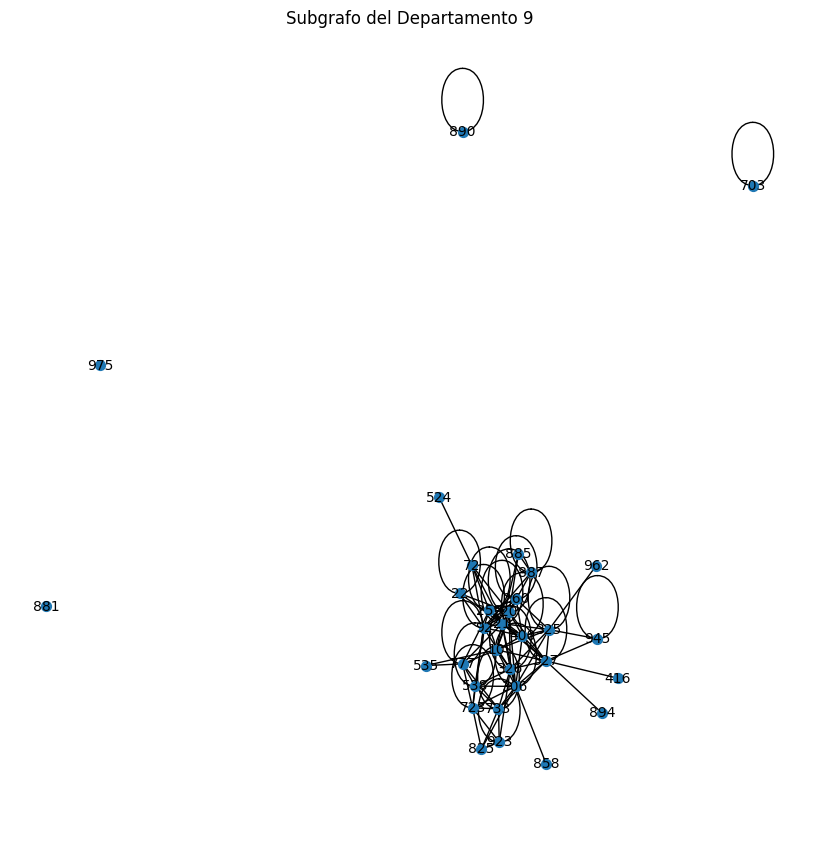

Centralidad para el departamento 26: {np.int64(13): 0.875, np.int64(118): 0.875, np.int64(301): 1.0, np.int64(409): 0.75, np.int64(420): 0.875, np.int64(624): 0.625, np.int64(651): 0.75, np.int64(677): 0.0, np.int64(810): 0.25}


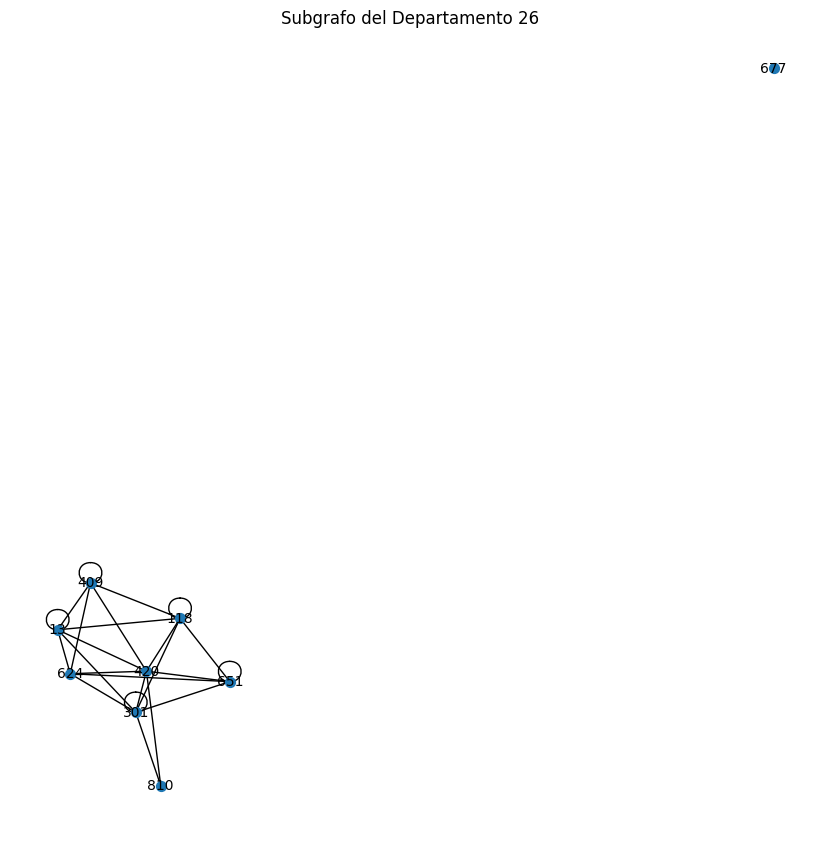

Centralidad para el departamento 4: {np.int64(14): 0.32407407407407407, np.int64(53): 0.12037037037037036, np.int64(65): 0.3796296296296296, np.int64(93): 0.28703703703703703, np.int64(95): 0.15740740740740738, np.int64(129): 0.5648148148148148, np.int64(133): 0.2685185185185185, np.int64(167): 0.25925925925925924, np.int64(168): 0.41666666666666663, np.int64(172): 0.34259259259259256, np.int64(176): 0.14814814814814814, np.int64(183): 0.3796296296296296, np.int64(197): 0.12037037037037036, np.int64(198): 0.16666666666666666, np.int64(199): 0.16666666666666666, np.int64(200): 0.1388888888888889, np.int64(201): 0.16666666666666666, np.int64(202): 0.046296296296296294, np.int64(203): 0.12962962962962962, np.int64(206): 0.25, np.int64(207): 0.1111111111111111, np.int64(232): 0.32407407407407407, np.int64(256): 0.18518518518518517, np.int64(270): 0.09259259259259259, np.int64(275): 0.2222222222222222, np.int64(276): 0.06481481481481481, np.int64(280): 0.4074074074074074, np.int64(290): 0.2

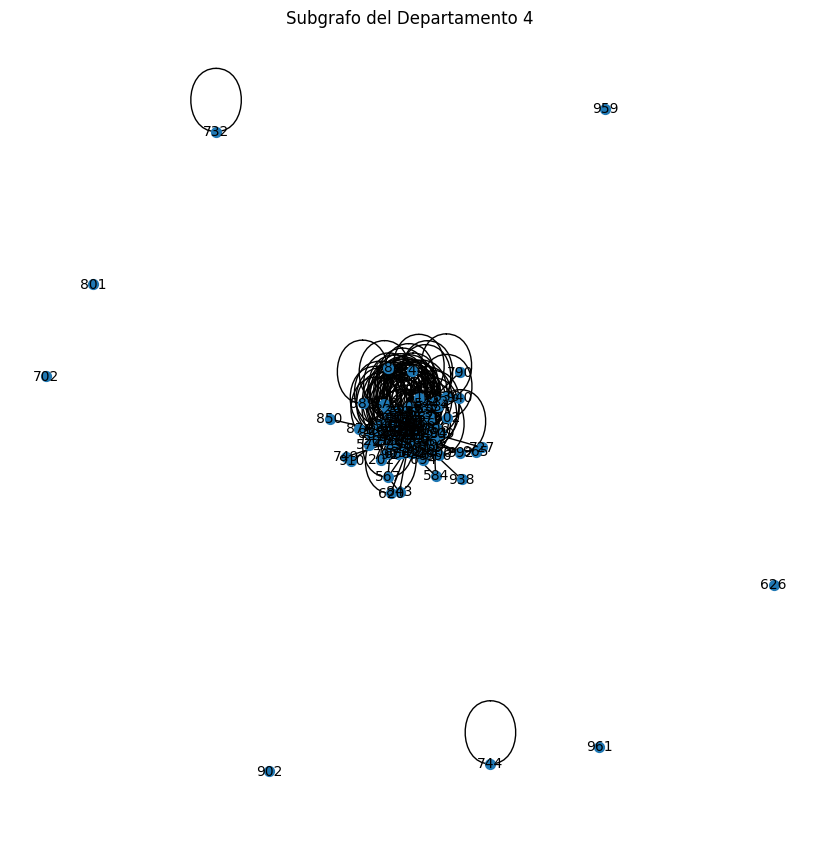

Centralidad para el departamento 17: {np.int64(15): 0.7647058823529411, np.int64(45): 0.6470588235294118, np.int64(46): 0.6764705882352942, np.int64(139): 0.6764705882352942, np.int64(140): 0.7647058823529411, np.int64(164): 0.6764705882352942, np.int64(216): 0.5588235294117647, np.int64(269): 0.8235294117647058, np.int64(272): 0.6470588235294118, np.int64(273): 0.6176470588235294, np.int64(274): 0.4411764705882353, np.int64(322): 0.7352941176470588, np.int64(334): 0.5882352941176471, np.int64(335): 0.6764705882352942, np.int64(428): 0.6764705882352942, np.int64(429): 0.7352941176470588, np.int64(446): 0.6470588235294118, np.int64(447): 0.6764705882352942, np.int64(448): 0.7647058823529411, np.int64(461): 0.6176470588235294, np.int64(579): 0.5294117647058824, np.int64(592): 0.7941176470588235, np.int64(617): 0.14705882352941177, np.int64(657): 0.029411764705882353, np.int64(660): 0.058823529411764705, np.int64(676): 0.08823529411764705, np.int64(735): 0.20588235294117646, np.int64(760)

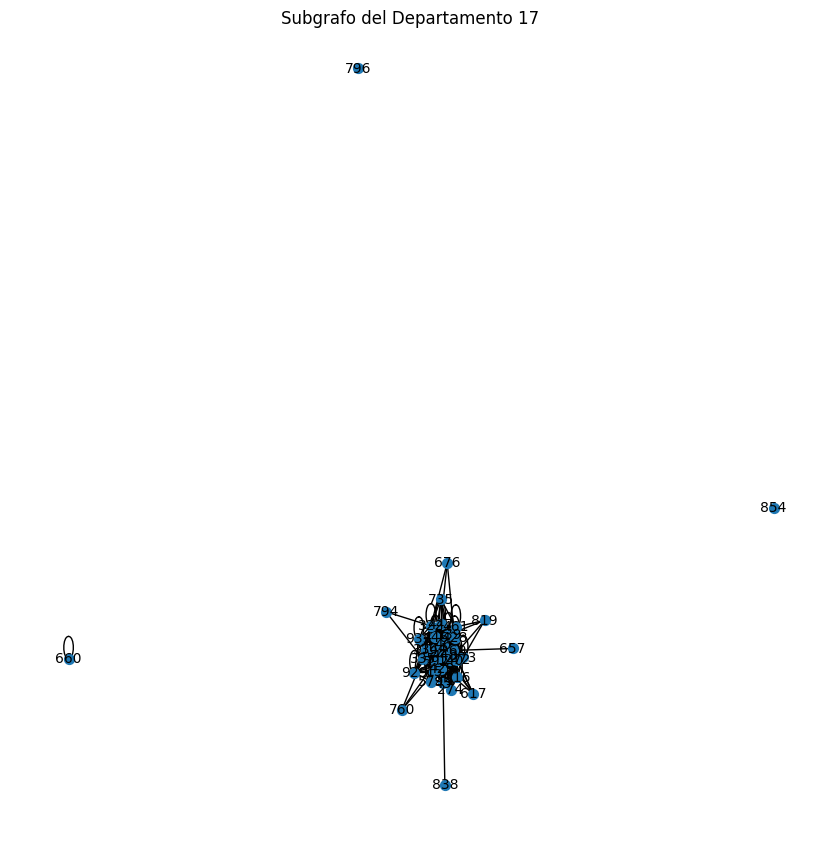

Centralidad para el departamento 34: {np.int64(16): 0.25, np.int64(42): 0.5833333333333333, np.int64(87): 0.6666666666666666, np.int64(105): 0.75, np.int64(212): 0.5833333333333333, np.int64(424): 0.5833333333333333, np.int64(434): 0.8333333333333333, np.int64(460): 0.3333333333333333, np.int64(561): 0.0, np.int64(607): 0.41666666666666663, np.int64(684): 0.16666666666666666, np.int64(763): 0.16666666666666666, np.int64(787): 0.0}


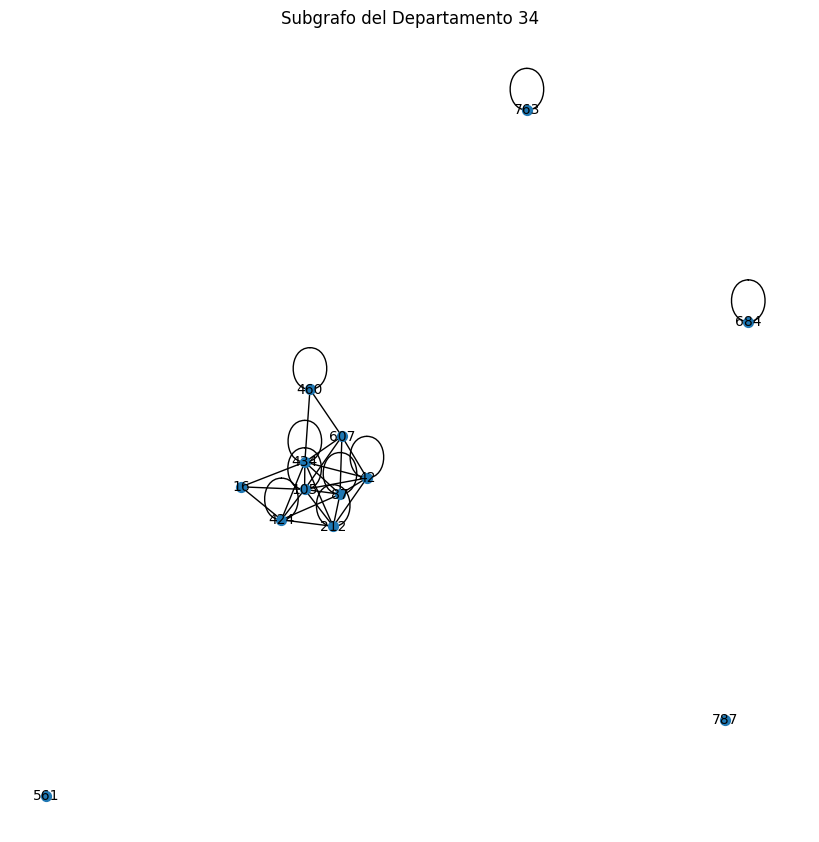

Centralidad para el departamento 11: {np.int64(23): 0.9285714285714285, np.int64(24): 0.8928571428571428, np.int64(25): 0.5357142857142857, np.int64(26): 0.6785714285714285, np.int64(27): 0.9642857142857142, np.int64(28): 0.8928571428571428, np.int64(29): 0.8214285714285714, np.int64(30): 0.8214285714285714, np.int64(31): 0.6071428571428571, np.int64(32): 0.5714285714285714, np.int64(33): 0.6428571428571428, np.int64(34): 0.7857142857142857, np.int64(35): 0.8214285714285714, np.int64(36): 0.5357142857142857, np.int64(37): 0.8214285714285714, np.int64(38): 0.7142857142857142, np.int64(39): 0.5357142857142857, np.int64(40): 0.7857142857142857, np.int64(545): 0.5357142857142857, np.int64(588): 0.5357142857142857, np.int64(590): 0.6428571428571428, np.int64(721): 0.21428571428571427, np.int64(722): 0.10714285714285714, np.int64(785): 0.07142857142857142, np.int64(878): 0.14285714285714285, np.int64(915): 0.03571428571428571, np.int64(953): 0.3214285714285714, np.int64(964): 0.1428571428571

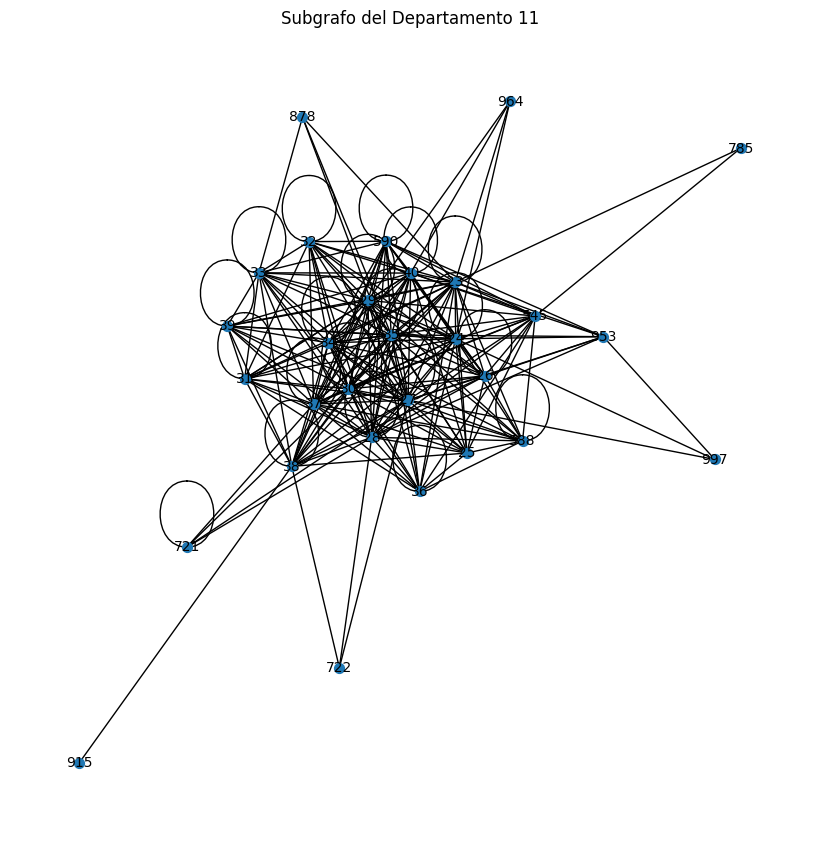

Centralidad para el departamento 5: {np.int64(41): 0.8823529411764706, np.int64(51): 0.8235294117647058, np.int64(94): 0.8823529411764706, np.int64(128): 1.0, np.int64(196): 0.8235294117647058, np.int64(204): 0.8235294117647058, np.int64(205): 0.6470588235294118, np.int64(593): 0.8235294117647058, np.int64(751): 0.23529411764705882, np.int64(776): 0.6470588235294118, np.int64(820): 1.0588235294117647, np.int64(861): 0.0, np.int64(908): 0.8235294117647058, np.int64(917): 0.8235294117647058, np.int64(918): 0.8235294117647058, np.int64(955): 0.4117647058823529, np.int64(970): 0.23529411764705882, np.int64(974): 0.3529411764705882}


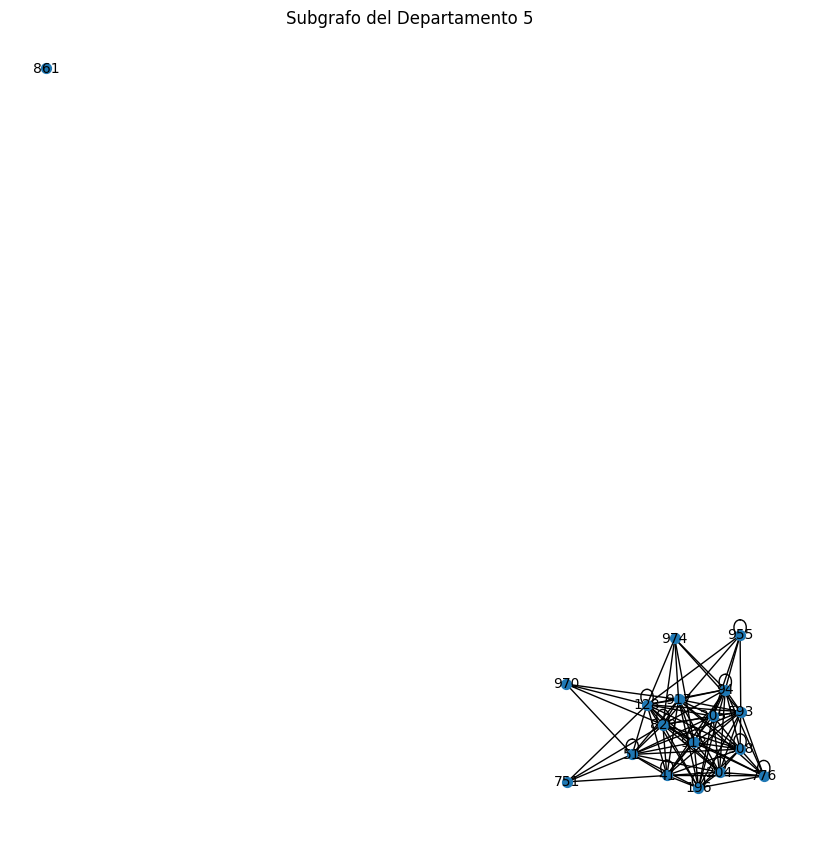

Centralidad para el departamento 10: {np.int64(47): 0.5526315789473684, np.int64(48): 0.7894736842105263, np.int64(75): 0.18421052631578946, np.int64(76): 0.5, np.int64(113): 0.7894736842105263, np.int64(114): 0.8157894736842105, np.int64(119): 0.13157894736842105, np.int64(151): 0.2894736842105263, np.int64(171): 0.5263157894736842, np.int64(229): 0.13157894736842105, np.int64(245): 0.6578947368421052, np.int64(261): 0.3421052631578947, np.int64(263): 0.7368421052631579, np.int64(318): 0.6842105263157894, np.int64(333): 0.8157894736842105, np.int64(361): 0.5789473684210527, np.int64(367): 0.39473684210526316, np.int64(370): 0.39473684210526316, np.int64(417): 0.763157894736842, np.int64(423): 0.6578947368421052, np.int64(442): 0.4473684210526315, np.int64(443): 0.7368421052631579, np.int64(444): 0.6052631578947368, np.int64(485): 0.4473684210526315, np.int64(527): 0.3684210526315789, np.int64(547): 0.5526315789473684, np.int64(704): 0.05263157894736842, np.int64(725): 0.18421052631578

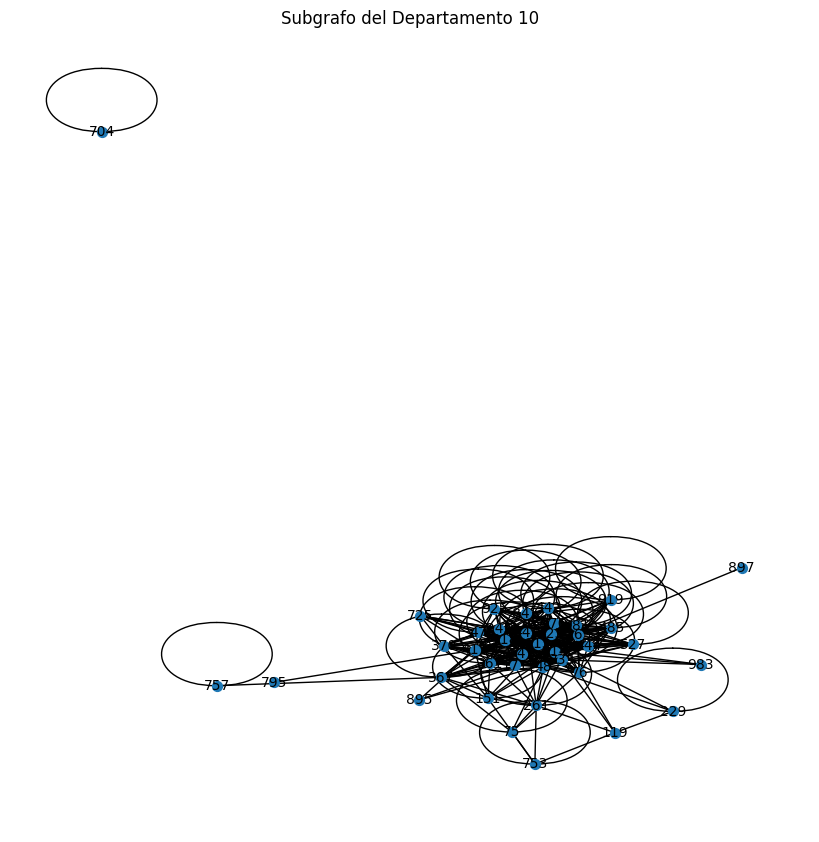

Centralidad para el departamento 36: {np.int64(49): 0.14285714285714285, np.int64(62): 0.5714285714285714, np.int64(82): 1.0, np.int64(83): 1.0, np.int64(86): 0.7619047619047619, np.int64(107): 0.8095238095238095, np.int64(121): 0.9047619047619047, np.int64(142): 0.7142857142857142, np.int64(160): 0.6190476190476191, np.int64(166): 0.7142857142857142, np.int64(282): 0.6666666666666666, np.int64(283): 1.0, np.int64(366): 0.8095238095238095, np.int64(372): 0.6666666666666666, np.int64(373): 0.47619047619047616, np.int64(494): 0.7619047619047619, np.int64(594): 0.23809523809523808, np.int64(601): 0.42857142857142855, np.int64(693): 0.23809523809523808, np.int64(752): 0.14285714285714285, np.int64(932): 0.47619047619047616, np.int64(950): 0.09523809523809523}


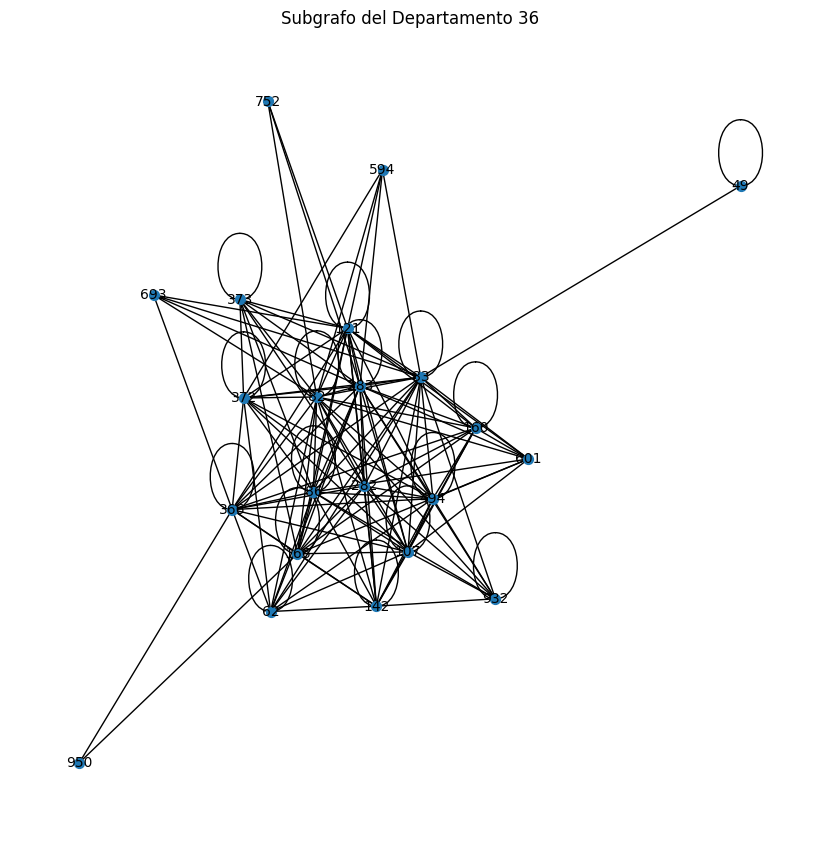

Centralidad para el departamento 37: {np.int64(50): 0.8571428571428571, np.int64(70): 0.5, np.int64(71): 0.9285714285714285, np.int64(84): 1.0, np.int64(152): 0.6428571428571428, np.int64(162): 0.7142857142857142, np.int64(217): 0.8571428571428571, np.int64(288): 0.8571428571428571, np.int64(364): 0.14285714285714285, np.int64(431): 0.7142857142857142, np.int64(432): 0.42857142857142855, np.int64(433): 0.9285714285714285, np.int64(612): 0.5714285714285714, np.int64(643): 0.21428571428571427, np.int64(654): 0.3571428571428571}


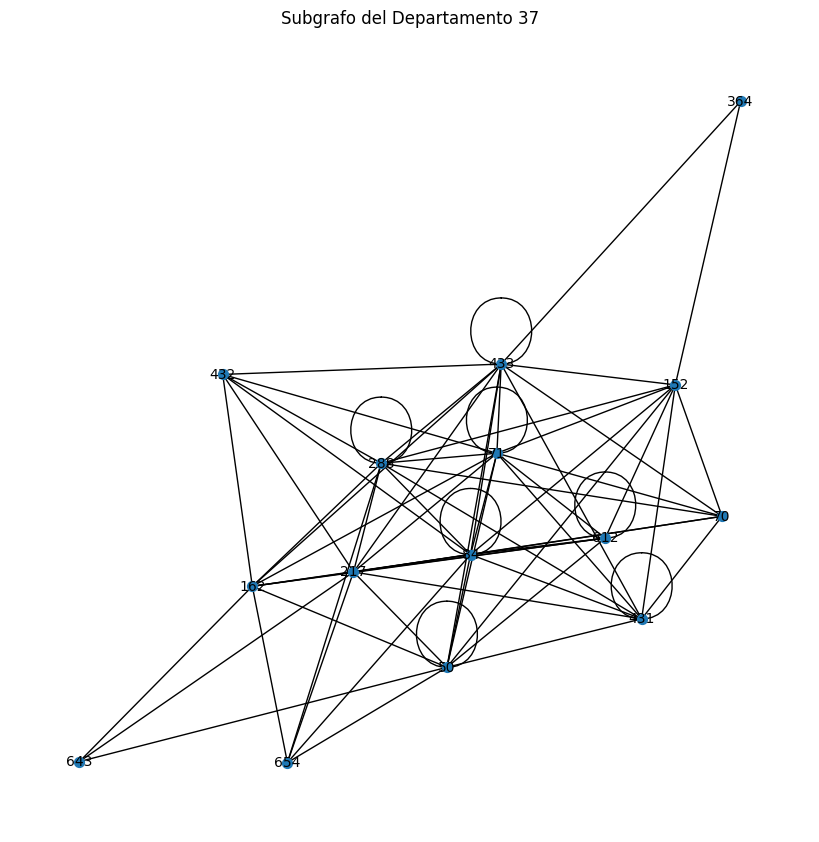

Centralidad para el departamento 7: {np.int64(52): 0.16, np.int64(60): 0.68, np.int64(61): 0.62, np.int64(103): 0.58, np.int64(104): 0.48, np.int64(150): 0.48, np.int64(181): 0.68, np.int64(182): 0.7000000000000001, np.int64(250): 0.46, np.int64(295): 0.8, np.int64(296): 0.52, np.int64(320): 0.56, np.int64(321): 0.68, np.int64(368): 0.52, np.int64(376): 0.7000000000000001, np.int64(377): 0.8, np.int64(378): 0.4, np.int64(379): 0.78, np.int64(380): 0.44, np.int64(381): 0.38, np.int64(382): 0.08, np.int64(383): 0.12, np.int64(384): 0.22, np.int64(385): 0.4, np.int64(386): 0.1, np.int64(387): 0.54, np.int64(388): 0.4, np.int64(389): 0.5, np.int64(390): 0.66, np.int64(391): 0.34, np.int64(392): 0.34, np.int64(393): 0.76, np.int64(394): 0.52, np.int64(395): 0.46, np.int64(396): 0.24, np.int64(397): 0.54, np.int64(398): 0.06, np.int64(628): 0.16, np.int64(632): 0.1, np.int64(653): 0.04, np.int64(719): 0.24, np.int64(741): 0.12, np.int64(761): 0.02, np.int64(772): 0.04, np.int64(841): 0.14, n

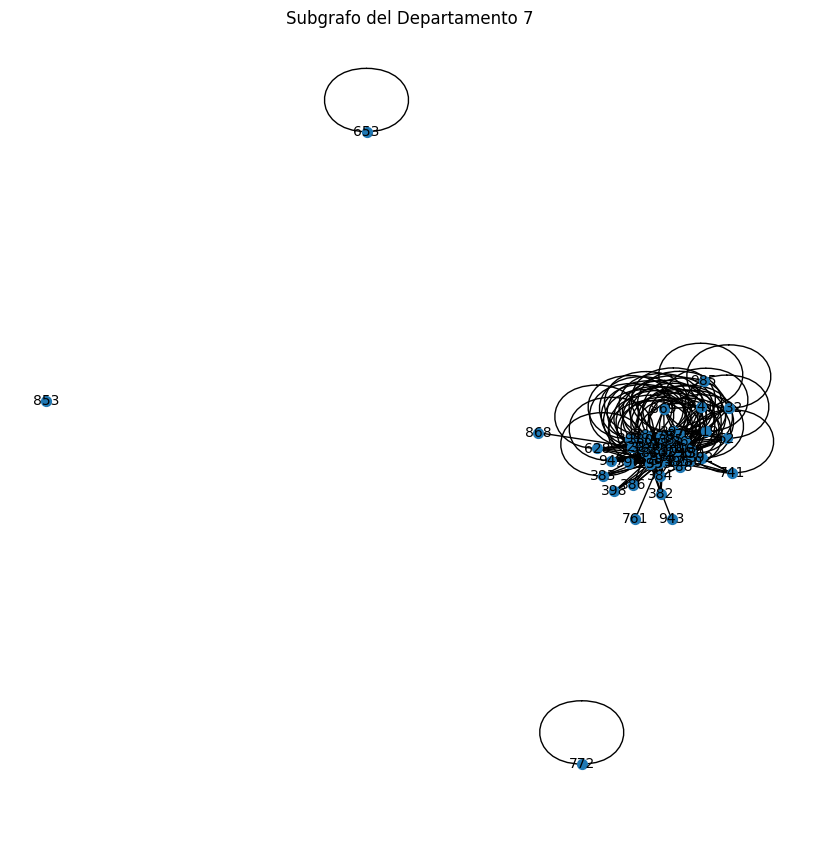

Centralidad para el departamento 22: {np.int64(54): 0.5416666666666666, np.int64(55): 0.5833333333333333, np.int64(126): 0.375, np.int64(208): 0.5, np.int64(211): 0.75, np.int64(285): 0.5833333333333333, np.int64(455): 0.125, np.int64(469): 0.125, np.int64(481): 0.5416666666666666, np.int64(552): 0.5416666666666666, np.int64(604): 0.041666666666666664, np.int64(646): 0.125, np.int64(683): 0.16666666666666666, np.int64(698): 0.5416666666666666, np.int64(728): 0.0, np.int64(738): 0.4583333333333333, np.int64(809): 0.5, np.int64(866): 0.0, np.int64(867): 0.0, np.int64(898): 0.125, np.int64(949): 0.41666666666666663, np.int64(986): 0.0, np.int64(987): 0.0, np.int64(988): 0.0, np.int64(1004): 0.041666666666666664}


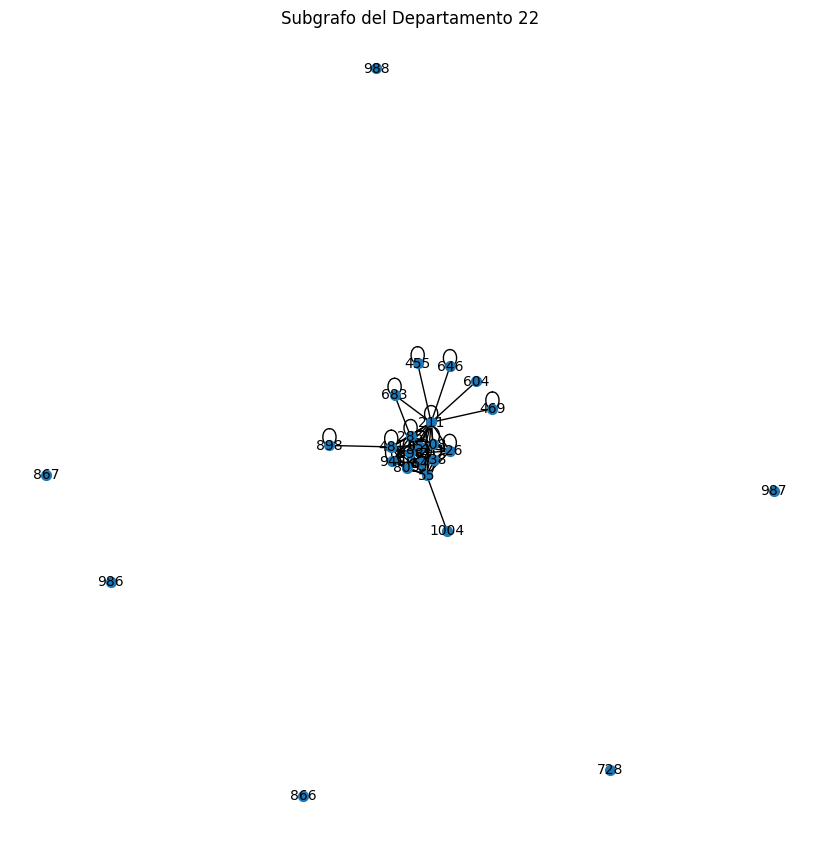

Centralidad para el departamento 8: {np.int64(66): 0.7222222222222222, np.int64(90): 0.611111111111111, np.int64(108): 1.0, np.int64(110): 0.38888888888888884, np.int64(111): 0.3333333333333333, np.int64(112): 0.5, np.int64(143): 0.5555555555555556, np.int64(258): 0.8888888888888888, np.int64(328): 0.6666666666666666, np.int64(329): 0.8888888888888888, np.int64(356): 0.5, np.int64(357): 0.611111111111111, np.int64(375): 1.0, np.int64(475): 0.05555555555555555, np.int64(477): 0.5, np.int64(478): 1.0, np.int64(514): 0.4444444444444444, np.int64(652): 0.16666666666666666, np.int64(989): 0.16666666666666666}


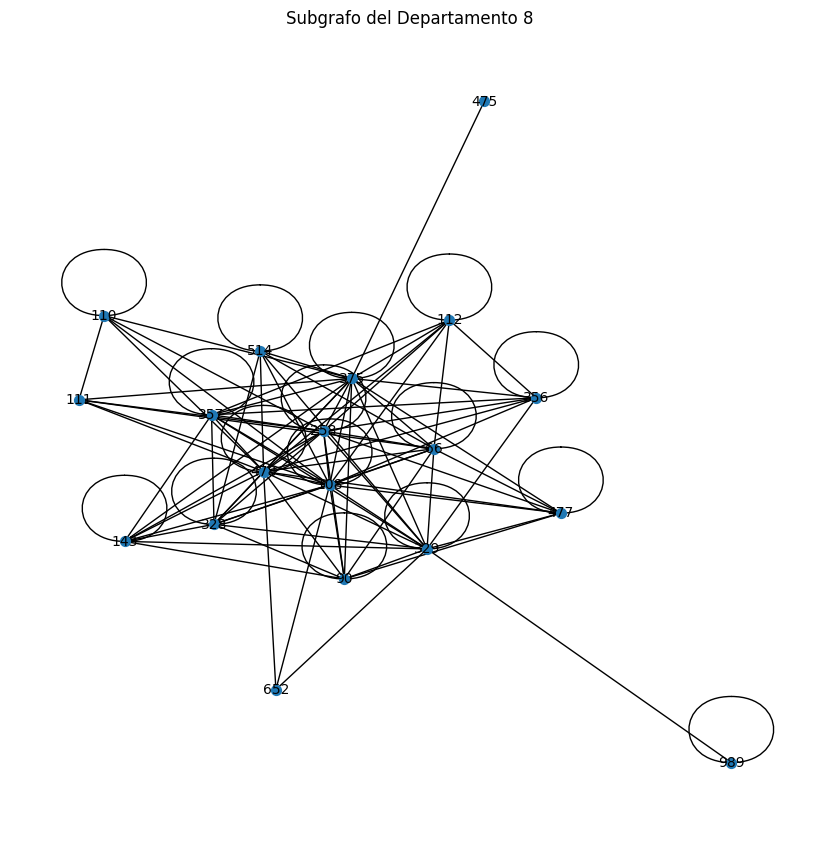

Centralidad para el departamento 15: {np.int64(67): 0.05555555555555555, np.int64(68): 0.2777777777777778, np.int64(69): 0.537037037037037, np.int64(81): 0.4444444444444444, np.int64(91): 0.05555555555555555, np.int64(146): 0.16666666666666666, np.int64(184): 0.5555555555555556, np.int64(187): 0.2037037037037037, np.int64(188): 0.2037037037037037, np.int64(189): 0.5740740740740741, np.int64(190): 0.14814814814814814, np.int64(287): 0.2222222222222222, np.int64(298): 0.12962962962962962, np.int64(299): 0.3333333333333333, np.int64(418): 0.35185185185185186, np.int64(467): 0.1111111111111111, np.int64(473): 0.4629629629629629, np.int64(474): 0.14814814814814814, np.int64(476): 0.018518518518518517, np.int64(480): 0.2037037037037037, np.int64(508): 0.3333333333333333, np.int64(509): 0.5, np.int64(536): 0.09259259259259259, np.int64(540): 0.09259259259259259, np.int64(549): 0.7222222222222222, np.int64(550): 0.2037037037037037, np.int64(551): 0.16666666666666666, np.int64(582): 0.166666666

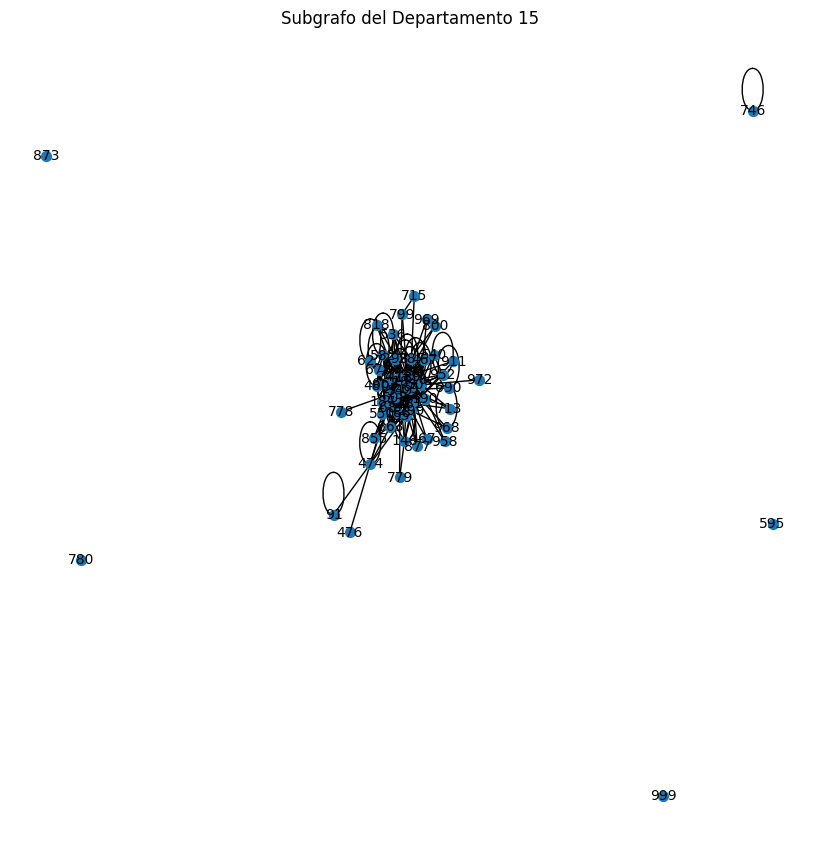

Centralidad para el departamento 3: {np.int64(77): 0.8181818181818182, np.int64(78): 0.5454545454545454, np.int64(79): 1.0, np.int64(445): 0.5454545454545454, np.int64(483): 0.18181818181818182, np.int64(497): 0.5454545454545454, np.int64(531): 0.9090909090909092, np.int64(539): 0.36363636363636365, np.int64(557): 0.36363636363636365, np.int64(581): 0.8181818181818182, np.int64(811): 0.36363636363636365, np.int64(848): 0.09090909090909091}


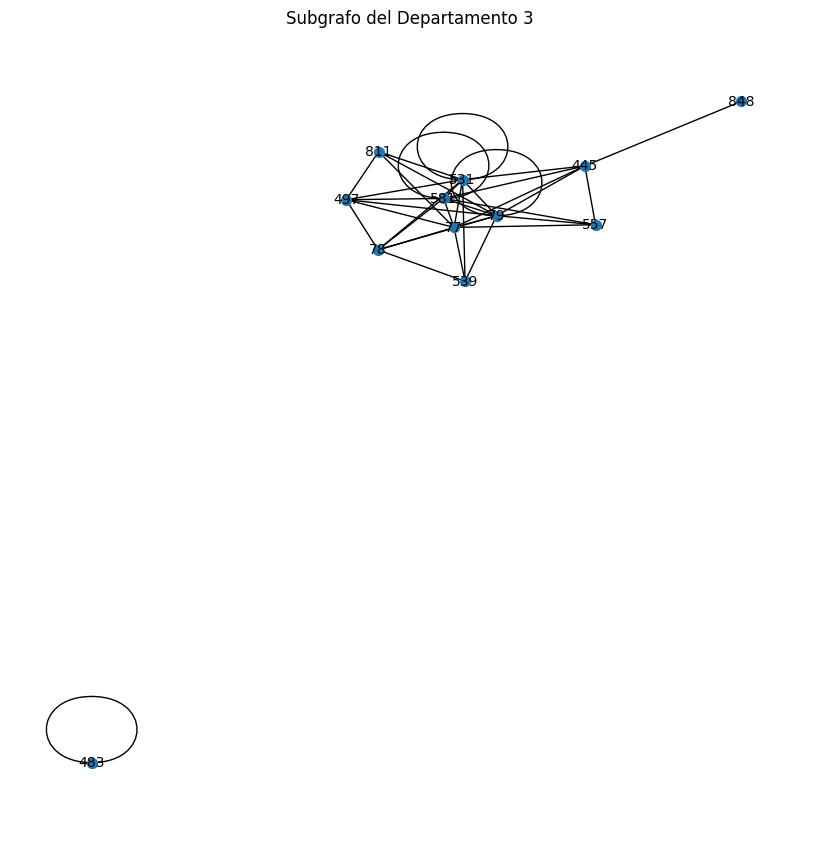

Centralidad para el departamento 29: {np.int64(80): 1.0, np.int64(671): 0.25, np.int64(679): 0.75, np.int64(716): 0.5, np.int64(966): 0.0}


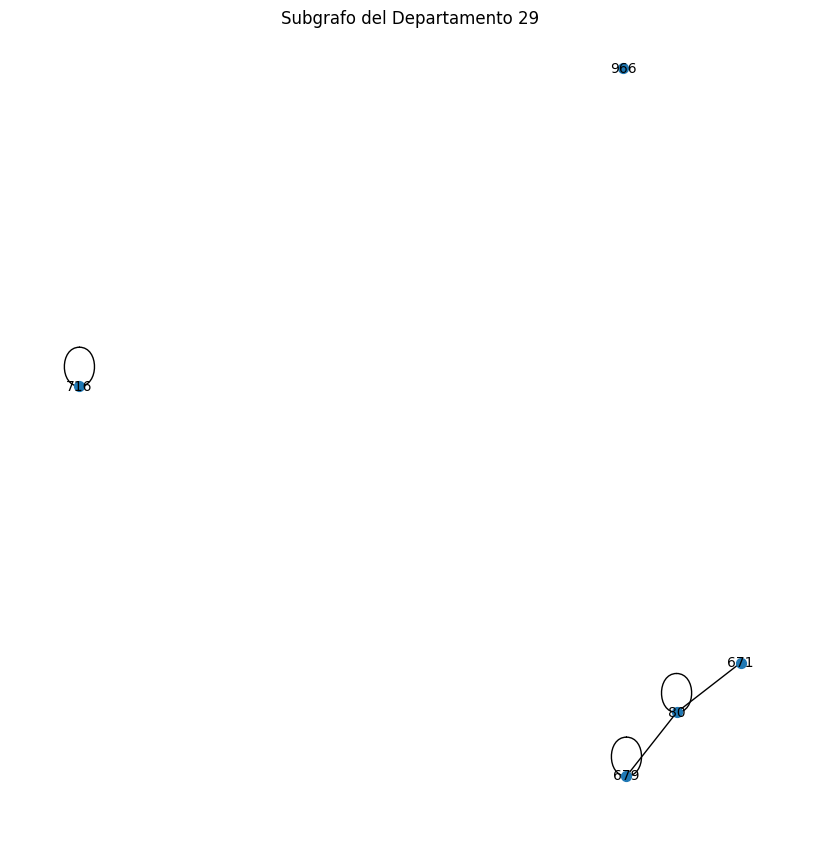

Centralidad para el departamento 20: {np.int64(88): 0.9230769230769231, np.int64(89): 0.8461538461538463, np.int64(96): 0.7692307692307693, np.int64(252): 0.8461538461538463, np.int64(302): 0.6153846153846154, np.int64(303): 0.8461538461538463, np.int64(304): 0.7692307692307693, np.int64(369): 0.5384615384615385, np.int64(630): 0.3076923076923077, np.int64(740): 0.07692307692307693, np.int64(750): 0.07692307692307693, np.int64(806): 0.38461538461538464, np.int64(808): 0.15384615384615385, np.int64(924): 0.38461538461538464}


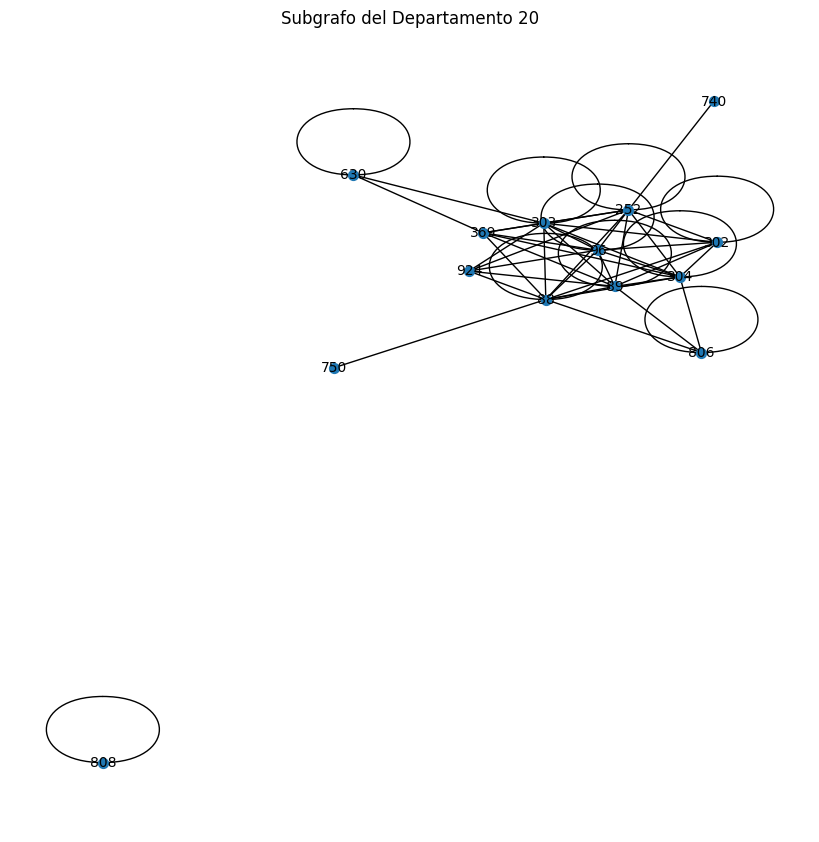

Centralidad para el departamento 16: {np.int64(97): 0.7916666666666666, np.int64(98): 0.7083333333333333, np.int64(99): 0.7083333333333333, np.int64(100): 0.9166666666666666, np.int64(101): 0.625, np.int64(124): 0.7916666666666666, np.int64(125): 0.8333333333333333, np.int64(185): 0.7916666666666666, np.int64(323): 0.7916666666666666, np.int64(353): 1.0, np.int64(354): 0.4583333333333333, np.int64(371): 0.7083333333333333, np.int64(404): 0.9166666666666666, np.int64(580): 0.08333333333333333, np.int64(618): 0.5, np.int64(640): 0.5833333333333333, np.int64(662): 0.4583333333333333, np.int64(687): 0.16666666666666666, np.int64(708): 0.5833333333333333, np.int64(709): 0.125, np.int64(768): 0.5833333333333333, np.int64(770): 0.041666666666666664, np.int64(842): 0.0, np.int64(935): 0.16666666666666666, np.int64(937): 0.3333333333333333}


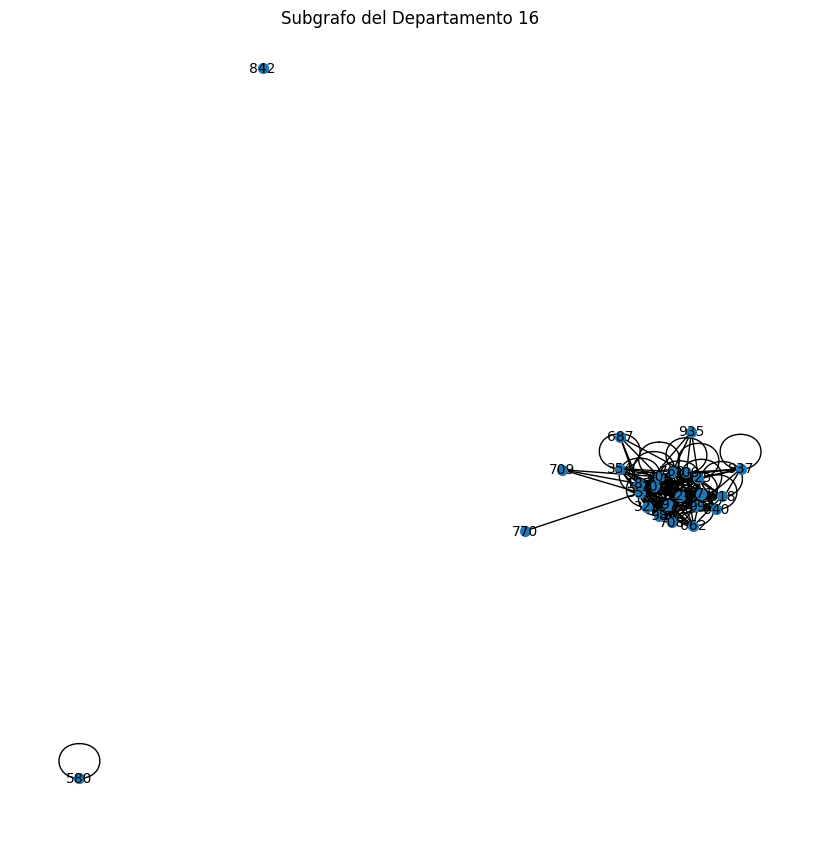

Centralidad para el departamento 38: {np.int64(102): 0.3333333333333333, np.int64(106): 0.5, np.int64(173): 0.5, np.int64(300): 0.9166666666666666, np.int64(405): 1.0, np.int64(638): 0.3333333333333333, np.int64(771): 0.08333333333333333, np.int64(773): 0.25, np.int64(828): 0.5, np.int64(889): 0.25, np.int64(891): 0.16666666666666666, np.int64(892): 0.6666666666666666, np.int64(896): 0.6666666666666666}


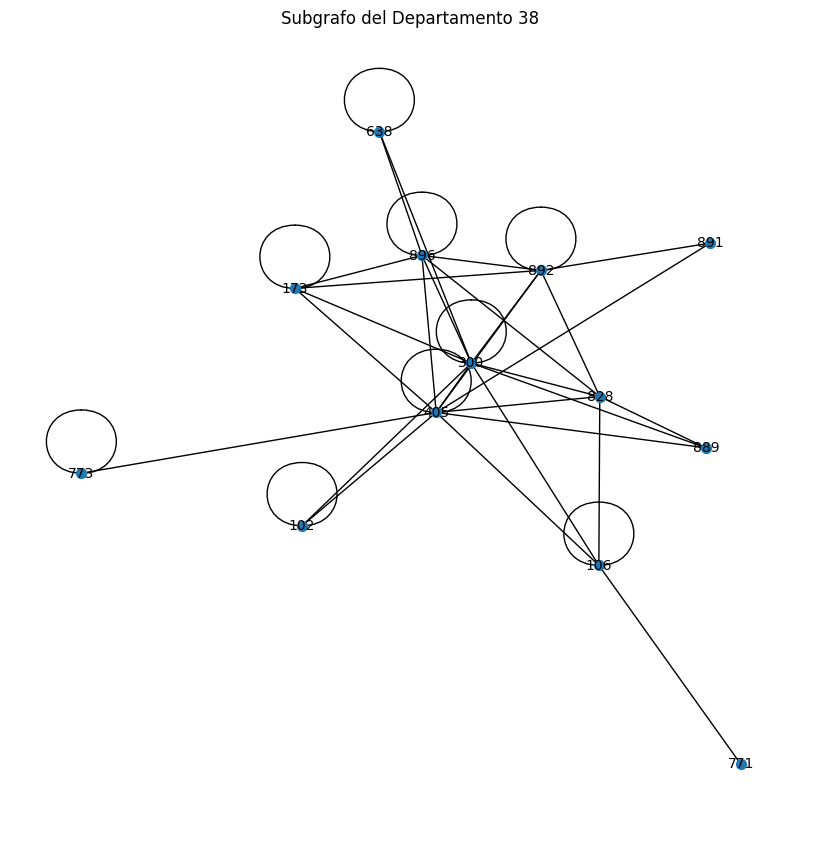

Centralidad para el departamento 27: {np.int64(109): 0.0, np.int64(153): 0.0, np.int64(355): 0.2222222222222222, np.int64(410): 0.0, np.int64(454): 0.0, np.int64(559): 0.3333333333333333, np.int64(577): 0.1111111111111111, np.int64(578): 0.1111111111111111, np.int64(736): 0.2222222222222222, np.int64(769): 0.1111111111111111}


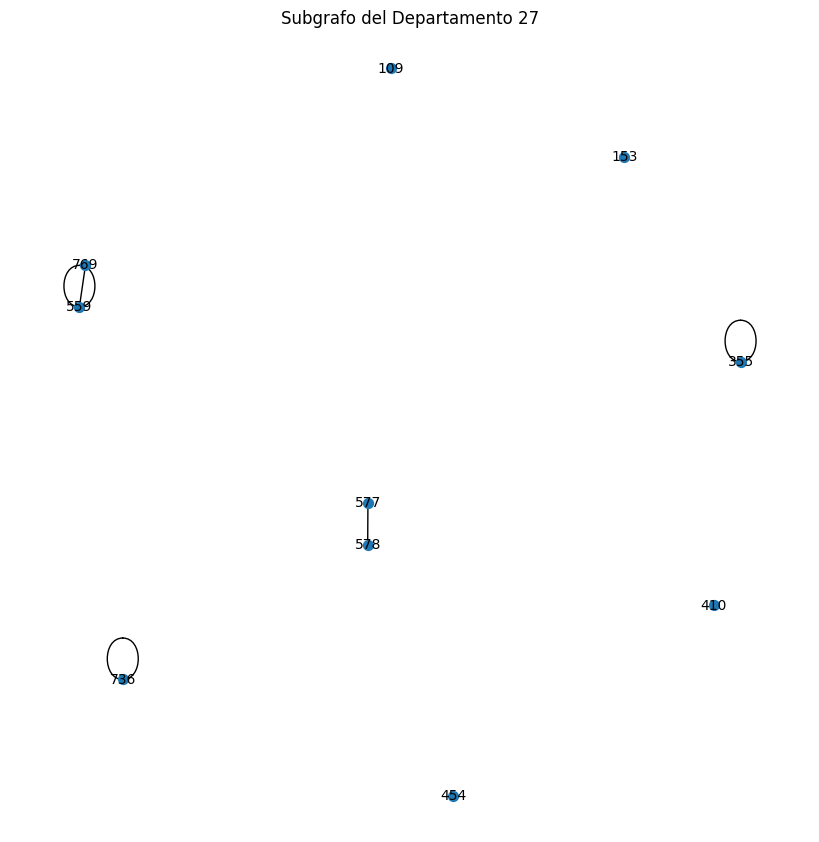

Centralidad para el departamento 13: {np.int64(115): 0.96, np.int64(116): 0.8, np.int64(123): 0.56, np.int64(135): 0.68, np.int64(136): 0.6, np.int64(165): 0.88, np.int64(169): 0.8, np.int64(170): 0.8, np.int64(251): 0.72, np.int64(330): 0.16, np.int64(336): 0.72, np.int64(337): 0.68, np.int64(338): 0.84, np.int64(339): 0.72, np.int64(436): 0.12, np.int64(437): 0.76, np.int64(438): 0.8, np.int64(439): 0.08, np.int64(609): 0.08, np.int64(724): 0.04, np.int64(816): 0.44, np.int64(860): 0.84, np.int64(883): 0.32, np.int64(900): 0.56, np.int64(914): 0.52, np.int64(978): 0.16}


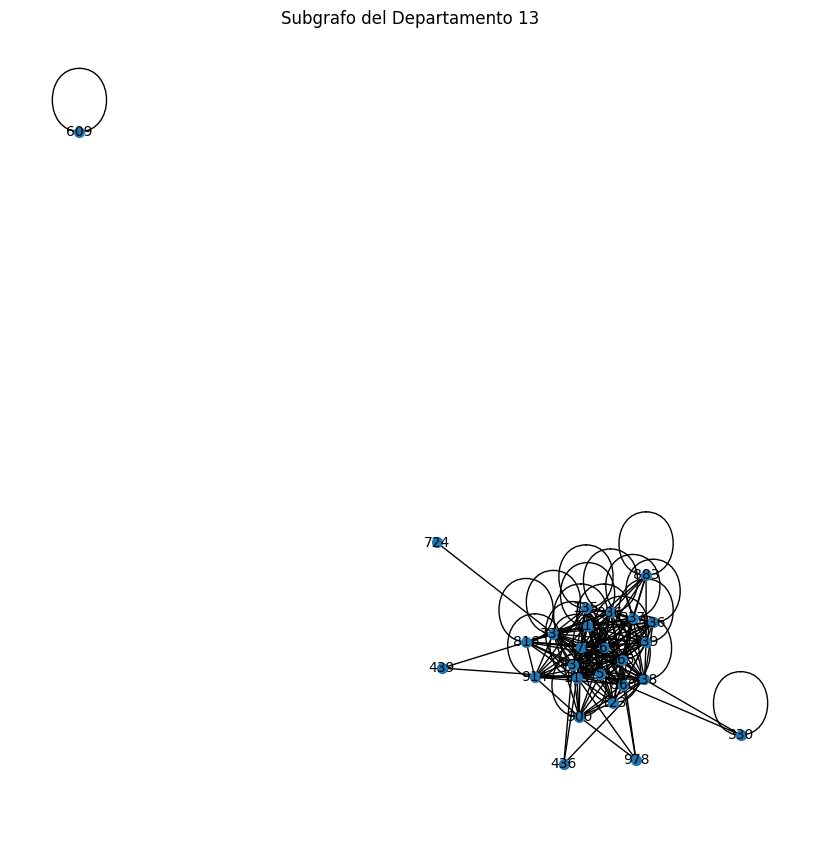

Centralidad para el departamento 6: {np.int64(117): 0.14814814814814814, np.int64(127): 0.1111111111111111, np.int64(255): 0.18518518518518517, np.int64(435): 0.2222222222222222, np.int64(453): 0.2222222222222222, np.int64(472): 0.1111111111111111, np.int64(490): 0.1111111111111111, np.int64(491): 0.25925925925925924, np.int64(537): 0.1111111111111111, np.int64(548): 0.037037037037037035, np.int64(610): 0.14814814814814814, np.int64(613): 0.2222222222222222, np.int64(616): 0.037037037037037035, np.int64(619): 0.037037037037037035, np.int64(642): 0.07407407407407407, np.int64(647): 0.1111111111111111, np.int64(659): 0.07407407407407407, np.int64(686): 0.0, np.int64(745): 0.1111111111111111, np.int64(782): 0.0, np.int64(834): 0.0, np.int64(837): 0.07407407407407407, np.int64(939): 0.0, np.int64(942): 0.037037037037037035, np.int64(948): 0.0, np.int64(960): 0.0, np.int64(995): 0.0, np.int64(1003): 0.0}


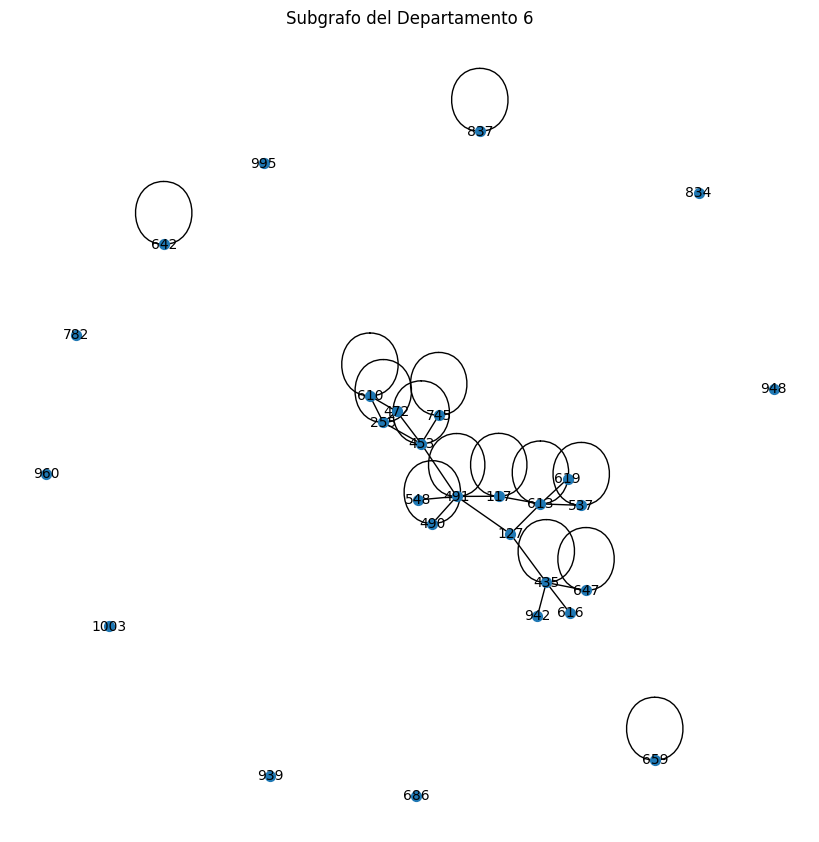

Centralidad para el departamento 0: {np.int64(122): 0.29166666666666663, np.int64(130): 0.3125, np.int64(148): 0.20833333333333331, np.int64(149): 0.35416666666666663, np.int64(156): 0.20833333333333331, np.int64(157): 0.5208333333333333, np.int64(178): 0.3333333333333333, np.int64(179): 0.41666666666666663, np.int64(180): 0.7083333333333333, np.int64(191): 0.7708333333333333, np.int64(214): 0.3958333333333333, np.int64(231): 0.5208333333333333, np.int64(257): 0.125, np.int64(262): 0.41666666666666663, np.int64(277): 0.25, np.int64(278): 0.41666666666666663, np.int64(284): 0.375, np.int64(289): 0.0625, np.int64(342): 0.6666666666666666, np.int64(343): 0.25, np.int64(344): 0.29166666666666663, np.int64(345): 0.3958333333333333, np.int64(346): 0.22916666666666666, np.int64(347): 0.3125, np.int64(348): 0.08333333333333333, np.int64(349): 0.3333333333333333, np.int64(350): 0.2708333333333333, np.int64(351): 0.3958333333333333, np.int64(352): 0.3333333333333333, np.int64(402): 0.10416666666

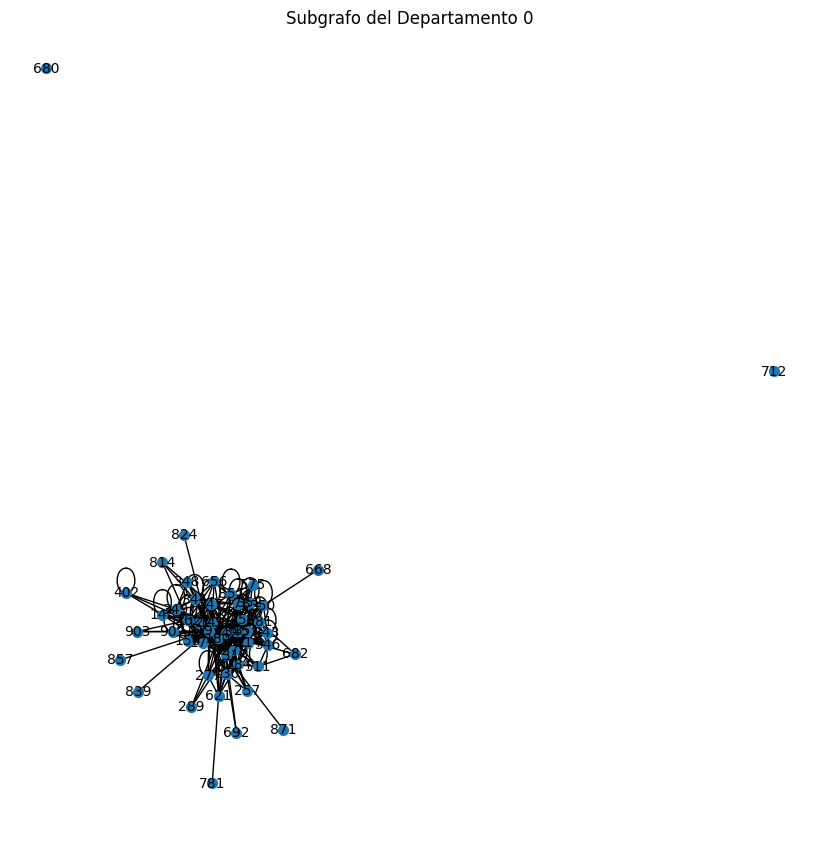

Centralidad para el departamento 28: {np.int64(131): 0.7142857142857142, np.int64(132): 0.8571428571428571, np.int64(271): 0.8571428571428571, np.int64(411): 1.0, np.int64(737): 0.42857142857142855, np.int64(784): 0.42857142857142855, np.int64(807): 0.14285714285714285, np.int64(864): 0.14285714285714285}


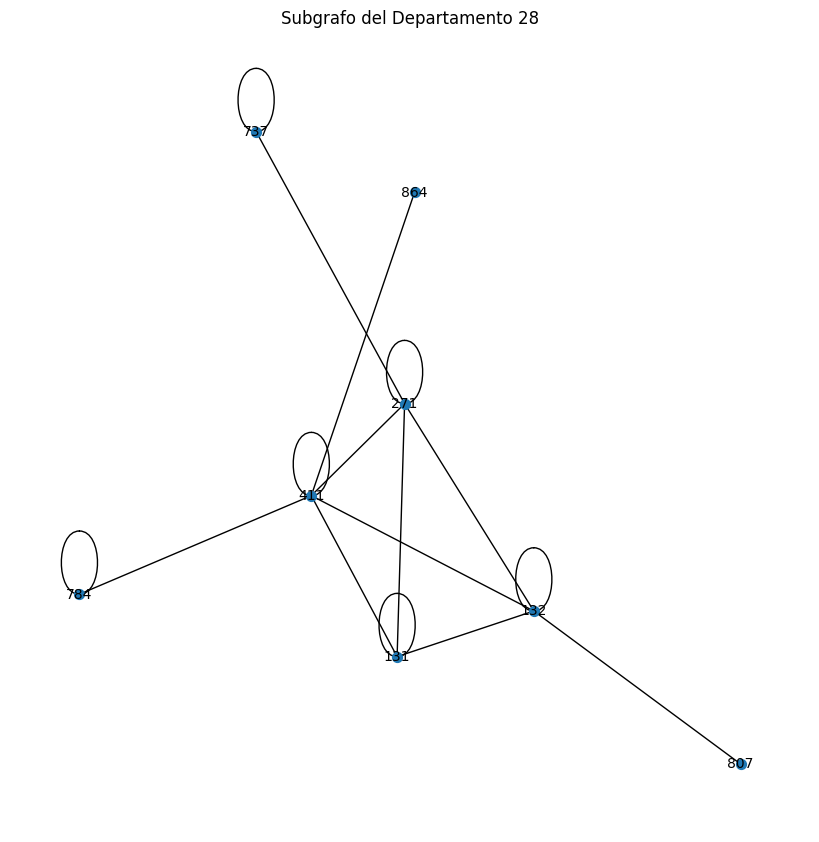

Centralidad para el departamento 2: {np.int64(134): 1.0, np.int64(340): 1.0, np.int64(482): 0.8888888888888888, np.int64(521): 0.8888888888888888, np.int64(553): 0.8888888888888888, np.int64(554): 0.7777777777777777, np.int64(583): 0.1111111111111111, np.int64(598): 0.7777777777777777, np.int64(766): 0.5555555555555556, np.int64(862): 0.0}


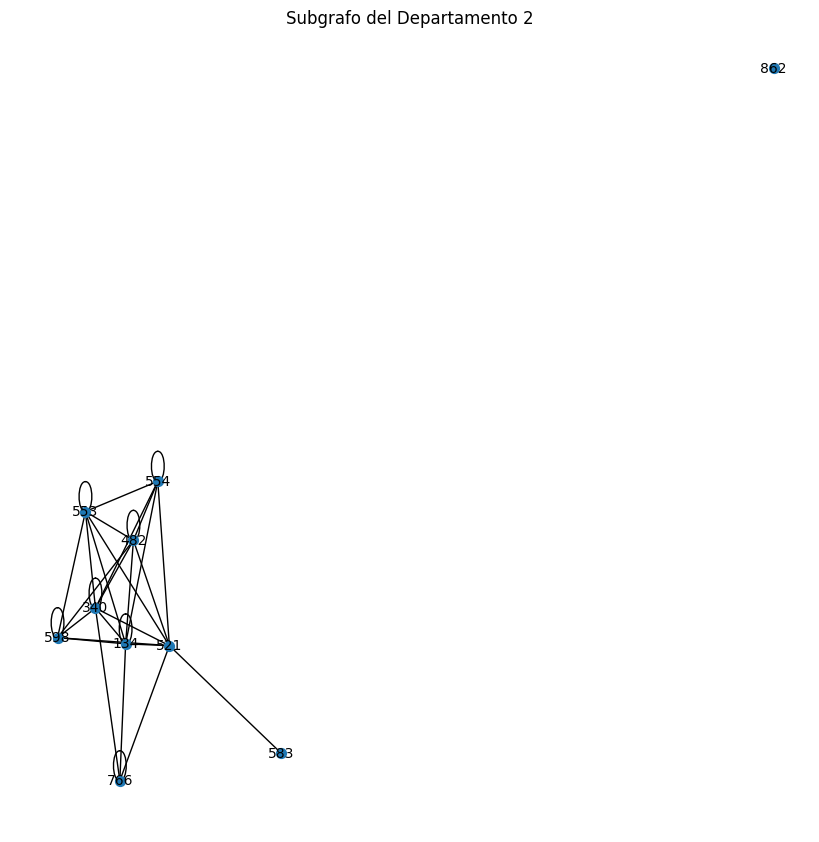

Centralidad para el departamento 40: {np.int64(144): 1.6666666666666665, np.int64(186): 1.6666666666666665, np.int64(254): 1.6666666666666665, np.int64(492): 1.0}


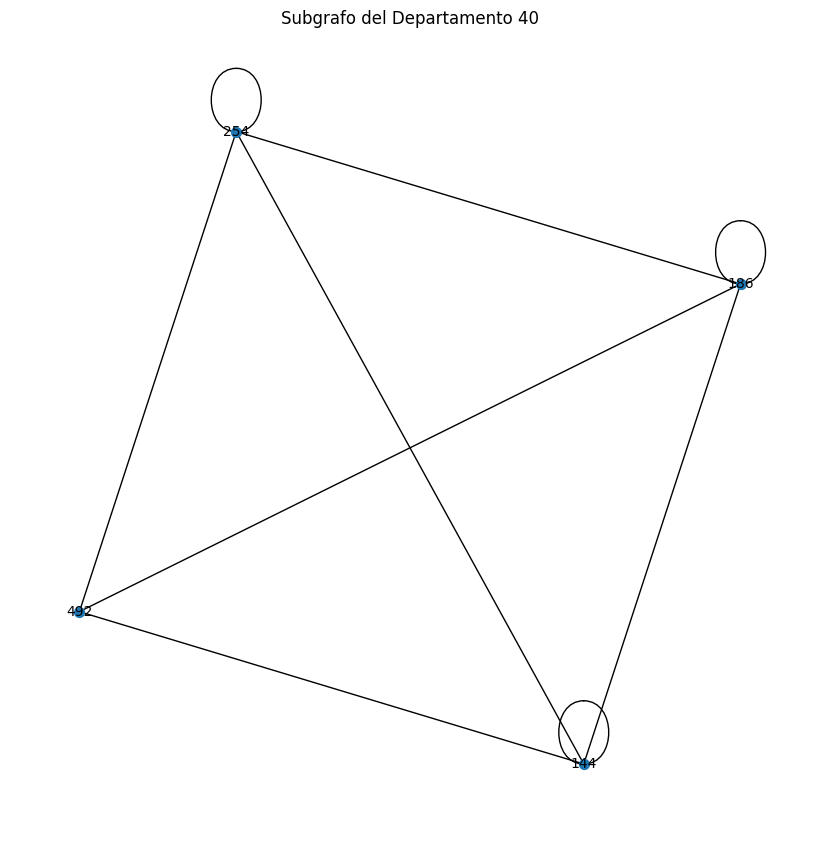

Centralidad para el departamento 35: {np.int64(145): 0.6666666666666666, np.int64(154): 0.8333333333333333, np.int64(155): 0.5833333333333333, np.int64(363): 0.3333333333333333, np.int64(422): 0.6666666666666666, np.int64(513): 0.5833333333333333, np.int64(518): 1.0, np.int64(533): 0.5, np.int64(546): 0.9166666666666666, np.int64(615): 0.75, np.int64(934): 0.0, np.int64(954): 0.3333333333333333, np.int64(984): 0.0}


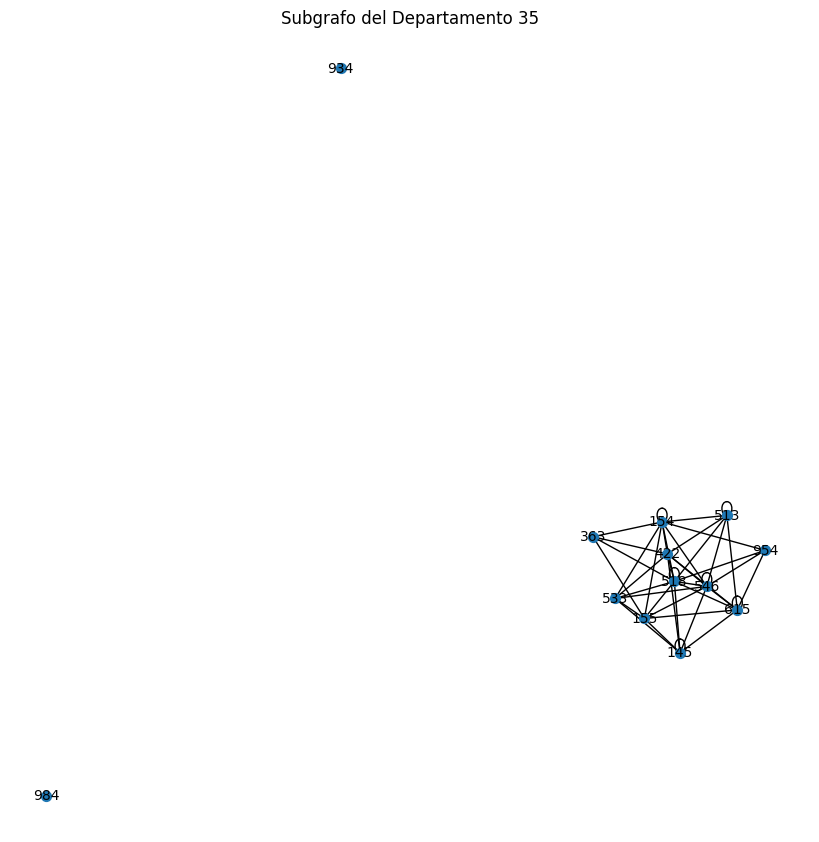

Centralidad para el departamento 23: {np.int64(147): 0.038461538461538464, np.int64(230): 0.11538461538461539, np.int64(279): 0.07692307692307693, np.int64(465): 0.15384615384615385, np.int64(495): 0.19230769230769232, np.int64(512): 0.07692307692307693, np.int64(519): 0.15384615384615385, np.int64(541): 0.11538461538461539, np.int64(589): 0.07692307692307693, np.int64(591): 0.07692307692307693, np.int64(596): 0.11538461538461539, np.int64(597): 0.15384615384615385, np.int64(641): 0.2692307692307693, np.int64(669): 0.15384615384615385, np.int64(673): 0.11538461538461539, np.int64(695): 0.15384615384615385, np.int64(730): 0.07692307692307693, np.int64(742): 0.07692307692307693, np.int64(748): 0.23076923076923078, np.int64(783): 0.038461538461538464, np.int64(786): 0.15384615384615385, np.int64(793): 0.038461538461538464, np.int64(906): 0.0, np.int64(920): 0.038461538461538464, np.int64(944): 0.038461538461538464, np.int64(946): 0.038461538461538464, np.int64(979): 0.07692307692307693}


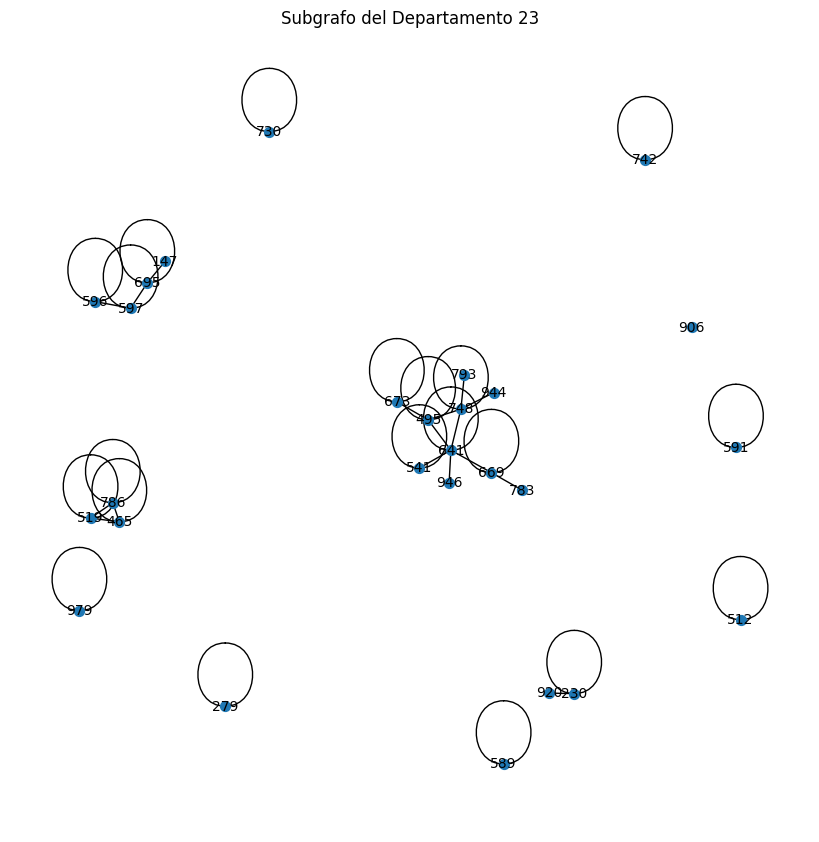

Centralidad para el departamento 19: {np.int64(158): 0.9285714285714285, np.int64(159): 0.75, np.int64(209): 0.8571428571428571, np.int64(210): 0.7142857142857142, np.int64(233): 0.6428571428571428, np.int64(234): 0.8928571428571428, np.int64(235): 0.5357142857142857, np.int64(236): 0.6785714285714285, np.int64(237): 0.6785714285714285, np.int64(238): 0.6785714285714285, np.int64(239): 0.17857142857142855, np.int64(240): 0.5714285714285714, np.int64(241): 0.6071428571428571, np.int64(242): 0.7857142857142857, np.int64(243): 0.7857142857142857, np.int64(244): 0.5357142857142857, np.int64(319): 0.3571428571428571, np.int64(564): 0.17857142857142855, np.int64(599): 0.14285714285714285, np.int64(631): 0.14285714285714285, np.int64(637): 0.17857142857142855, np.int64(639): 0.17857142857142855, np.int64(879): 0.03571428571428571, np.int64(926): 0.46428571428571425, np.int64(927): 0.46428571428571425, np.int64(930): 0.42857142857142855, np.int64(931): 0.5, np.int64(963): 0.75, np.int64(977): 

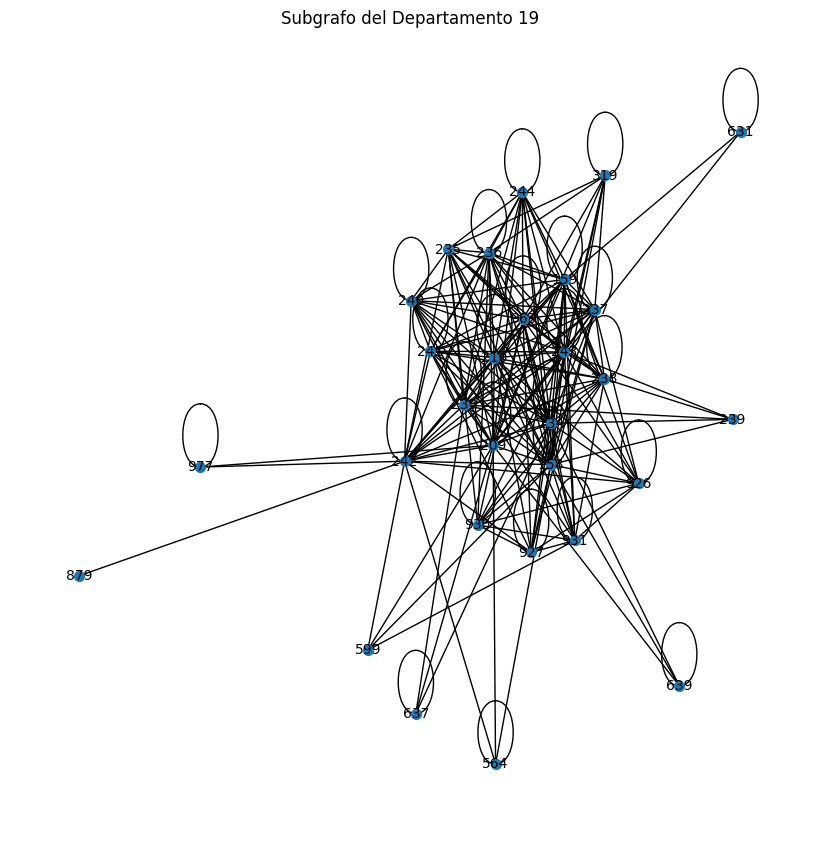

Centralidad para el departamento 24: {np.int64(163): 0.2, np.int64(614): 0.4, np.int64(717): 0.6000000000000001, np.int64(788): 0.6000000000000001, np.int64(792): 0.0, np.int64(821): 0.2}


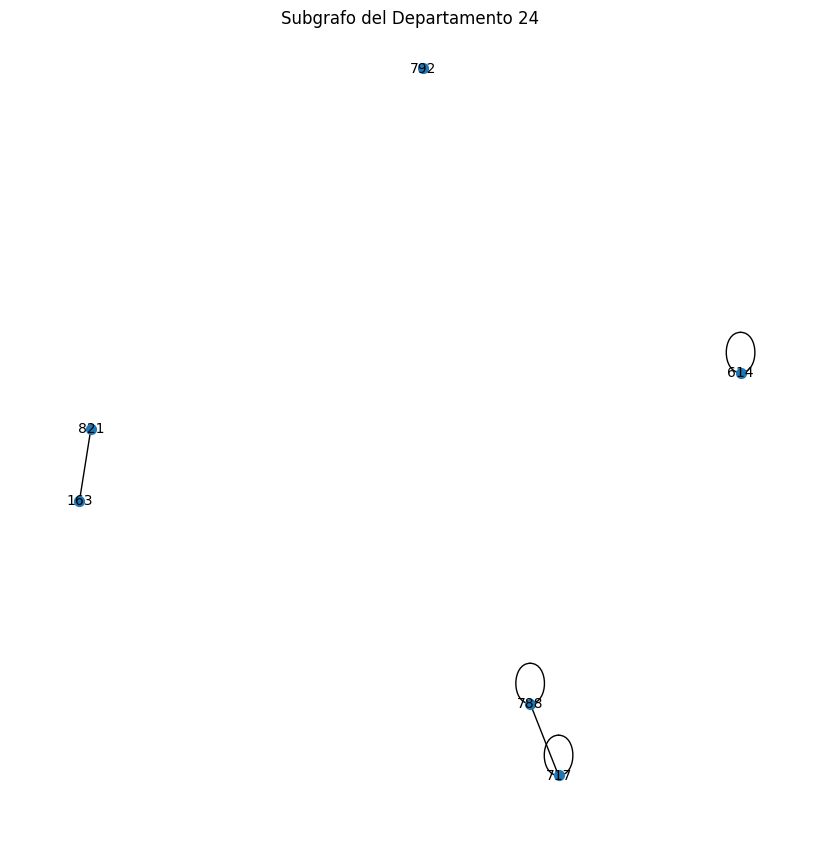

Centralidad para el departamento 32: {np.int64(174): 0.875, np.int64(175): 0.25, np.int64(665): 0.875, np.int64(812): 1.0, np.int64(859): 1.0, np.int64(886): 0.375, np.int64(888): 0.0, np.int64(971): 0.625, np.int64(991): 0.25}


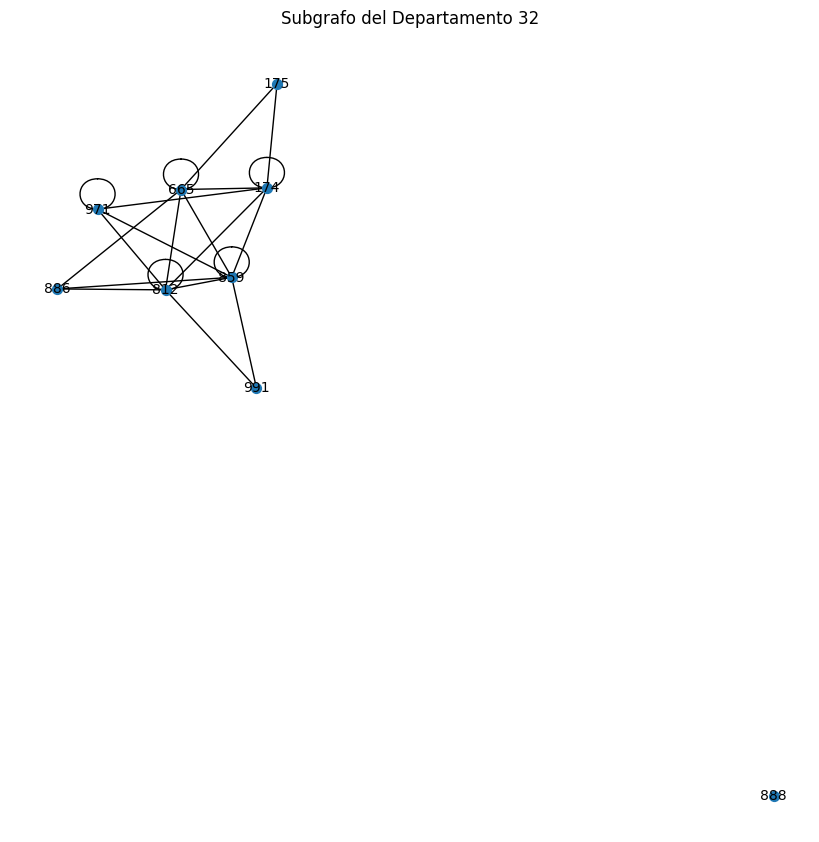

Centralidad para el departamento 31: {np.int64(253): 0.0, np.int64(471): 0.0, np.int64(507): 0.2857142857142857, np.int64(560): 0.0, np.int64(726): 0.2857142857142857, np.int64(759): 0.0, np.int64(831): 0.0, np.int64(875): 0.0}


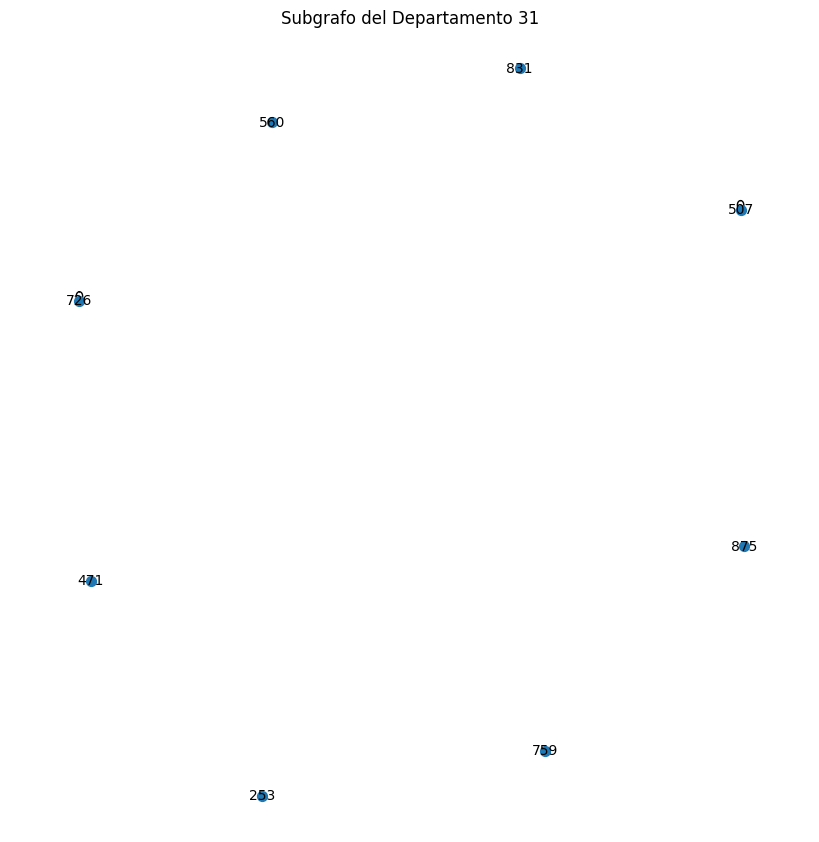

Centralidad para el departamento 39: {np.int64(268): 0.5, np.int64(331): 0.0, np.int64(756): 1.5}


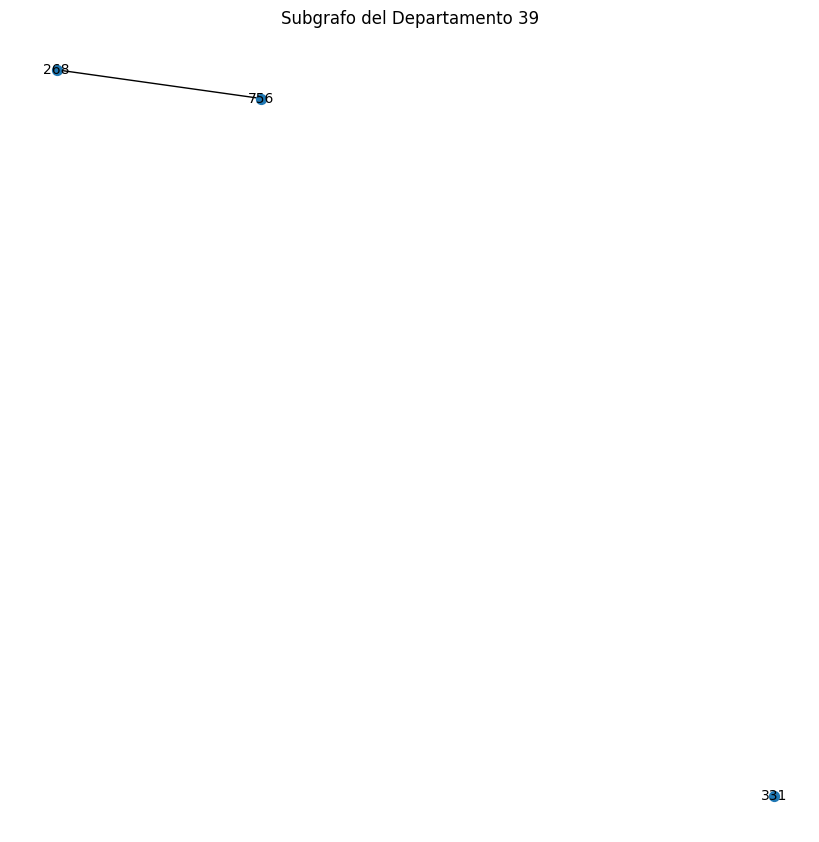

Centralidad para el departamento 12: {np.int64(427): 2.0, np.int64(470): 2.0, np.int64(980): 2.0}


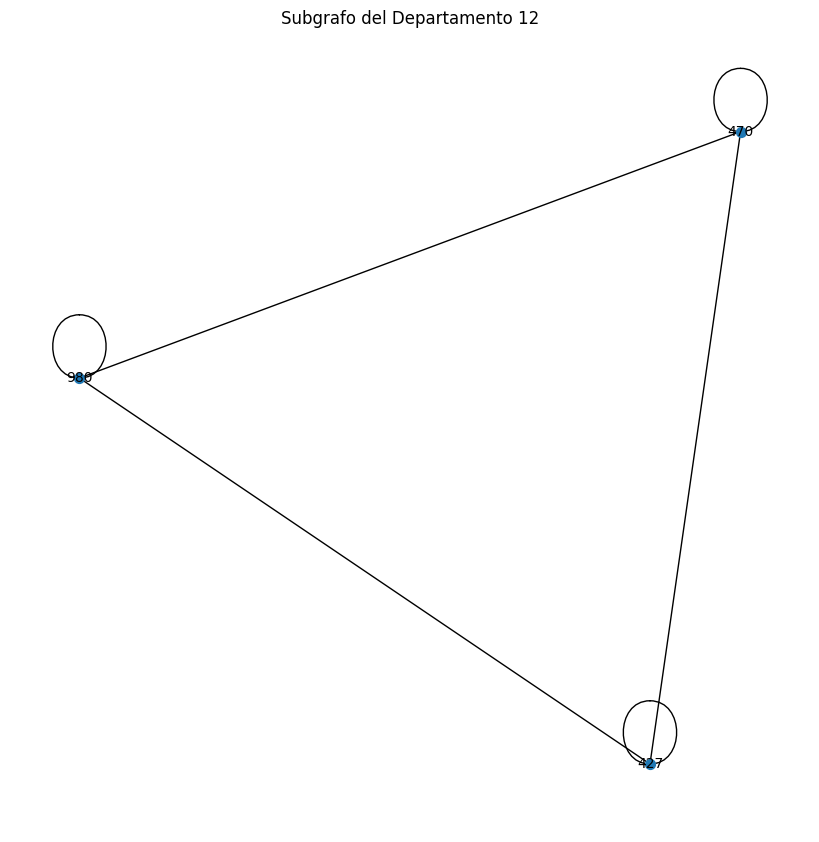

Centralidad para el departamento 30: {np.int64(462): 1.3333333333333333, np.int64(463): 1.0, np.int64(701): 0.3333333333333333, np.int64(876): 0.0}


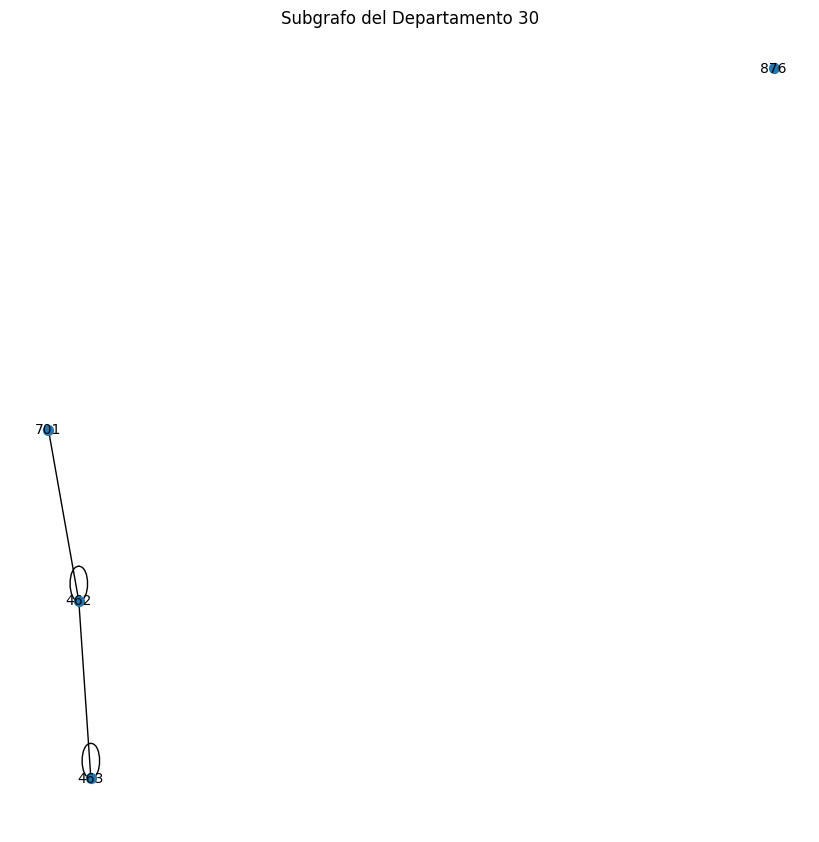

Centralidad para el departamento 41: {np.int64(758): 2.0, np.int64(941): 0.0}


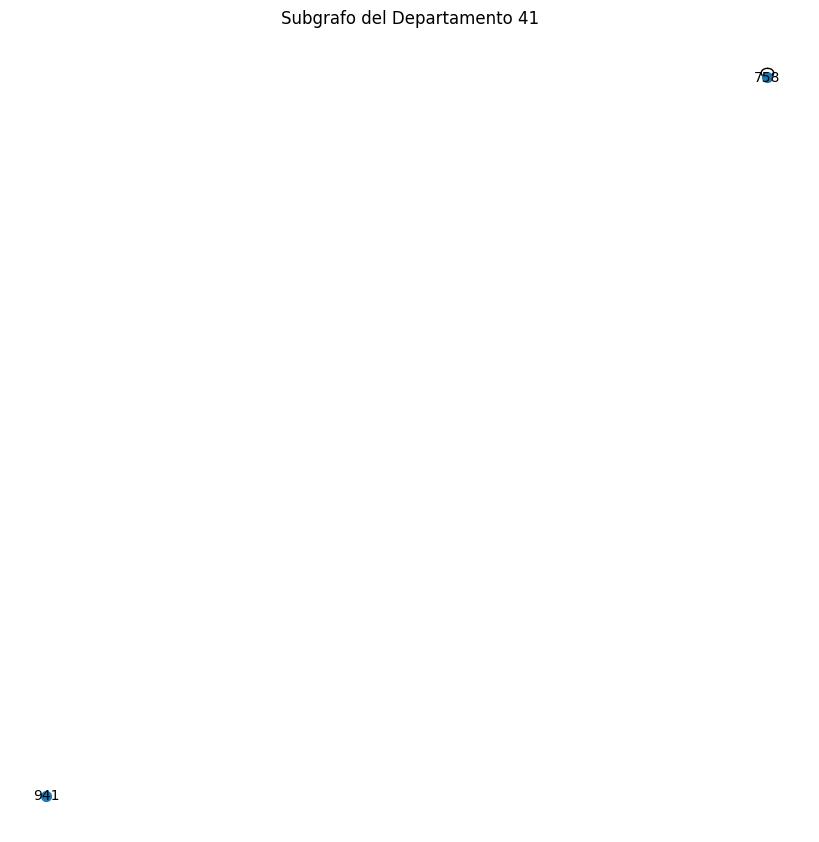

Centralidad para el departamento 18: {np.int64(767): 1}


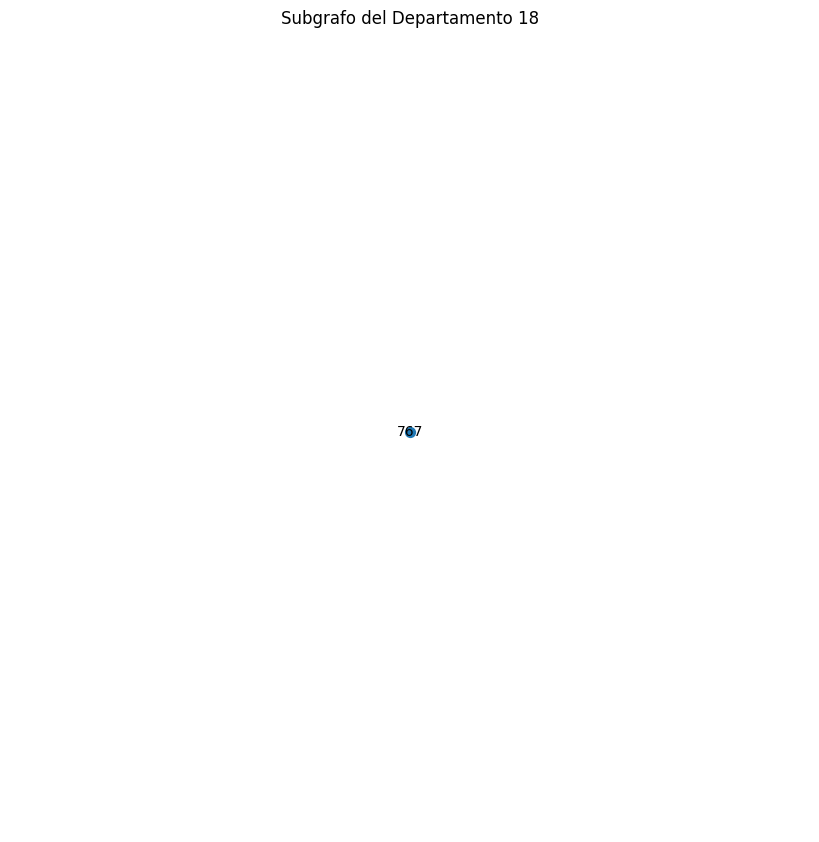

Centralidad para el departamento 33: {np.int64(870): 1}


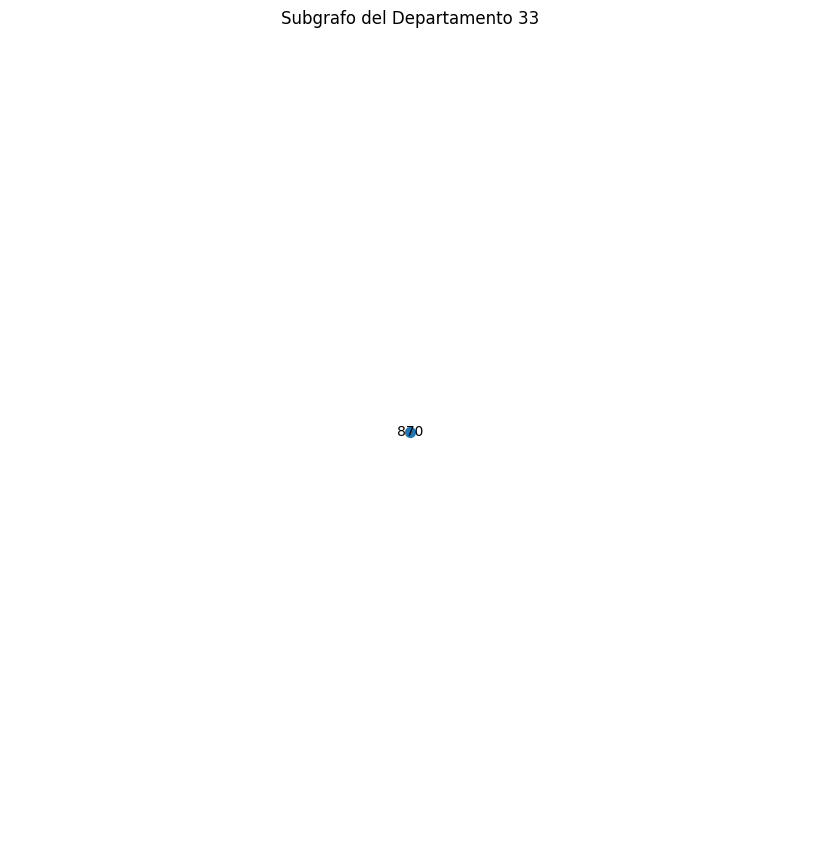

In [ ]:
# Paso 4: Análisis de cada subgrafo (por ejemplo, centralidad)
for dept, subgraph in subgraphs_by_department.items():
    centrality = nx.degree_centrality(subgraph)
    print(f"Centralidad para el departamento {dept}: {centrality}")

    # Visualización del subgrafo
    plt.figure(figsize=(8, 8))
    nx.draw(subgraph, with_labels=True, node_size=50, font_size=10)
    plt.title(f"Subgrafo del Departamento {dept}")
    plt.show()

### Matriz de adyacencia no pesada en red de email con label departamento (cada nodo es un depto)

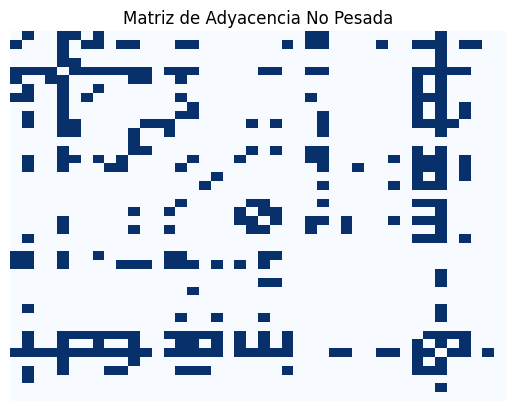

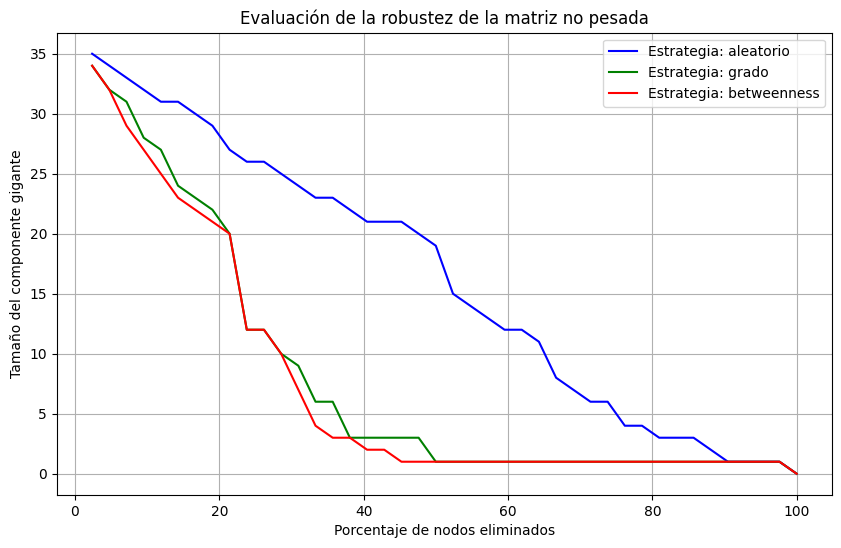

In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Umbral para la matriz binaria
th = 20  # Puedes variar este umbral

# Convertir la matriz ponderada a binaria (0 o 1) según el umbral
matAdyacNoPesada = np.abs(adj_matrix) >= th

# Mostrar la matriz binaria
sns.heatmap(matAdyacNoPesada, cmap='Blues', cbar=False, xticklabels=False, yticklabels=False)
plt.title('Matriz de Adyacencia No Pesada')
plt.show()

# Crear el grafo a partir de la matriz binaria
# Crear el grafo a partir de la matriz binaria usando 'from_numpy_array'
G_no_pesada = nx.from_numpy_array(matAdyacNoPesada)


# Función para calcular el tamaño del componente gigante de la red
def giant_component_size(graph):
    if len(list(nx.connected_components(graph))) > 0:
        return len(max(nx.connected_components(graph), key=len))
    else:
        return 0

# Función para evaluar la robustez con diferentes métodos de eliminación
def evaluate_robustness(graph, strategy):
    G = graph.copy()
    sizes = []
    N = G.number_of_nodes()

    if strategy == 'aleatorio':
        nodes = list(G.nodes())
        np.random.shuffle(nodes)
        for i, node in enumerate(nodes):
            G.remove_node(node)
            percentage_removed = (i + 1) / N * 100
            sizes.append((percentage_removed, giant_component_size(G)))

    elif strategy == 'grado':
        nodes_by_degree = sorted(G.degree(), key=lambda x: x[1], reverse=True)
        nodes = [n for n, _ in nodes_by_degree]
        for i, node in enumerate(nodes):
            G.remove_node(node)
            percentage_removed = (i + 1) / N * 100
            sizes.append((percentage_removed, giant_component_size(G)))

    elif strategy == 'betweenness':
        betweenness = nx.betweenness_centrality(G)
        nodes_by_betweenness = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)
        nodes = [n for n, _ in nodes_by_betweenness]
        for i, node in enumerate(nodes):
            G.remove_node(node)
            percentage_removed = (i + 1) / N * 100
            sizes.append((percentage_removed, giant_component_size(G)))

    return sizes

# Evaluar la robustez para cada estrategia
strategies = ['aleatorio', 'grado', 'betweenness']
colors = ['blue', 'green', 'red']

plt.figure(figsize=(10, 6))

for strategy, color in zip(strategies, colors):
    sizes = evaluate_robustness(G_no_pesada, strategy)
    percentages, component_sizes = zip(*sizes)  # Separar los valores
    plt.plot(percentages, component_sizes, label=f'Estrategia: {strategy}', color=color)

plt.xlabel('Porcentaje de nodos eliminados')
plt.ylabel('Tamaño del componente gigante')
plt.title('Evaluación de la robustez de la matriz no pesada')
plt.legend()
plt.grid(True)
plt.show()
